# Plots to analyze posterior

### Change the following lines to your instalation directory. 

In [1]:
import os, sys
os.chdir('/users/PAS0254/dananjaya/Bayesian_parameter_inferece_for_VAH/emulation_and_calibration')
sys.path.append('../surmise/')

In [2]:
from plotting import *
from priors import xlimits
from priors import prior_VAH

In [3]:
xlimits.shape

(15, 2)

### Load the calibration object (already calibrated) from surmise

In [4]:
import pickle
import pyximport
pyximport.install(setup_args={"include_dirs":np.get_include()},
                  reload_support=True)
                  
cal_name = 'VAH_' + 'PCSK' + '_calibrator_PTMC'
with open(cal_name + '.pkl' , 'rb') as file:
    cal = pickle.load(file)   

In [6]:
random_draws_calibration_chain = False
# By setting above to true we will use surmise inbuilt random resampling of the MCMC chain that has been constructed during calibration.
# We also save the final chain as a csv file. Instead of random resampling we can directly load that. This will be redundant if we add
# a function to the calibration.py to return the full chain from the calibration instead of resampling. 
if random_draws_calibration_chain:
    post = cal.theta.rnd(40000)
    post_df = pd.DataFrame(post,columns=model_param_dsgn)
else:
    post = cal.info['thetarnd']
    post_df = pd.DataFrame(post,columns=model_param_dsgn)
prior = prior_VAH.rnd(post_df.shape[0])
prior_df = pd.DataFrame(prior,columns=model_param_dsgn)


In [7]:
print(post_df.shape, prior_df.shape)

(50000, 15) (50000, 15)


In [8]:
# If false, do not try to find the MAP value and load it from a saved file.
find_map_param = False
cal_name='VAH_PCSK_calibrator_PTMC.pkl_MAP'
from scipy import optimize
if find_map_param == True:
    bounds=[(a,b) for (a,b) in zip(xlimits[:,0],xlimits[:,1])]
    #x0=[(a+b)/2 for (a,b) in zip(xlimits[:,0],xlimits[:,1])] 
    x0=[(a+b)/2 for (a,b) in zip(xlimits[:,0],xlimits[:,1])] 
    print(bounds)
    #rslt = optimize.differential_evolution(lambda x: -cal.theta.lpdf(theta=np.array(x).reshape(-1,15)).flatten(),
    #                                        bounds=bounds,
    #                                       maxiter=100000,
    #                                        tol=1e-9,
    #                                        disp=True)
    minimizer_kwargs = {"method": "L-BFGS-B", "bounds": bounds,"tol":1e-20}
    rslt=optimize.basinhopping(lambda x: -cal.theta.lpdf(theta=np.array(x).reshape(-1,15)).flatten()
                                ,x0,niter=300,minimizer_kwargs=minimizer_kwargs, T=1)
    MAP = rslt.x
    MAP = rslt.x
    np.save(cal_name, MAP)
else:
    MAP = np.load(cal_name+'.npy')

In [9]:
MAP

array([20.01272442,  0.03761852,  0.98491288,  0.87764854,  1.18366635,
        0.14595191,  0.21900409,  0.09413407, -0.38276221,  0.492735  ,
        0.04370106,  0.234626  ,  0.03171797,  0.03689374,  0.65334705])

In [ ]:
nsamples = 50000
prune = 1
method_name = 'final_posterior'
plot_shear(post_df,method_name,xlimits, nsamples,prune, MAP=None, closure=None)
plot_bulk(post_df,method_name,xlimits, nsamples,prune,  MAP=None, closure=None)

/users/PAS0254/dananjaya/Bayesian_parameter_inferece_for_VAH/emulation_and_calibration/plotting.py:491: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.tight_layout()


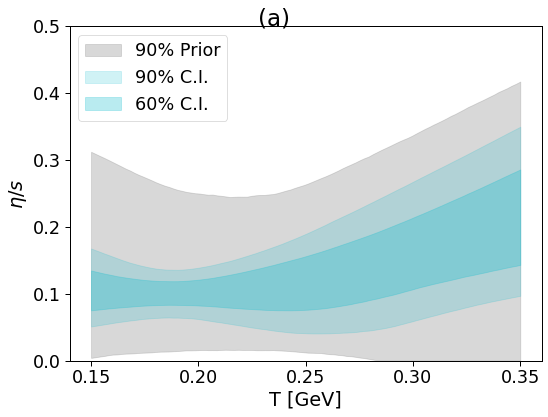

/users/PAS0254/dananjaya/Bayesian_parameter_inferece_for_VAH/emulation_and_calibration/plotting.py:561: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.tight_layout()


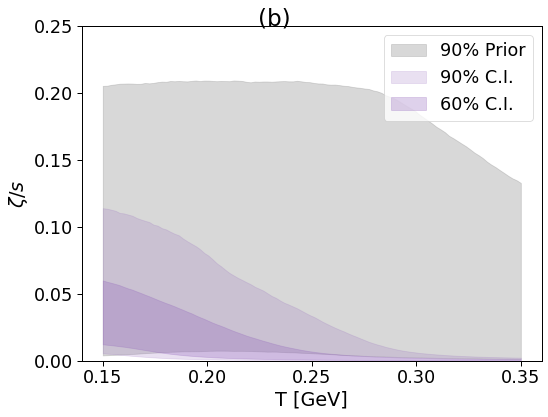

In [14]:
method_name = 'split_N'
plot_shear(post_df[post_df['$N$[$2.76$TeV]']<=25],method_name+'/25_lower_N',xlimits, nsamples,prune, MAP=None, closure=None, legend=True)
plot_bulk(post_df[post_df['$N$[$2.76$TeV]']<=25],method_name+ '/25_lower_N',xlimits, nsamples,prune,  MAP=None, closure=None, legend=True)

/users/PAS0254/dananjaya/Bayesian_parameter_inferece_for_VAH/emulation_and_calibration/plotting.py:491: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.tight_layout()


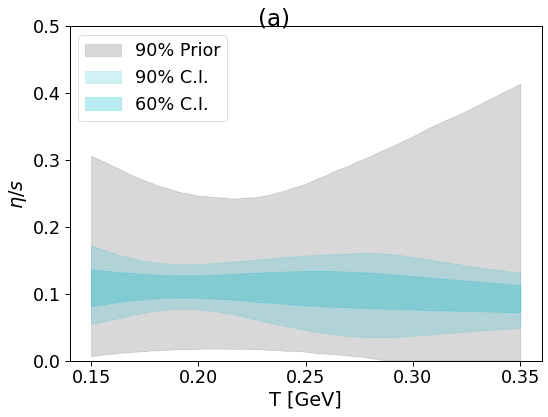

In [ ]:
plot_shear(post_df[post_df['$N$[$2.76$TeV]']>25],method_name+'/25_higher_N',xlimits, nsamples,prune, MAP=None, closure=None, legend=True)
plot_bulk(post_df[post_df['$N$[$2.76$TeV]']>25],method_name+ '/25_higher_N',xlimits, nsamples,prune, MAP=None, closure=None, legend=True)

<ipython-input-10-2076821a29bc>:41: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.tight_layout()


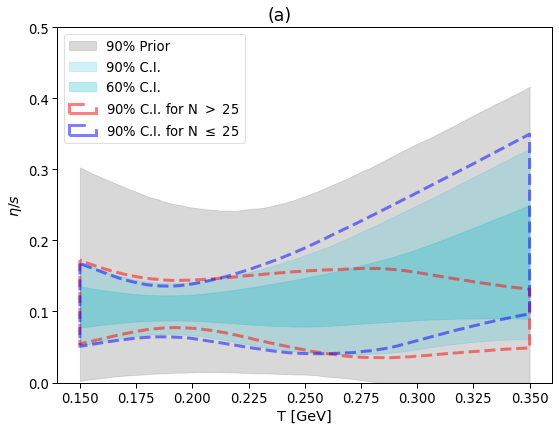

In [10]:
sns.set_context('paper', font_scale=1.5)
Tt = np.linspace(0.15, 0.35, 100)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8,6), sharex=False, sharey=False, constrained_layout=True)
fig.suptitle("(a)",y=1)
method_name = 'final_posterior'
pos_percentile=np.load(f'{method_name}/shear_posterior.npy')
per0,per5,per20,per80,per95,per100=pos_percentile
prior_percentile = np.load(f'{method_name}/shear_prior.npy')
per0_pr,per5_pr,per20_pr,per80_pr,per95_pr,per100_pr=prior_percentile

axes.fill_between(Tt, per5_pr,per95_pr,color=sns.color_palette()[7], alpha=0.3, label='90% Prior')
axes.fill_between(Tt,per5,per95,color=sns.color_palette()[9], alpha=0.2, label='90% C.I.')
axes.fill_between(Tt,per20,per80, color=sns.color_palette()[9], alpha=0.3, label='60% C.I.')

method_name = 'split_N/25_higher_N'
pos_percentile=np.load(f'{method_name}/shear_posterior.npy')
per0,per5,per20,per80,per95,per100=pos_percentile
prior_percentile = np.load(f'{method_name}/shear_prior.npy')
per0_pr,per5_pr,per20_pr,per80_pr,per95_pr,per100_pr=prior_percentile

#axes.fill_between(Tt, per5_pr,per95_pr,color=sns.color_palette()[7], alpha=0.3, label='90% Prior')
axes.fill_between(Tt,per5,per95, alpha=0.5, label='90% C.I. for N '+ r'$>$'+' 25',
                 edgecolor='red', facecolor='None', ls='--', lw=3)
#axes.fill_between(Tt,per20,per80, color=sns.color_palette()[9], alpha=0.3, label='60% C.I.')

method_name = 'split_N/25_lower_N'
pos_percentile=np.load(f'{method_name}/shear_posterior.npy')
per0,per5,per20,per80,per95,per100=pos_percentile
prior_percentile = np.load(f'{method_name}/shear_prior.npy')
per0_pr,per5_pr,per20_pr,per80_pr,per95_pr,per100_pr=prior_percentile

#axes.fill_between(Tt, per5_pr,per95_pr,color=sns.color_palette()[7], alpha=0.3, label='90% Prior')
axes.fill_between(Tt,per5,per95, alpha=0.5, label='90% C.I. for N '+ r'$\leq$'+' 25',
                 edgecolor='blue', facecolor='None', ls='--', lw=3)

axes.legend(loc='upper left')
axes.set_ylim(0,0.5)
axes.set_xlabel('T [GeV]')
axes.set_ylabel('$\eta/s$')
    
plt.tight_layout()
plt.savefig(f'final_posterior/shear_with_N_dep.png', dpi=200)

<ipython-input-11-9f0c782de936>:41: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  plt.tight_layout()


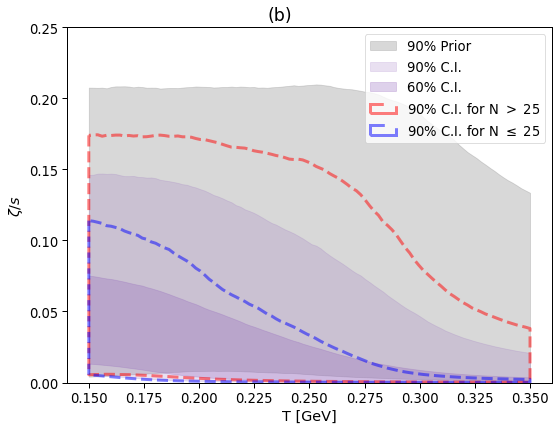

In [11]:
sns.set_context('paper', font_scale=1.5)
Tt = np.linspace(0.15, 0.35, 100)
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(8,6), sharex=False, sharey=False, constrained_layout=True)
fig.suptitle("(b)",y=1)
method_name = 'final_posterior'
pos_percentile=np.load(f'{method_name}/bulk_posterior.npy')
per0,per5,per20,per80,per95,per100=pos_percentile
prior_percentile = np.load(f'{method_name}/bulk_prior.npy')
per0_pr,per5_pr,per20_pr,per80_pr,per95_pr,per100_pr=prior_percentile

axes.fill_between(Tt, per5_pr,per95_pr,color=sns.color_palette()[7], alpha=0.3, label='90% Prior')
axes.fill_between(Tt,per5,per95,color=sns.color_palette()[4], alpha=0.2, label='90% C.I.')
axes.fill_between(Tt,per20,per80, color=sns.color_palette()[4], alpha=0.3, label='60% C.I.')

method_name = 'split_N/25_higher_N'
pos_percentile=np.load(f'{method_name}/bulk_posterior.npy')
per0,per5,per20,per80,per95,per100=pos_percentile
prior_percentile = np.load(f'{method_name}/bulk_prior.npy')
per0_pr,per5_pr,per20_pr,per80_pr,per95_pr,per100_pr=prior_percentile

#axes.fill_between(Tt, per5_pr,per95_pr,color=sns.color_palette()[7], alpha=0.3, label='90% Prior')
axes.fill_between(Tt,per5,per95, alpha=0.5, label='90% C.I. for N '+ r'$>$'+' 25',
                 edgecolor='red', facecolor='None', ls='--', lw=3)
#axes.fill_between(Tt,per20,per80, color=sns.color_palette()[9], alpha=0.3, label='60% C.I.')

method_name = 'split_N/25_lower_N'
pos_percentile=np.load(f'{method_name}/bulk_posterior.npy')
per0,per5,per20,per80,per95,per100=pos_percentile
prior_percentile = np.load(f'{method_name}/bulk_prior.npy')
per0_pr,per5_pr,per20_pr,per80_pr,per95_pr,per100_pr=prior_percentile

#axes.fill_between(Tt, per5_pr,per95_pr,color=sns.color_palette()[7], alpha=0.3, label='90% Prior')
axes.fill_between(Tt,per5,per95, alpha=0.5, label='90% C.I. for N '+ r'$\leq$'+' 25',
                 edgecolor='blue', facecolor='None', ls='--', lw=3)

axes.legend(loc='upper right')
axes.set_ylim(0,0.25)
axes.set_xlabel('T [GeV]')
axes.set_ylabel('$\zeta/s$')
    
plt.tight_layout()
plt.savefig(f'final_posterior/bulk_with_N_dep.png', dpi=200)

In [8]:
nsamples = 50000
prune = 1

In [9]:
MAP

array([20.01272442,  0.03761852,  0.98491288,  0.87764854,  1.18366635,
        0.14595191,  0.21900409,  0.09413407, -0.38276221,  0.492735  ,
        0.04370106,  0.234626  ,  0.03171797,  0.03689374,  0.65334705])

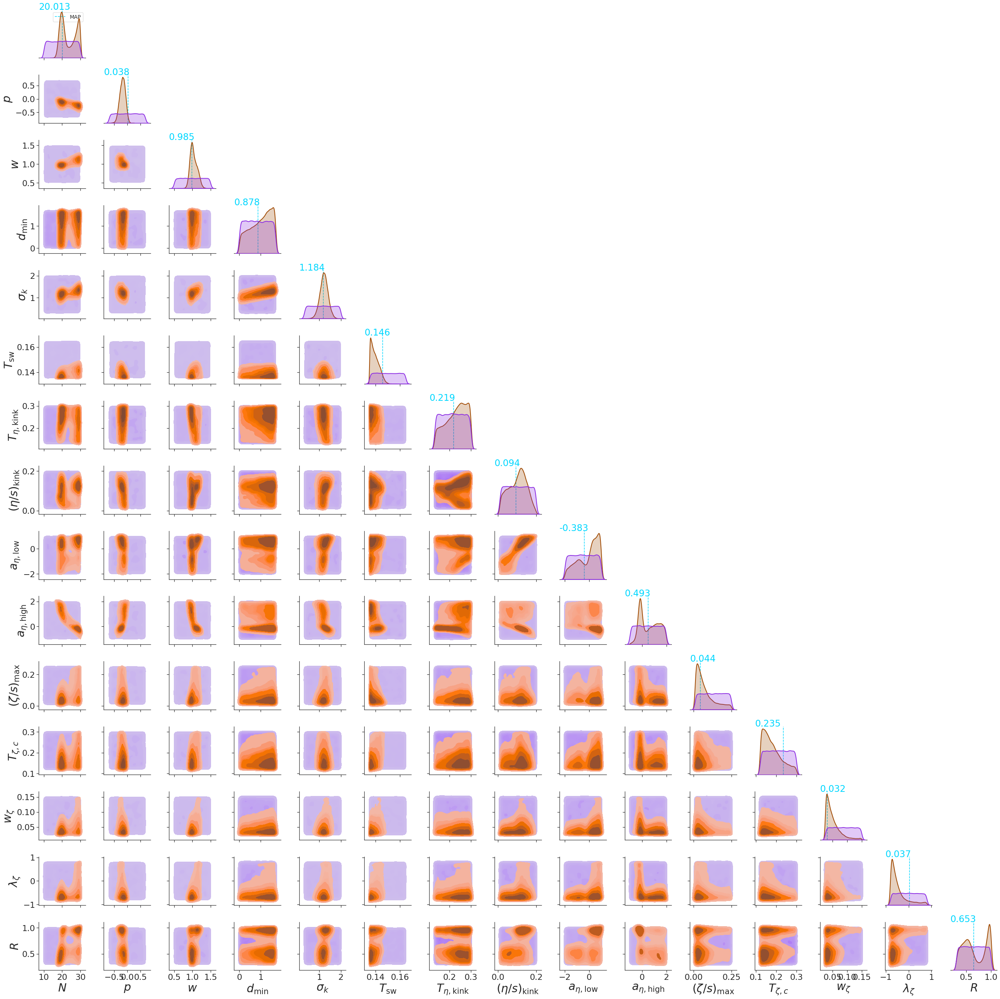

In [10]:
method_name = 'final_posterior'
# #os.mkdir(method_name)
# plot_corner_no_bulk_viscosity(post_df,prior_df,method_name,nsamples,prune, MAP=MAP, closure=None)

plot_corner_all(post_df,prior_df,method_name,nsamples,prune, MAP=MAP, closure=None)
#plot_corner_no_viscosity(post_df,prior_df,method_name,nsamples,prune, MAP=MAP, closure=None)
#plot_corner_viscosity(post_df,prior_df,method_name,nsamples,prune,MAP=MAP, closure=None)
#plot_shear(post_df,method_name,xlimits, nsamples,prune, MAP=None, closure=None)
#plot_bulk(post_df,method_name,xlimits, nsamples,prune,  MAP=None, closure=None)

In [19]:
index={}
st_index=0
for obs_group in  obs_groups.keys():
    if obs_group=='fluct':
        continue;
    for obs in obs_groups[obs_group]:
        n_centrality = len(obs_cent_list['Pb-Pb-2760'][obs])
        index[obs]=[st_index,st_index+n_centrality]
        st_index = st_index + n_centrality
index

{'dNch_deta': [0, 8],
 'dET_deta': [8, 30],
 'dN_dy_pion': [30, 38],
 'dN_dy_kaon': [38, 46],
 'dN_dy_proton': [46, 54],
 'mean_pT_pion': [54, 62],
 'mean_pT_kaon': [62, 70],
 'mean_pT_proton': [70, 78],
 'v22': [78, 86],
 'v32': [86, 92],
 'v42': [92, 98]}

### Compare prior predictive distribution with posterior predictive distribution

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


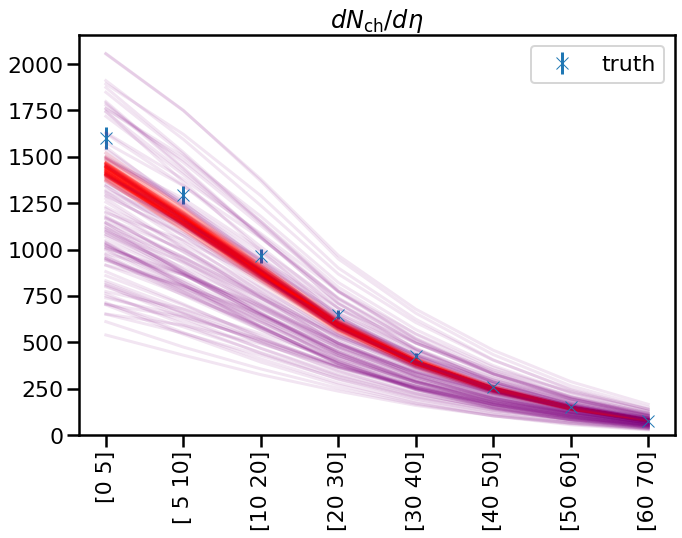

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


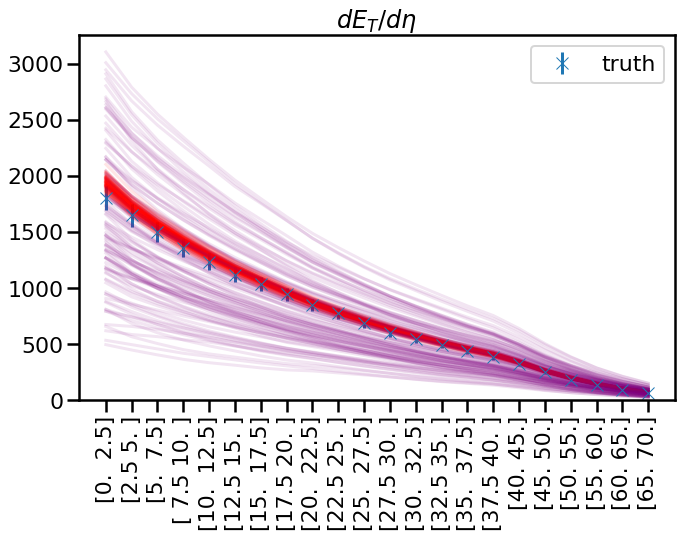

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


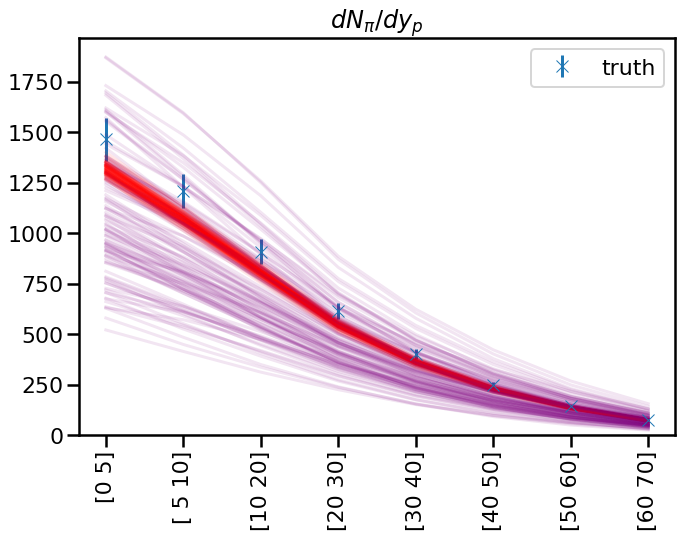

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


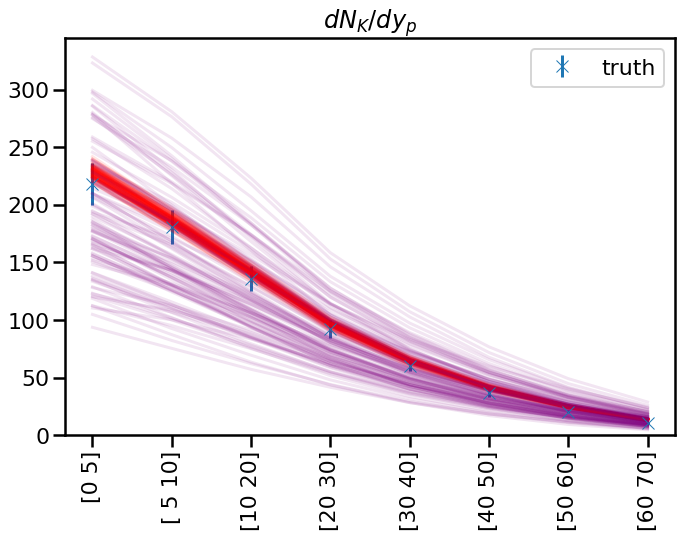

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


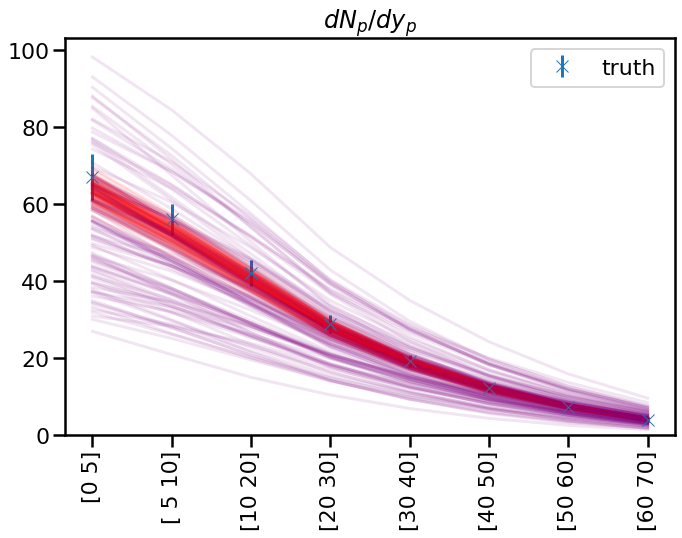

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


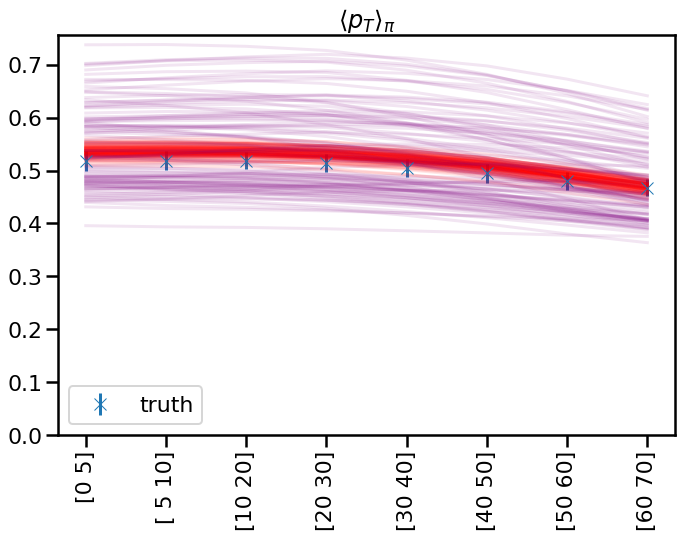

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


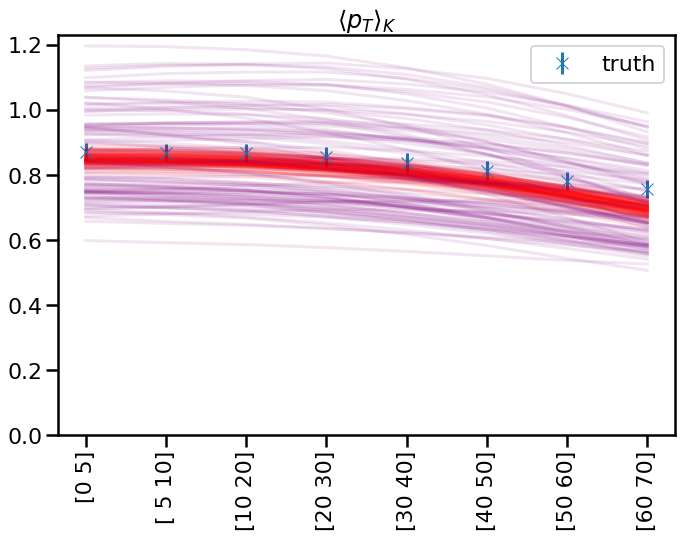

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


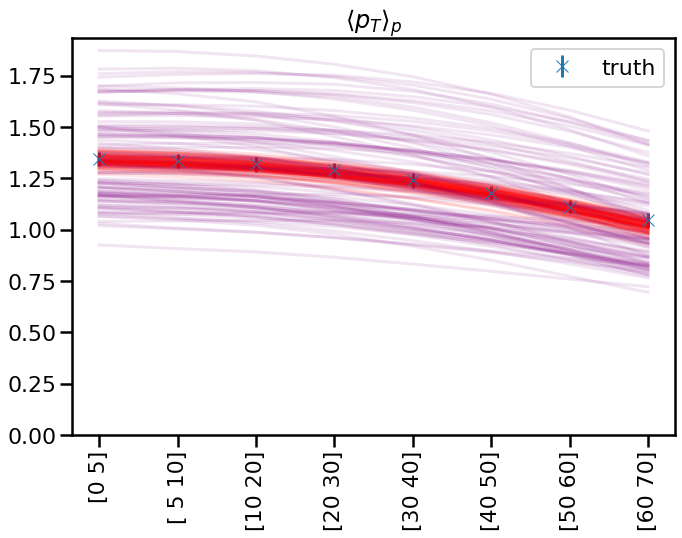

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


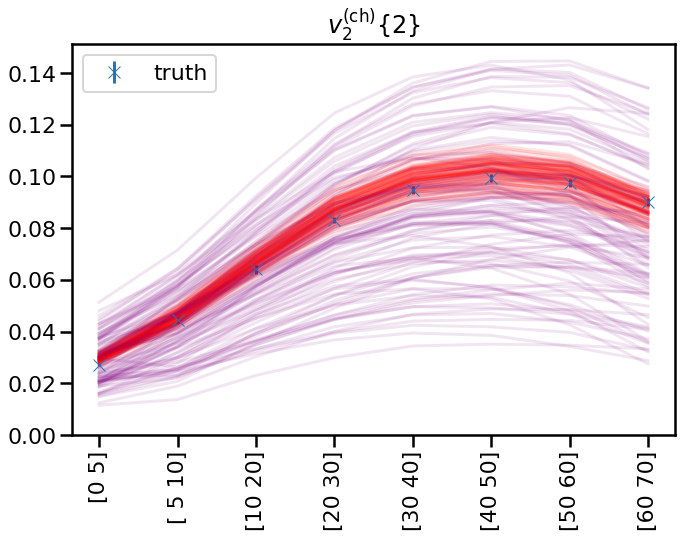

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


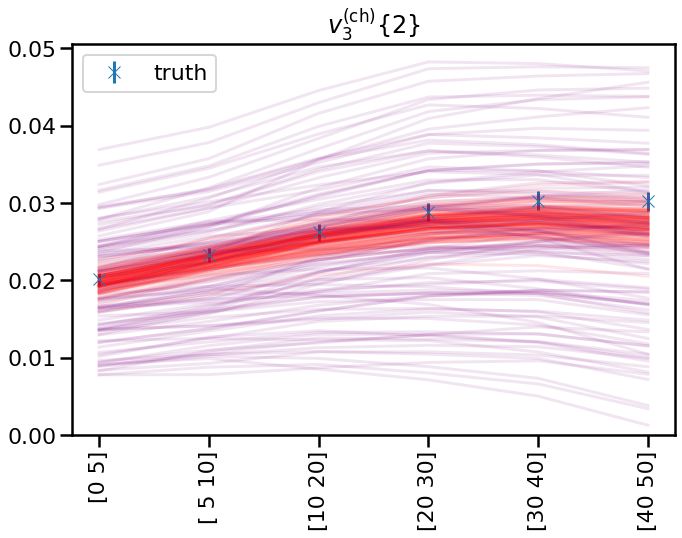

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


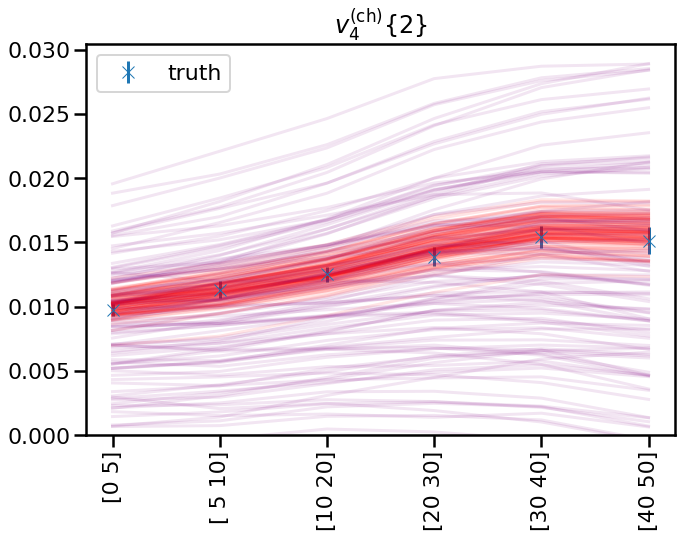

In [21]:
import seaborn as sns
sns.set_context('poster')
samples = post_df.sample(100,random_state=50).values
samples_prior = prior_df.sample(100,random_state=50).values

for obs_group in  obs_groups.keys():
    if obs_group=='fluct':
        continue;
    for obs in obs_groups[obs_group]:
        #print(obs)
        #print(obs)
        #print(index[obs])
        fig, ax = plt.subplots(figsize=(10,8))
        #tick_label = experiment.keys()[index[obs][0]: index[obs][1]]
        tick_label = obs_cent_list['Pb-Pb-2760'][obs]
        x = np.arange(0,len(tick_label))
        #print(x)
        #print(tick_label)
        x_np = np.arange(0, 98)[:, None]
        x_np = x_np.astype('object')
        for sample_i in range(0,len(samples)):
            sample = samples[sample_i ,:]
            prediction = cal.emu.predict(x=x_np, theta=(np.array(sample).reshape(-1,15)).flatten())
            y_emu = prediction.mean()[index[obs][0]: index[obs][1],:].flatten()
            #y_emu_er = np.sqrt(prediction.var()[index[obs][0]: index[obs][1],:].flatten())
            #ax.errorbar(x, y_emu,y_emu_er, label='emulation', fmt='.')
            ax.plot(x,y_emu,alpha=0.1, color='r')
        for sample_i in range(0,len(samples_prior)):
            sample = samples_prior[sample_i ,:]
            prediction = cal.emu.predict(x=x_np, theta=(np.array(sample).reshape(-1,15)).flatten())
            y_emu = prediction.mean()[index[obs][0]: index[obs][1],:].flatten()
            #y_emu_er = np.sqrt(prediction.var()[index[obs][0]: index[obs][1],:].flatten())
            #ax.errorbar(x, y_emu,y_emu_er, label='emulation', fmt='.')
            ax.plot(x,y_emu,alpha=0.1, color='purple')
            
        y_sim = cal.y[index[obs][0]: index[obs][1]]
        y_sim_er = np.sqrt(cal.info['yvar'][index[obs][0]: index[obs][1]])
        ax.set_title(obs_tex_labels[obs])
        ax.errorbar(x, y_sim,y_sim_er, label='truth', fmt='x')
        ax.set_xticks(x)
        ax.set_xticklabels(tick_label, rotation=90)
        ax.legend()
        ax.set_ylim(bottom=0)
        plt.tight_layout()
        plt.show()

In [29]:
prior_df.columns

Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
1400.6008233565803
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
1420.9539446061501
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.41

low
[19.98747832 -0.23375397  0.95486035  0.40395542  1.12189725  0.1358482
  0.25886602  0.17332472  0.91176106  0.88374622  0.04891204  0.18296731
  0.03243891 -0.4840954   0.51503972]
1457.3572629253476
low
[19.84593903 -0.26109913  0.90911255  1.4997084   1.14198419  0.13632435
  0.28815407  0.18644855  0.98429795  1.01051238  0.03708337  0.1679578
  0.08550665 -0.79048945  0.99841866]
1393.550049120663
low
[ 2.02215492e+01 -1.95826114e-01  9.10901702e-01  2.81603277e-01
  1.04614101e+00  1.36263040e-01  2.67053446e-01  4.70197647e-02
 -7.01413324e-01  1.77144807e+00  1.64838151e-02  1.62930977e-01
  3.57073515e-02 -7.65730244e-01  5.16721427e-01]
1465.6273340865996
low
[ 1.93534323e+01 -9.98585403e-02  8.73272324e-01  1.42723785e-01
  9.67848960e-01  1.39086962e-01  2.91705282e-01  1.52145798e-01
  3.92795729e-01  1.55981325e+00  1.82180026e-02  1.55568673e-01
  4.45448458e-02 -6.66033986e-01  5.65226198e-01]
1433.693210766568
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{

1458.7774344779828
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89825253e+01 -3.40607610e-01  1.07285942e+00  7.31490258e-01
  1.31197362e+00  1.38124430e-01  2.03480074e-01  1.33476513e-01
  1.44183145e-01 -4.04551766e-01  1.78779761e-01  1.82258487e-01
  2.65274731e-02 -7.34087894e-01  4.75581014e-01]
1400.600733594175
low
[ 1.91705280e+01 -9.76473103e-02  9.67957009e-01  1.68883483e+00
  1.09609211e+00  1.39508464e-01  2.77060884e-01  1.05485768e-01
  5.07891628e-01  1.65797448e+00  1.58830310e-02  2.77808923e-01
  2.89290016e-02 -6.81670109e-01  4.77567724e-01]
1446.150740728187
high
Index(['$N$[$2.76$TeV]', '$p

1437.0720166467797
low
[19.68375071 -0.27828977  0.91494038  1.38775645  1.13363596  0.14059957
  0.26882583  0.12802864  0.02436943  1.34055054  0.03097114  0.20588332
  0.02865808 -0.66833029  0.62044001]
1458.977629210524
low
[19.11556312 -0.1311677   1.01644945  0.86447313  1.20241824  0.1351826
  0.29169936  0.10859502  0.2782685   1.33198209  0.03473321  0.19102213
  0.04409691 -0.70478562  0.35339426]
1459.871222117965
low
[21.8184639  -0.24230016  0.96804774  1.30648326  1.23827213  0.13888554
  0.19210731  0.12862267  0.98078715  1.19371967  0.05306324  0.1667456
  0.05379199 -0.72873594  0.83999194]
1590.9418811813853
low
[18.46849803 -0.08257179  1.04652572  1.31777268  0.95565668  0.14551892
  0.1757967   0.1020644   0.63852352  0.57399781  0.05615332  0.29706662
  0.02538123 -0.70531263  0.37982717]
1364.889547619657
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [

1399.5496351636546
low
[18.24860621 -0.0256774   0.88592214  0.43707638  1.06204751  0.13586394
  0.2747459   0.17324166  0.56948005  1.96404488  0.0482371   0.21565513
  0.05841117 -0.69271258  0.5679142 ]
1412.4965611078185
low
[19.59623663 -0.3039449   0.98355321  0.09983106  0.99659573  0.1352074
  0.27406692  0.15870809  0.5868538   1.09985455  0.10029836  0.15643553
  0.0447404  -0.61416622  0.49280633]
1462.980552255306
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.93515264e+01 -1.62893121e-01  1.09338542e+00  9.64969662e-01
  1.27278574e+00  1.43013434e-01  2.06238359e-01  5.61073096e-02
 -1.13756075e+00  6.6

1422.9395621134036
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.70876586 -0.34626711  1.15913209  0.83887122  1.27082668  0.14299155
  0.26752089  0.158336    0.51819045 -0.38061992  0.0329649   0.25559769
  0.13559831 -0.69890627  0.88303431]
1473.7715482368353
low
[18.47587953 -0.13192742  0.98173933  0.65518098  1.14028237  0.13828213
  0.1518928   0.0855258  -1.11911986  0.88024129  0.14321992  0.12289754
  0.04714849 -0.71706045  0.48643375]
1419.7722646037703
low
[20.89343598 -0.05700428  1.12926041  0.43854387  1.24120556  0.13839313
  0.15198832  0.09705718  0.59257993  0.366437    0.19618854  0.18180652
  0

1468.4265270269798
low
[19.75868301 -0.14640701  0.93228726  1.59114351  1.27039521  0.13638691
  0.24166762  0.05137445 -1.28817881  1.34036561  0.06600218  0.18699532
  0.05348443 -0.7772349   0.48887826]
1449.1465174170767
low
[ 1.98355218e+01  1.41067826e-02  8.55103375e-01  1.01581932e-01
  8.45824595e-01  1.38995913e-01  2.66831751e-01  1.18246488e-01
  1.56141651e-01  1.62887180e+00  5.83378657e-02  1.73278686e-01
  7.27556048e-02 -7.42917541e-01  5.36797139e-01]
1442.1765020380992
low
[19.13300467 -0.05225134  0.91385527  1.34944479  1.0065961   0.14178388
  0.23714368  0.10538099 -0.24969641  1.61067571  0.02311486  0.24451465
  0.04493968 -0.60738341  0.54927579]
1431.6053502045909
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

1472.6094892921853
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.51280283 -0.45783242  1.10241369  1.54642967  1.41567296  0.14009074
  0.13921362  0.15393727  0.64365137 -0.31995556  0.18416772  0.14431682
  0.03106922 -0.53246076  0.42400105]
1473.905670171119
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90522680e+01 -3.88945604e-01  9.11219916e-01  7.73947520e-01
  1.21005180e+00  1.39053407e-01  2.73756575e-01  1.51030365e-02
 -1.33804499e+00  3.51934108e-01  4.82509740e-02  1.21889847e-01
  2.67053674e-02 -6.57006722e-01  5.44504362e-01]
1474.313498075171
low
[21.42751603 -0.15440411  0.94075605  1.43373307  1.58824737  0.13545817
  0.27846739  0.13375773  0.32330404  1.31163364  0.07230514  0.19071786
  0.04450291 -0.60148965  0.82736997]
1503.1269933768344
low
[18.8016111  -0.19506549  0.9992754   0.78012751  1.0722996   0.139299
  0.24815415  0.04712601 -0.97245544 

1398.1232172405598
low
[20.29498576 -0.08319241  0.9680916   0.63850948  1.24202083  0.13765461
  0.27124387  0.08605821 -0.10420299  0.80080056  0.03926462  0.16186979
  0.02707413 -0.65430211  0.63468295]
1392.310413223132
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.97753975 -0.20145276  1.10907223  0.4238299   1.2623471   0.13829885
  0.19534336  0.12732841  0.68696258 -0.24983548  0.2340697   0.24470726
  0.05458895 -0.78277863  0.99543018]
1411.5747015463455
low
[ 1.84770243e+01  4.09934643e-03  9.56193256e-01  1.08095176e+00
  1.11716835e+00  1.35232170e-01  2.89912570e-01  9.08691166e-02
 -2.89979221e-01  1.

low
[19.22061525 -0.03544234  1.06074718  0.75650288  1.07636419  0.13601265
  0.28894761  0.16405395  0.90018039  1.58825589  0.0578154   0.1652849
  0.04827939 -0.34661736  0.5731929 ]
1456.2695063918363
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.05460111 -0.08303335  1.19982345  1.24527844  1.39784528  0.14599867
  0.15482114  0.08735867  0.9644579  -0.03063564  0.04959633  0.29867314
  0.06673182  0.4783947   0.87364033]
1409.584802127449
low
[18.39952657 -0.07910628  0.99698545  0.72951369  0.95395477  0.14167515
  0.29719651  0.07463034  0.05201552  1.93768133  0.04041741  0.20118934
  0.07172925 -0.62511997

1403.8686649589736
low
[19.6386728  -0.03098828  0.94869437  1.48944815  1.08704039  0.13904612
  0.27917159  0.07775115 -0.37805158  1.4733088   0.15025925  0.1763709
  0.03995587 -0.4792598   0.58944893]
1423.9768262948398
low
[21.35352609 -0.17402915  0.96441303  1.6311389   1.28307733  0.13713264
  0.28764617  0.03824815 -0.78140881  1.21930194  0.07497991  0.14854281
  0.05693345 -0.60302637  0.58050661]
1437.933646266469
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.92855236e+01 -2.53178554e-01  1.23266404e+00  8.44377602e-01
  1.42528925e+00  1.39016168e-01  2.81345383e-01  1.40611616e-01
  6.06342914e-01 -3.2

 3.31866743e-02 1.63702068e-02 9.73605181e-01]
1426.522287473777
low
[20.15849056 -0.04930371  0.91954312  1.65643784  1.28003534  0.13825875
  0.23075323  0.06988163 -0.99184571  0.92704293  0.04937462  0.17662311
  0.05186235 -0.69390701  0.87184155]
1385.9405883042743
low
[19.98091159 -0.09741706  1.03428216  1.64036734  1.27776517  0.13525513
  0.2323389   0.06145127 -0.43932207  1.22561479  0.04191475  0.19794167
  0.02721943 -0.7378474   0.58132439]
1500.306687547709
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.35130632 -0.42042494  1.09667469  0.93824487  1.31628713  0.14267691
  0.27424055  0.16166429  0.602

1427.1759694536054
low
[20.12721947 -0.08807309  0.99650994  1.07508644  1.141786    0.13795245
  0.28180402  0.14407189  0.15195713  0.63167104  0.05001964  0.12778504
  0.04654396 -0.23989777  0.89018542]
1388.0896452372428
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90271978e+01 -2.25419297e-01  1.11657704e+00  1.02665945e+00
  1.33531864e+00  1.42768191e-01  2.10277910e-01  1.04539250e-01
  3.25459185e-01 -1.91779853e-01  1.91167739e-01  2.42349135e-01
  2.80345737e-02 -6.87619637e-01  6.74846569e-01]
1422.2881097978582
low
[20.14151964 -0.12000562  1.01081157  0.81695973  1.24900647  0.13547928
  0.19601615  0

      dtype='object')
[28.62387628 -0.28828431  1.04718726  1.67519021  1.45944222  0.13651825
  0.29121198  0.08684901 -0.23573106 -0.10793542  0.13198336  0.14721836
  0.03533774 -0.57854759  0.49453941]
1460.3635968874407
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.94826655e+01 -3.05159710e-01  1.12250715e+00  1.36007191e+00
  1.41829769e+00  1.44036863e-01  2.40136859e-01  1.44780648e-01
  9.24912502e-01 -3.27178591e-01  5.47582456e-02  1.31528716e-01
  2.73812784e-02 -4.53709505e-01  9.37845479e-01]
1475.8816471694317
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

1406.4041216953428
low
[ 2.01835284e+01 -1.04690171e-01  1.01824785e+00  1.21706812e+00
  1.24118511e+00  1.36812867e-01  2.27676441e-01  8.64884990e-02
 -4.19065624e-01  1.92582306e+00  1.40248914e-02  1.31262365e-01
  3.27891475e-02 -4.90165679e-01  8.90848454e-01]
1542.452011796081
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.38440695 -0.34847991  1.25013802  0.61453756  1.5603531   0.13779761
  0.26326757  0.1771937   0.72520569 -0.54248522  0.06981448  0.13486918
  0.0809585  -0.27404731  0.93480296]
1443.7492924978221
low
[18.43868844 -0.11372439  0.885765    0.93794304  0.95995773  0.13775531
  0.28578444  0.

1422.72434930732
low
[ 1.92202372e+01  7.08940001e-02  9.07341653e-01  1.14355513e+00
  1.16270486e+00  1.36249298e-01  2.52501424e-01  1.31364924e-01
 -2.17523288e-03  1.85693359e+00  9.56909987e-02  1.57886613e-01
  6.75267677e-02 -7.35366702e-01  9.21609120e-01]
1424.1127227412635
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.13773499 -0.16492263  1.28318449  1.54358872  1.48193816  0.13781483
  0.27905675  0.12604297  0.44836677 -0.34572748  0.10081935  0.24638647
  0.14075762 -0.12848344  0.88804289]
1434.4737029357198
low
[ 1.90907411e+01 -6.59211435e-03  9.87931987e-01  1.41951067e+00
  1.35208653e+00  1.37327

1446.4532211996616
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90954313e+01 -2.11167433e-01  1.03418493e+00  1.65877189e+00
  1.52103547e+00  1.44142700e-01  1.53901682e-01  1.13266214e-01
  2.82162709e-01 -8.98705367e-02  2.76732177e-02  2.69878197e-01
  7.98499207e-02 -5.58494250e-01  9.85132733e-01]
1441.2074274733575
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

1460.700548291431
low
[18.62220913 -0.1378201   0.92524179  0.23398275  0.96552954  0.1367879
  0.28256014  0.15041523  0.14282819  1.59996745  0.02420691  0.1422601
  0.0425843  -0.36919405  0.3819548 ]
1410.4956603438422
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.81136148 -0.37752528  1.11869935  0.54091154  1.16875755  0.14519507
  0.1963427   0.10973452  0.25237917 -0.1810892   0.16167694  0.22092641
  0.04350291  0.77777938  0.99270198]
1395.0792307502925
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$

1407.8983147197966
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.8990347  -0.0840116   1.16945259  1.68455848  1.52161527  0.13610189
  0.25501179  0.09669188  0.07063437 -0.12652633  0.10272605  0.19876474
  0.13105475 -0.51988214  0.73539768]
1453.654342033615
low
[ 2.13652066e+01  1.00540194e-02  9.51462417e-01  5.65148535e-01
  5.64868846e-01  1.43305255e-01  2.45027454e-01  1.01934342e-02
 -1.55591646e+00  1.48845885e+00  3.58500044e-02  1.91043010e-01
  7.15327245e-02 -5.47579553e-01  5.05690055e-01]
1460.3807839835022
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

1495.6479747514638
low
[ 1.90119773e+01 -1.94847329e-01  9.49559397e-01  1.02960765e+00
  1.18704415e+00  1.35792432e-01  2.60099336e-01  1.25430033e-01
  6.94788608e-01  1.38738368e+00  1.39018730e-02  1.41412748e-01
  3.28685042e-02 -5.31177744e-01  3.49664422e-01]
1476.8987095745608
low
[18.68489346 -0.15632058  0.9199812   0.10890016  0.771731    0.14175091
  0.26715521  0.17010718  0.51922721  1.61968917  0.04411972  0.16527328
  0.04812808 -0.55492333  0.55280038]
1419.2108756757666
low
[ 1.84777132e+01 -3.08106646e-02  9.29662351e-01  1.46934733e+00
  1.01519387e+00  1.36437790e-01  2.80081651e-01  1.15325302e-01
 -9.99458827e-02  1.66499591e+00  1.53148196e-02  1.71522933e-01
  7.47448361e-02 -6.20583654e-01  3.08197470e-01]
1400.8601108149023
low
[ 1.92491903e+01 -4.84370268e-03  8.89013348e-01  9.05480672e-01
  1.22856803e+00  1.37488639e-01  2.42243296e-01  1.08451859e-01
  2.91568612e-02  1.99417740e+00  4.62605606e-02  1.47575788e-01
  4.06464430e-02 -3.20496787e-01  8.682

1427.8291481848757
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.87408893e+01 -3.61778197e-01  9.88031206e-01  1.51364999e+00
  1.30611167e+00  1.42133463e-01  1.67391237e-01  1.06253486e-01
 -2.50095876e-01 -1.43190867e-01  2.03653903e-02  1.49713823e-01
  1.25566364e-01 -5.60135332e-01  6.25078171e-01]
1427.346571139838
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\ze

1413.4332907729663
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.95155185e+01 -2.23857786e-01  1.00505691e+00  1.06712226e+00
  1.08345808e+00  1.43957692e-01  2.69696305e-01  6.24541942e-02
 -2.44007960e-01 -2.02162031e-02  2.06329763e-02  2.38787396e-01
  1.04314224e-01 -7.76096621e-01  9.56226612e-01]
1390.6974810186985
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.81802637 -0.25862306  1.22350439  0.38484433  1.13963467  0.14281357
  0.17012929  0.13122014  0.64580214 -0.26604886  0.20636096  0.1770676
  0.03269697 -0.09249492  0.38825493]
1478.2495132837607
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

1483.9177820486327
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.08227469 -0.28961341  1.20482549  1.36492776  1.32636052  0.13717065
  0.2803115   0.16435597  0.81194696 -0.78824582  0.21349426  0.29203746
  0.06896439 -0.53996982  0.53633632]
1419.4743505267072
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

1374.5203205824084
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.68235403 -0.29050934  1.15991528  1.52380751  1.45504419  0.14140555
  0.2548125   0.12929101  0.70862302 -0.33896173  0.08407389  0.19606684
  0.04805595 -0.04334687  0.80665084]
1421.8085787210434
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

1377.3969750071726
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.06782476 -0.31175331  1.04157019  1.60154848  1.37345534  0.14277557
  0.20654197  0.1327381   0.99404765 -0.27945522  0.04122684  0.18781665
  0.06502466 -0.66109827  0.95318873]
1418.2060349348226
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

      dtype='object')
[ 2.85371497e+01 -2.94220514e-01  1.01086738e+00  1.67411279e+00
  1.22324540e+00  1.39055285e-01  2.44639205e-01  2.14456623e-02
 -1.45363683e+00  1.71423277e-01  1.59590936e-01  1.87882097e-01
  3.10601759e-02 -4.85604741e-01  5.44307361e-01]
1431.7642084089316
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.64177797 -0.1734042   1.067226    1.1218056   1.58180657  0.14172042
  0.22046367  0.15390368  0.4374306  -0.36255602  0.05271948  0.13509194
  0.1250527  -0.33465924  0.94990266]
1408.1766203985621
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


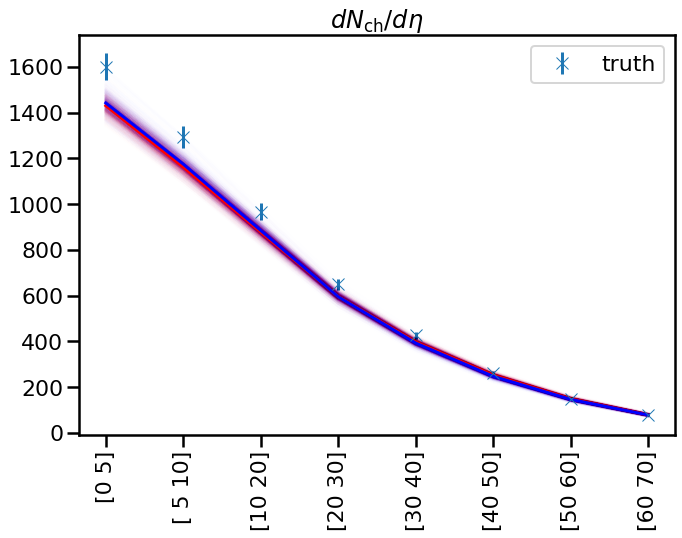

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
1903.0478953772158
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
1948.0914523853817
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.41

1977.7993948209355
low
[ 1.93534323e+01 -9.98585403e-02  8.73272324e-01  1.42723785e-01
  9.67848960e-01  1.39086962e-01  2.91705282e-01  1.52145798e-01
  3.92795729e-01  1.55981325e+00  1.82180026e-02  1.55568673e-01
  4.45448458e-02 -6.66033986e-01  5.65226198e-01]
1922.6129235620651
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.87945334e+01 -1.96507825e-01  1.01208529e+00  3.68723885e-01
  1.20334414e+00  1.51563386e-01  1.49534862e-01  9.94588030e-02
  8.79378336e-01 -9.91159351e-03  4.46270104e-02  2.10144634e-01
  4.10338523e-02  6.91601216e-01  9.74425185e-01]
1988.2243621071216
low
[18.90249633 -0.27387715  0

1970.724207247843
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.5294463  -0.32672027  0.98050297  1.5737402   1.31381638  0.14093989
  0.17161084  0.11969377 -0.723188   -0.31801838  0.04244208  0.14032151
  0.03965587 -0.6485125   0.41448546]
1844.3059676305463
low
[ 1.92203813e+01 -9.08732982e-02  8.94372366e-01  1.68514162e+00
  1.16062303e+00  1.42433091e-01  2.61791081e-01  1.36646799e-01
  4.98980807e-01  1.46639753e+00  1.80385815e-02  1.52581503e-01
  5.00339441e-02 -3.03430839e-01  9.58748926e-01]
1844.8008657510675
low
[18.45166738 -0.09882525  0.969269    1.23503305  1.13731173  0.13941518
  0.23562402  0.

1904.856962892473
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.48963869 -0.26633559  1.13224139  0.81628692  1.31821224  0.14077057
  0.17330726  0.12224159 -0.17650456 -0.1091438   0.03065338  0.23532212
  0.13423623 -0.10299432  0.96614356]
1996.3561057114687
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.98681486 -0.3732251   1.03900051  1.24373096  1.28448229  0.14129077
  0.24098129  0.10364995 -0.09963891 -0.26340982  0.04944463  0.12822996
  0.03933073 -0.68826399  0.57806121]
1856.6077832739727
low
[18.15595743 -0.1204367   0.93742048  1.34661997  1.0074894   0.14039051
  0.20100787  0.0481596  -0.95489664  1.80407011  0.04233397  0.17273914
  0.05360819 -0.47686765  0.51405992]
1947.9992309675838
low
[20.03504418 -0.12413437  1.01828829  0.490684    0.92722856  0.13738235
  0.29065872  0.15779699  0.72586321  1.45146469  0.02264678  0.22144587
  0.02690655 -0.385957

1894.1617053626082
low
[21.19624419 -0.29394063  0.89948525  1.53913889  1.2156664   0.1372821
  0.2540472   0.04877038 -1.21415273  1.01493688  0.02280568  0.14844641
  0.04678595 -0.67752996  0.55263303]
1957.5407822772222
low
[19.90667427 -0.09829621  0.99260749  1.65772095  1.48183761  0.1363019
  0.19199424  0.0811758  -0.81712357  0.6121619   0.1054678   0.18901234
  0.02560737 -0.78817549  0.59782645]
1917.9842746279035
low
[18.2602156  -0.05507166  1.02932122  0.99331439  1.17095919  0.138798
  0.17192852  0.08377932 -0.85587771  0.98067354  0.03073431  0.21836746
  0.05628699 -0.78524079  0.55581268]
1917.3072183736183
low
[21.1070867  -0.16243726  1.04792464  0.83681113  1.17467518  0.14002535
  0.23502391  0.02971352 -1.23831861  1.53987856  0.03243577  0.19574912
  0.03757153 -0.70420091  0.58421524]
2061.975505153985
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [

1950.8989856152064
low
[ 2.02193045e+01 -1.78690144e-01  9.31062311e-01  1.25243927e-01
  7.26705498e-01  1.41586760e-01  2.16957388e-01  2.50011419e-02
 -1.91615200e+00  1.45759583e+00  1.38512247e-02  2.72742100e-01
  3.76604783e-02 -6.23738225e-01  5.26639143e-01]
2006.0679297275437
low
[18.72859265  0.02292759  0.97559638  1.43803616  1.29099476  0.13600313
  0.16799847  0.01981283 -0.94358143  1.9129906   0.18105273  0.1843494
  0.03534655 -0.71829825  0.9651479 ]
1976.4238892896074
low
[18.93591947 -0.16504291  0.92876158  0.99653737  1.01490713  0.13678596
  0.26189875  0.1725458   0.50625404  1.20115128  0.05784413  0.13986384
  0.08475744 -0.51075958  0.63321222]
1898.1246467704004
low
[21.19803687 -0.28385612  0.97435442  1.66620846  1.26306265  0.14046122
  0.25598597  0.1775583   0.77953254  0.431772    0.03434233  0.15323065
  0.08014553 -0.68324465  0.97179382]
1991.3804160988534
low
[19.08762798 -0.1214942   1.0026921   0.58168902  1.11314437  0.13610171
  0.22053371  0.

1973.4558635567578
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.3027396  -0.22992346  1.25265157  1.61762552  1.53302627  0.13757368
  0.23639541  0.14394865  0.66748837 -0.31462409  0.18876611  0.25974506
  0.03140078 -0.63068111  0.82550285]
1942.590359620403
low
[19.98730736 -0.14735157  1.05015077  0.94862097  1.11644632  0.13753614
  0.27079027  0.13288325  0.60861202  1.32883411  0.03457277  0.20508685
  0.05262718 -0.44585793  0.49732337]
2058.561410660702
low
[21.69512456 -0.1753149   1.19678858  0.1530285   0.8890474   0.14372168
  0.16473451  0.06812182 -1.36842904  0.30487882  0.05260719  0.22713972
  0.0

  0.05893335 -0.79390276  0.93797465]
1900.9539671246853
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.83473279 -0.25010587  1.26961172  0.96251479  1.40584816  0.14039068
  0.16441556  0.11845114  0.95373884 -0.16526868  0.13494276  0.14259685
  0.06433523  0.77659369  0.96197179]
1956.4937143872148
low
[20.03264689 -0.10130059  0.98800259  1.65575275  1.35916516  0.13545408
  0.24824608  0.13648888  0.27431603  1.03467332  0.06807584  0.14901615
  0.05100615 -0.57492998  0.46481717]
2060.4557933695996
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$

1887.4910547069446
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.17651564 -0.25364864  1.10005097  0.93038383  1.49547123  0.14268608
  0.15630665  0.16082638  0.81327297 -0.32211159  0.13316582  0.19407685
  0.0432904   0.20492404  0.98124547]
1878.8036338131083
low
[20.2862708  -0.24882364  0.89630035  1.28001766  1.31289351  0.1369379
  0.2699906   0.1777266   0.61248016  1.0246258   0.07828072  0.1656544
  0.05051663 -0.78483109  0.88259472]
1938.5894091963212
low
[ 2.04103554e+01 -5.78508197e-01  8.93368014e-01  4.12977704e-01
  1.10365746e+00  1.37624235e-01  2.79569315e-01  1.93776276e-01
  8.61751844e-01  8.6

2006.3474776232615
low
[19.58690331  0.05890856  0.97614173  1.25947784  1.21927462  0.13660011
  0.24277462  0.05663257 -0.64041361  1.6516214   0.06007091  0.13226547
  0.03889875 -0.55318851  0.55798339]
1990.5924691822438
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.77325141 -0.16121054  1.08459679  1.44873459  1.22496694  0.14628954
  0.20705854  0.08307898  0.07317735 -0.1035375   0.03555339  0.29428645
  0.0413256   0.29149208  0.95730546]
1887.7493979356495
low
[21.12829198 -0.02823332  0.97230002  1.23176446  1.33873765  0.13570663
  0.28037016  0.03067204 -0.96764077  0.9182761   0.10622472  0.17290509
  0

[20.82602    -0.06261185  0.94213037  1.68965852  1.2908419   0.13534021
  0.25502584  0.02681992 -0.73662968  1.20462794  0.04867116  0.13883573
  0.03441261 -0.47518691  0.54796271]
1929.7188000087913
low
[ 2.01094762e+01 -1.16082721e-01  9.39467177e-01  1.49566097e+00
  1.37896727e+00  1.35778254e-01  2.93348235e-01  1.18818779e-01
 -1.76965389e-02  1.04834135e+00  1.81946655e-01  1.47664366e-01
  2.52293804e-02 -3.60047340e-01  8.81516077e-01]
1901.9652250333572
low
[ 2.18784349e+01 -3.57136918e-02  9.85244991e-01  1.64246518e+00
  1.26552101e+00  1.35583870e-01  2.61787396e-01  1.69795255e-02
 -1.33850615e+00  1.07642285e+00  5.42356001e-02  1.31457967e-01
  5.53016878e-02 -5.38355763e-01  5.35699712e-01]
1933.4387642886586
low
[21.45152737 -0.15976937  0.88568808  1.5955195   1.377855    0.13556075
  0.2766458   0.09661458  0.46026614  1.15964965  0.02688887  0.18835857
  0.02659463 -0.64849637  0.97020955]
1987.981855240202
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\

2034.7352199395787
low
[19.17345664  0.07144524  0.90060165  0.54471244  0.97627335  0.13616776
  0.29276143  0.18224704  0.88230384  1.90773873  0.05673916  0.13825409
  0.03207643 -0.40850372  0.97814105]
1947.5161816175275
low
[19.90939399 -0.17796214  1.0349025   0.29921166  0.99736542  0.1367557
  0.24946118  0.04213872 -0.73550725  1.70192512  0.03549443  0.15983285
  0.04317217 -0.64892477  0.45199908]
1996.6751217809367
low
[18.42651556 -0.02606743  1.00983744  0.60600066  1.06659285  0.13763624
  0.1729493   0.08399114 -0.75533975  0.68849677  0.14052254  0.15069737
  0.05346606 -0.77161779  0.33919797]
1889.7377984844254
low
[21.78622372 -0.16578157  0.94871819  0.93109392  1.13118503  0.1374961
  0.21993403  0.05071917 -1.19011424  0.54918536  0.14643624  0.13310331
  0.0256419  -0.74311872  0.54261635]
1942.5859398247583
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}

low
[19.46546132 -0.19838216  1.07661555  1.01424824  1.2469582   0.13554952
  0.18771045  0.04682062 -1.44023382  1.22400213  0.03805028  0.15028314
  0.03201109 -0.30921177  0.51481549]
2051.5110230460423
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.19558049 -0.07932262  1.09971208  1.63971223  1.47654768  0.14077945
  0.15346491  0.10926608 -0.04148478 -0.08042542  0.03867399  0.26407157
  0.08668193 -0.74287168  0.86912463]
1961.295600854535
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/

2044.4251076258959
low
[ 1.91028386e+01 -3.66104860e-01  9.24666008e-01  1.68502812e+00
  1.34109119e+00  1.40027381e-01  2.41129381e-01  1.75191093e-01
  5.84878698e-01  1.58486271e+00  1.12250324e-02  1.85955646e-01
  5.19630593e-02 -7.84513553e-01  3.35831456e-01]
2048.678616834769
low
[18.95422147 -0.23912724  0.86671764  1.59152914  1.18521718  0.13823785
  0.20098589  0.03756396 -1.57336924  1.49809821  0.02189454  0.15709243
  0.03395144 -0.37005145  0.60523514]
1914.8843936383428
low
[ 2.19419478e+01 -3.57337878e-03  9.32217106e-01  1.50929272e+00
  1.22830288e+00  1.37631838e-01  2.60754394e-01  5.26736283e-02
 -6.93721371e-01  7.79575269e-01  5.93014075e-02  1.54288226e-01
  4.14188501e-02 -6.25437941e-01  8.98863054e-01]
1881.2053878723066
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}

2003.8669832127543
low
[21.28851064 -0.26727736  0.95612537  0.10135929  1.07367604  0.14177116
  0.200828    0.13049612  0.39543525  0.82295357  0.07930123  0.13081586
  0.04684754 -0.42698359  0.98976579]
2021.2633753224554
low
[18.93069056 -0.10842787  1.05544631  0.97157163  1.38349058  0.13857421
  0.13543101  0.09297831 -1.27434616  0.46815691  0.05235153  0.12911454
  0.0278901  -0.71944832  0.50269149]
1872.124569877784
low
[20.52165079 -0.04573138  0.97540642  0.56211543  1.06746207  0.13952033
  0.29673682  0.16731205  0.91240225  1.28751786  0.052254    0.19359126
  0.04921482 -0.54024373  0.83082668]
2017.6309353178199
low
[21.74169736 -0.07150076  1.02434849  0.89776908  1.13018539  0.13598073
  0.22351832  0.04875754 -1.4468254   0.51195304  0.20014601  0.21572238
  0.04681665 -0.71577939  0.45114668]
1943.0100089057987
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.98063261e+01 -2.12155910e-01  1.20478779e+00  8.41233148e-01
  1.18799798e+00  1.45476390e-01  1.81389487e-01  7.81965808e-02
  6.29221820e-01 -2.63845932e-02  8.03833576e-02  2.53923462e-01
  6.19325273e-02  7.87997006e-01  8.97481775e-01]
1941.4459371702737
low
[19.53435105 -0.20636268  0.97293566  1.18011818  1.15994385  0.13537961
  0.27897687  0.09542446 -0.11892509  1.36120273  0.05251804  0.16077516
  0.03808468 -0.45535625  0.32932144]
2005.527103587309
low
[18.36385225 -0.08598675  1.07853068  1.58010385  1.46215076  0.13731775
  0.20801612  0.10332583  0.7614269

1868.2464247912617
low
[20.8620688  -0.2096834   0.89185014  0.21001969  1.15623138  0.13656266
  0.25677332  0.16074871  0.75796104  0.98592287  0.07649141  0.16952999
  0.04983552 -0.77426596  0.86573754]
1986.632563790954
low
[18.58267691 -0.27155881  0.94697037  1.34663601  1.37299271  0.13639684
  0.21336535  0.13952889  0.59468408  1.58773948  0.06006602  0.1588664
  0.02596877 -0.70522405  0.58585672]
1965.4263678593154
low
[18.17782385 -0.09197026  0.95685606  1.53007912  1.16039042  0.13881343
  0.25884031  0.08540294 -0.07692744  1.35006441  0.02694295  0.20786821
  0.03196874 -0.7529422   0.33618902]
1891.5733159682366
low
[18.5258407   0.05037878  0.98718931  0.0603478   1.08519671  0.13670267
  0.18945177  0.01977551 -1.70901364  1.70492984  0.0275619   0.17252138
  0.05312009 -0.63760285  0.55528781]
1916.6083120964886
low
[21.19799368 -0.10015337  1.06908048  1.64150747  1.34740171  0.14134437
  0.23862966  0.15791111  0.9407763   0.34082659  0.04801458  0.22770019
  0.0

1886.4572787445688
low
[20.24196649 -0.22948296  0.8961474   0.26799535  0.89313583  0.1413857
  0.24334503  0.15066548  0.99385323  1.65098546  0.04081378  0.20404548
  0.03125066 -0.30478626  0.90309001]
1995.803287830638
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.74407259 -0.32350384  1.12676157  0.53972453  1.51793694  0.14099067
  0.18938085  0.12462714  0.8329622  -0.28312616  0.08595097  0.13474358
  0.12893157 -0.46752293  0.45038955]
1953.3111767837836
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}

1964.9509558944997
low
[18.48799263 -0.05646052  0.91691774  0.99674547  0.95917775  0.13640241
  0.22789271  0.05652179 -1.36432611  1.6778539   0.03235813  0.19812279
  0.02637582 -0.75676739  0.55179166]
1912.474790069927
low
[ 1.98663682e+01 -1.26094510e-01  8.49307624e-01  1.18263242e+00
  1.04279591e+00  1.42934534e-01  2.92603349e-01  8.79351097e-02
  3.59607511e-02  1.62355787e+00  1.95487528e-02  1.39686650e-01
  4.15066853e-02  7.23303091e-01  6.39775291e-01]
1877.175160245587
low
[20.39766939 -0.3993648   0.92724532  0.92162716  1.32533443  0.13754715
  0.23682248  0.06555137 -0.66308267  1.09334747  0.02560315  0.14107712
  0.02969741 -0.71266288  0.48963227]
1996.8601558922928
low
[18.74967734 -0.30463998  0.89822104  1.07753347  1.20535811  0.13906565
  0.24592214  0.14064834  0.0471166   1.94664513  0.02859516  0.12350833
  0.04426508 -0.64664853  0.59332454]
1986.198770946887
low
[19.72820619  0.03424355  1.05402306  1.21107819  1.20850074  0.13819377
  0.18268154  0.08

1873.5006270284978
low
[19.61238785 -0.09901991  0.98770312  1.44060786  0.96559345  0.13984462
  0.28885655  0.09204493  0.06176678  1.52807266  0.02857242  0.29888055
  0.04415817 -0.69616718  0.58879214]
1929.5080189978717
low
[20.65942867 -0.16071735  0.97153881  0.51336269  0.99013897  0.13514809
  0.26399271  0.06592966 -0.84345408  1.47941989  0.10096787  0.16277839
  0.07892951 -0.74108416  0.62890355]
1987.106231084053
low
[19.29176056 -0.20529714  1.02015506  1.33709964  1.17790385  0.13869398
  0.2480061   0.14544586  0.41158824  1.02742421  0.01936818  0.27817177
  0.03725477 -0.7402689   0.46077931]
1997.8126638857234
low
[19.48881166 -0.03053651  0.94262033  0.12195343  0.90217786  0.14026617
  0.29489695  0.12211046  0.21806917  1.30237058  0.02664639  0.26745448
  0.02632534 -0.39186243  0.61379704]
1937.6058143425462
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}

1986.3901920581775
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.81897814e+01 -1.38044643e-01  1.10425908e+00  1.40285277e+00
  1.37488683e+00  1.40491910e-01  2.39172741e-01  1.59209654e-01
  9.57802781e-01 -4.72350822e-01  2.35143365e-01  2.66123804e-01
  2.62990412e-02 -5.84859225e-01  3.27849868e-01]
1945.0137306037523
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

1925.0391095631394
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.89004494 -0.23589377  1.09793916  0.998918    1.40841068  0.14563382
  0.20685455  0.13162437  0.46497164 -0.32935963  0.05435345  0.20418124
  0.0910981   0.68411468  0.89059988]
1896.1421959303766
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

[28.16881237 -0.45171327  1.11926665  0.9051297   1.43321007  0.1381492
  0.25110303  0.19940928  0.96064464 -0.92146446  0.07498313  0.18995856
  0.03367007 -0.37706391  0.62740597]
1802.7232249092742
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.60404422 -0.40416795  1.10537348  0.98714058  1.28835083  0.14184531
  0.15523065  0.10292794 -1.36068272 -0.14318994  0.09308581  0.14236767
  0.02926867 -0.11877819  0.54169438]
1950.2980398228897
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{

1936.0222230003496
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.96738702 -0.13038419  1.15424755  1.07170642  1.76278701  0.13562062
  0.22376893  0.15504296  0.88802916 -0.41369405  0.09602981  0.12657798
  0.04022022  0.18128709  0.99403599]
1917.762377535821
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

1941.5820945187088
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.79922703 -0.20236215  1.22537569  0.9566331   1.54216608  0.13608379
  0.1490517   0.15375322  0.39173301 -0.27692389  0.13045836  0.12780003
  0.0576306  -0.31033929  0.95543316]
1949.5679171671866
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.80463708 -0.1000827   1.14911485  1.15843226  1.42576933  0.13666781
  0.23621442  0.0826702  -0.49631143 -0.0684907   0.09214686  0.12734592
  0.10824577  0.61832004  0.95739123]
1931.7137764752802
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


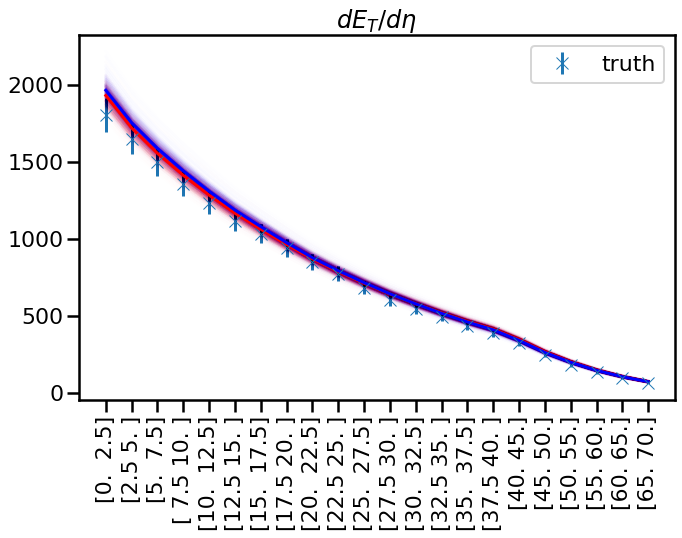

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
1291.3994082788327
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
1309.1933393251256
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.41

1307.3593080776661
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.98716418e+01 -1.60851360e-01  1.15810579e+00  1.43854166e+00
  1.47094649e+00  1.47157894e-01  1.59634634e-01  9.64490606e-02
  5.07710217e-01 -2.34725412e-02  3.97210551e-02  2.30113046e-01
  9.39051006e-02 -6.79185913e-01  9.80433471e-01]
1375.8296857357939
low
[19.98747832 -0.23375397  0.95486035  0.40395542  1.12189725  0.1358482
  0.25886602  0.17332472  0.91176106  0.88374622  0.04891204  0.18296731
  0.03243891 -0.4840954   0.51503972]
1342.2804790568082
low
[19.84593903 -0.26109913  0.90911255  1.4997084   1.14198419  0.13632435
  0.28815407  0.

1336.5549551050335
low
[ 2.01842740e+01 -3.28450805e-01  9.81960040e-01  2.03265302e-01
  3.94013905e-01  1.39057218e-01  2.93566620e-01  1.45454707e-01
  5.30219881e-01  1.62532558e+00  1.98450126e-02  2.42342118e-01
  3.02316033e-02 -5.26237236e-01  7.89786889e-01]
1352.724363485571
low
[19.4831851  -0.05704206  1.04808546  1.6321913   1.1993036   0.14013763
  0.20801673  0.05139412 -1.17649177  0.97099356  0.04537954  0.23076158
  0.04818343 -0.74946544  0.38856393]
1343.9448326344814
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89825253e+01 -3.40607610e-01  1.07285942e+00  7.31490258e-01
  1.31197362e+00  1.3812

low
[ 1.95743954e+01  1.22913443e-02  9.12977833e-01  9.74872662e-01
  1.21644151e+00  1.35021248e-01  1.65047159e-01  7.96530699e-02
 -6.09438357e-03  1.71494578e+00  8.79746035e-02  1.43890962e-01
  8.03785267e-02 -7.41321734e-01  9.66086281e-01]
1319.2370905378511
low
[19.68375071 -0.27828977  0.91494038  1.38775645  1.13363596  0.14059957
  0.26882583  0.12802864  0.02436943  1.34055054  0.03097114  0.20588332
  0.02865808 -0.66833029  0.62044001]
1344.6536043941633
low
[19.11556312 -0.1311677   1.01644945  0.86447313  1.20241824  0.1351826
  0.29169936  0.10859502  0.2782685   1.33198209  0.03473321  0.19102213
  0.04409691 -0.70478562  0.35339426]
1349.6482846925946
low
[21.8184639  -0.24230016  0.96804774  1.30648326  1.23827213  0.13888554
  0.19210731  0.12862267  0.98078715  1.19371967  0.05306324  0.1667456
  0.05379199 -0.72873594  0.83999194]
1459.2995326128998
low
[18.46849803 -0.08257179  1.04652572  1.31777268  0.95565668  0.14551892
  0.1757967   0.1020644   0.63852352

1299.6192846617141
low
[19.59623663 -0.3039449   0.98355321  0.09983106  0.99659573  0.1352074
  0.27406692  0.15870809  0.5868538   1.09985455  0.10029836  0.15643553
  0.0447404  -0.61416622  0.49280633]
1347.7136881103443
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.93515264e+01 -1.62893121e-01  1.09338542e+00  9.64969662e-01
  1.27278574e+00  1.43013434e-01  2.06238359e-01  5.61073096e-02
 -1.13756075e+00  6.60280633e-03  4.78034309e-02  1.46093373e-01
  5.17156922e-02  5.39566843e-01  5.23984926e-01]
1338.333205000445
low
[20.2949789  -0.14631666  0.9552921   1.28309663  1.03425288  0.13999687
  0.24487977  0.1

  0.03853568 -0.33992895  0.39364905]
1325.4947420037104
low
[21.58626993 -0.09180701  1.07560699  0.30415797  0.92609334  0.14248192
  0.14750289  0.07090236 -0.5092314   0.29399112  0.05931677  0.26436584
  0.03011201 -0.74872749  0.43030001]
1311.1130288017484
low
[19.55102559 -0.16056548  0.95018292  0.72811219  1.15762631  0.13549141
  0.27391414  0.09454257  0.18545775  1.5539238   0.06507614  0.13977807
  0.02794711 -0.26729362  0.53199187]
1326.9478953896446
low
[ 2.17517168e+01 -4.61616856e-02  9.59202574e-01  1.51964802e+00
  1.36296968e+00  1.35789472e-01  2.92797504e-01  1.23104086e-02
 -1.04478658e+00  1.43404447e+00  4.62138377e-02  1.33218826e-01
  5.22831388e-02 -6.44059704e-01  5.62972921e-01]
1317.4648902155682
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,

1339.566497650577
low
[18.19586349 -0.11460152  0.87185004  1.56507898  1.15120669  0.13630651
  0.29746351  0.07824131 -0.27828677  1.9981663   0.08778454  0.17102502
  0.02595334 -0.17631425  0.3841289 ]
1271.9924099770965
low
[20.43982893 -0.14803562  0.92019941  1.29642911  1.26975981  0.14157242
  0.24990478  0.14465265  0.56851113  0.99870893  0.04392747  0.23146386
  0.03970847 -0.50370808  0.89786043]
1307.9698463691766
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.12470587 -0.23956621  1.19697152  1.16667729  1.35152589  0.13943592
  0.14261278  0.10981754  0.32379809 -0.15214201  0.09862979  0.23110061
  0.

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.85033356 -0.25050054  1.10645665  0.91767417  1.20582734  0.1447048
  0.17855549  0.08044437 -0.96698556 -0.07664513  0.04010483  0.17733725
  0.0388338   0.06262229  0.77968265]
1340.7443340692128
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

1303.6407794518084
low
[ 2.09510643e+01 -8.03883842e-02  9.52158671e-01  1.43269024e+00
  1.36916809e+00  1.37649047e-01  2.85700881e-01  1.51659677e-01
  6.89135198e-01  1.08210993e+00  1.06483142e-02  1.47540245e-01
  5.47208022e-02 -4.79352704e-01  9.64300819e-01]
1355.3851559170098
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.81490787e+01 -5.87625130e-02  1.11649590e+00  1.36239730e+00
  1.27968630e+00  1.44881416e-01  1.88887381e-01  9.49439899e-02
  5.80340893e-01 -7.01301206e-02  2.63050656e-02  2.18993889e-01
  8.41295201e-02 -7.21398571e-01  9.91604137e-01]
1312.0285442481972
low
[ 1.91690882e+01 -1.4309734

1353.7186116028474
low
[20.34243411 -0.10478102  1.08941845  1.44115693  1.49096136  0.13595566
  0.13513322  0.06605244 -0.95697534  0.51054883  0.17106135  0.17461203
  0.0387166  -0.7904293   0.5043012 ]
1326.3347942651849
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.04472381 -0.25840318  0.99232839  0.77382481  1.29139893  0.14053803
  0.27795289  0.0376863  -1.17604208  0.18141785  0.18860413  0.18614025
  0.04114771 -0.75293641  0.64449447]
1352.0010274938252
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink

1362.2701526966748
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.87987320e+01 -4.01693423e-01  1.09640247e+00  9.18718774e-01
  1.35639012e+00  1.38685630e-01  2.83772962e-01  1.70673531e-01
  7.94384112e-01 -8.06103687e-01  2.34610929e-02  1.44028284e-01
  5.29918494e-02 -3.16810175e-01  9.43557232e-01]
1296.7012922913464
low
[18.91482029 -0.11577365  1.02121261  1.36120937  1.11847029  0.14041724
  0.29831672  0.09391845  0.24386617  1.95135847  0.08393619  0.24146058
  0.0272243  -0.53585385  0.38001133]
1357.924424287135
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

1327.609197178254
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.75616913 -0.36466581  1.01443634  1.0330192   1.35061465  0.13711612
  0.2332939   0.0510783  -1.78895669 -0.06060249  0.04796051  0.17607983
  0.10516527 -0.75972365  0.31267481]
1292.4683390032205
low
[19.06127602 -0.1860859   0.96158043  0.51276445  1.13987767  0.13561795
  0.24794726  0.07505014 -0.74473332  1.66545135  0.09428912  0.2057768
  0.03652751 -0.6833125   0.4127636 ]
1319.9658284491184
low
[19.39052635 -0.04303346  1.0101296   0.7475844   1.1033554   0.1363639
  0.26632774  0.05679673 -0.67771794  1.09711291  0.07458433  0.16965593
  0.04

1348.548938656813
low
[20.24168953 -0.09074349  0.99943093  0.91814343  1.36497974  0.13800309
  0.21021487  0.14390917  0.90502151  1.31269304  0.07042827  0.19569453
  0.05049836 -0.72210138  0.95990628]
1358.8989382664724
low
[19.17345664  0.07144524  0.90060165  0.54471244  0.97627335  0.13616776
  0.29276143  0.18224704  0.88230384  1.90773873  0.05673916  0.13825409
  0.03207643 -0.40850372  0.97814105]
1341.478884643009
low
[19.90939399 -0.17796214  1.0349025   0.29921166  0.99736542  0.1367557
  0.24946118  0.04213872 -0.73550725  1.70192512  0.03549443  0.15983285
  0.04317217 -0.64892477  0.45199908]
1367.300790886405
low
[18.42651556 -0.02606743  1.00983744  0.60600066  1.06659285  0.13763624
  0.1729493   0.08399114 -0.75533975  0.68849677  0.14052254  0.15069737
  0.05346606 -0.77161779  0.33919797]
1281.4451041635334
low
[21.78622372 -0.16578157  0.94871819  0.93109392  1.13118503  0.1374961
  0.21993403  0.05071917 -1.19011424  0.54918536  0.14643624  0.13310331
  0.0256

1259.925252135159
low
[20.18322278 -0.15606899  0.95128794  0.30837004  0.9159264   0.13992274
  0.16772599  0.09981641  0.18417571  0.94973162  0.0416175   0.15686147
  0.11180423 -0.75096758  0.78985455]
1307.599280161058
low
[18.62014052 -0.11362876  0.96962304  0.57722843  0.9805766   0.13601311
  0.26500542  0.05847823 -0.76256728  1.82884868  0.09664547  0.15767275
  0.07328139 -0.79393405  0.54393171]
1274.1384028725272
low
[19.46546132 -0.19838216  1.07661555  1.01424824  1.2469582   0.13554952
  0.18771045  0.04682062 -1.44023382  1.22400213  0.03805028  0.15028314
  0.03201109 -0.30921177  0.51481549]
1377.1195197507845
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [Ge

1344.9516976001448
low
[ 1.96537708e+01 -3.18624181e-02  1.06389485e+00  6.35457164e-01
  1.19142805e+00  1.46219209e-01  1.55551972e-01  6.47190995e-02
 -4.48754431e-01  5.10379482e-01  1.89363426e-02  2.48819033e-01
  2.68326689e-02 -6.34772062e-01  3.62596059e-01]
1286.1758756977706
low
[21.99204212 -0.19045926  0.96244376  0.95047873  1.23677662  0.13732148
  0.25338613  0.1539777   0.5330288   0.79296839  0.02388824  0.14510357
  0.05752756 -0.70377115  0.96460293]
1380.8930238802038
low
[ 1.91028386e+01 -3.66104860e-01  9.24666008e-01  1.68502812e+00
  1.34109119e+00  1.40027381e-01  2.41129381e-01  1.75191093e-01
  5.84878698e-01  1.58486271e+00  1.12250324e-02  1.85955646e-01
  5.19630593e-02 -7.84513553e-01  3.35831456e-01]
1365.7002093755586
low
[18.95422147 -0.23912724  0.86671764  1.59152914  1.18521718  0.13823785
  0.20098589  0.03756396 -1.57336924  1.49809821  0.02189454  0.15709243
  0.03395144 -0.37005145  0.60523514]
1291.9771485495862
low
[ 2.19419478e+01 -3.5733787

  0.06297395 -0.73328887  0.31503532]
1375.9568626800503
low
[20.69402863 -0.18741604  0.92601564  0.08503037  0.88317392  0.14171052
  0.23307328  0.05340296 -1.32804331  1.01703888  0.04982888  0.21804359
  0.03701798 -0.63278704  0.66949457]
1318.5533815358249
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.98494529e+01 -3.56239121e-01  1.20002558e+00  1.17237009e+00
  1.51238851e+00  1.42512194e-01  1.56173821e-01  1.37207545e-01
  8.00486812e-01 -1.95557807e-01  2.74017784e-02  1.23443504e-01
  9.18678658e-02  3.87436595e-01  9.62990563e-01]
1360.1433644963074
low
[21.28851064 -0.26727736  0.95612537  0.10135929  

low
[ 2.12196185e+01 -2.07975974e-01  9.72562187e-01  6.72121886e-01
  1.28584573e+00  1.45735039e-01  1.38423552e-01  8.25618664e-02
 -2.23833706e-01  6.05610595e-01  1.45632833e-02  1.42284067e-01
  3.64083233e-02 -4.83767065e-01  8.88400405e-01]
1314.1726114357455
low
[ 1.96387049e+01 -3.32097488e-01  1.02988668e+00  1.35229828e+00
  1.19467694e+00  1.37887487e-01  2.91856586e-01  1.80389747e-01
  8.07312225e-01  1.50499193e+00  1.83694269e-02  1.77011484e-01
  3.39290797e-02 -3.49358235e-01  5.53816359e-01]
1370.8655108978573
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.97795655e+01 -3.09066880e-01  9.71884594e-

1345.632100527697
low
[ 1.99695781e+01  1.25098847e-02  9.13650849e-01  3.88887976e-01
  6.24926419e-01  1.35169277e-01  2.86665560e-01  1.59303905e-01
  5.29990301e-01  1.89200911e+00  2.06593954e-02  2.89365618e-01
  1.25000738e-01 -7.62146854e-01  9.89041296e-01]
1277.5190644018835
low
[18.91857863 -0.03565666  0.97043336  0.51637382  0.86866925  0.1375194
  0.23613359  0.14650811  0.81010457  1.81241925  0.17522237  0.21129873
  0.02910212 -0.79741192  0.89022254]
1338.9210267127414
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.95657309e+01 -3.25520432e-01  9.78762139e-01  1.37454623e+00
  1.27713823e+00  1.43174

1362.3296234379243
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.98884496e+01 -1.71439022e-01  1.12206615e+00  5.39376703e-01
  1.41529899e+00  1.43882624e-01  1.72049777e-01  1.28225695e-01
  6.52964764e-01 -1.97655573e-01  2.37940272e-02  1.43406274e-01
  4.89880111e-02 -4.44596485e-01  8.51577329e-01]
1345.2947236081031
low
[18.24224863 -0.14575902  1.11423227  0.56744272  1.11941601  0.13523432
  0.18826149  0.07095129 -0.68806056  1.5379607   0.03338937  0.1689592
  0.05324442 -0.69125651  0.5495452 ]
1339.451550675165
low
[20.31527282 -0.08045883  0.92841752  1.0948523   1.2277191   0.13782863
  0.21372005  0.1

  0.06202602 -0.70063134  0.79210508]
1260.108815304758
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.92763007e+01 -4.02151110e-01  9.90585941e-01  9.35569345e-01
  1.50810628e+00  1.37534722e-01  1.52072390e-01  1.80915312e-01
  8.81673010e-01 -2.60647714e-01  2.15087479e-01  1.57379282e-01
  2.68853802e-02 -3.10295767e-01  9.75589936e-01]
1358.0139014975164
low
[19.68375728 -0.0842345   1.01205298  0.71333879  1.22163484  0.13552075
  0.21798305  0.07404791 -0.94107703  0.70771178  0.07140096  0.15232739
  0.02840982 -0.70503624  0.36964202]
1317.3733156164212
low
[ 1.94613758e+01  2.91114903e-02  9.92275753e-01  9

1369.1211687589823
low
[ 2.00927411e+01 -2.47409765e-01  8.56889061e-01  1.12675543e+00
  1.17623334e+00  1.37759716e-01  1.84319282e-01  3.65778161e-02
 -1.66503314e+00  1.61087463e+00  1.26197129e-02  1.75845238e-01
  5.94610451e-02 -7.51536118e-01  9.98822241e-01]
1306.944418830357
low
[19.30344417 -0.14757413  0.87621722  1.19922275  1.38117594  0.13865801
  0.23953594  0.11348637  0.07563675  1.41162923  0.04896155  0.15133711
  0.02840789 -0.76692273  0.47557521]
1358.2665173982928
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.50426323 -0.18611592  1.14239859  1.58518069  1.6143029   0.13683206
  0.18085389  0.

      dtype='object')
[28.08591496 -0.26592889  1.16353515  1.45300597  1.42529892  0.14442599
  0.23333159  0.12848241  0.34576335 -0.23585757  0.07016763  0.13958997
  0.0650609   0.7952724   0.97528274]
1322.0009799704517
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.68968857 -0.27474721  0.97137853  1.34688187  1.33540181  0.14053101
  0.26290571  0.07566949 -0.61469805 -0.10504148  0.21723448  0.19724658
  0.03046959 -0.21605357  0.98930351]
1279.1437698634552
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}

1316.5644395177624
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.95141604e+01 -2.15690557e-01  1.16610724e+00  1.49470085e+00
  1.60211254e+00  1.41808851e-01  2.52427174e-01  1.28859674e-01
  5.46067484e-01 -2.74182199e-01  1.79495922e-02  1.34561832e-01
  1.04770143e-01  3.09069220e-01  9.72656126e-01]
1348.754147067188
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\ze

1312.3161515021093
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.41475705 -0.31711377  1.20835645  1.69719042  1.441186    0.14212698
  0.20673311  0.1357523   0.57629897 -0.25315358  0.07266412  0.17045521
  0.10539796 -0.24804099  0.97607112]
1355.8948715650872
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

1337.1906323790042
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.94444537e+01 -2.50276154e-01  1.11685104e+00  4.47588081e-01
  9.34492060e-01  1.39923149e-01  2.21313186e-01  1.10228951e-01
 -2.84585105e-02 -3.79154819e-01  2.13759715e-01  2.98363379e-01
  3.12512935e-02 -6.18610826e-01  5.00664943e-01]
1261.3865321331903
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

1326.175983750787
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.54121136 -0.16851024  1.29060134  1.01089845  1.42599245  0.14081042
  0.26081355  0.13750744  0.8820691  -0.30398316  0.03196031  0.16486619
  0.07601068 -0.14178636  0.97413783]
1384.263022203484
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [Ge

1317.260726927641
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.32644825 -0.25025723  1.21050386  1.00773421  1.36644555  0.13520777
  0.15957381  0.10180821 -1.30728488 -0.18212008  0.08174677  0.1284174
  0.04032795 -0.20417062  0.40997164]
1335.5486124287984
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [Ge

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


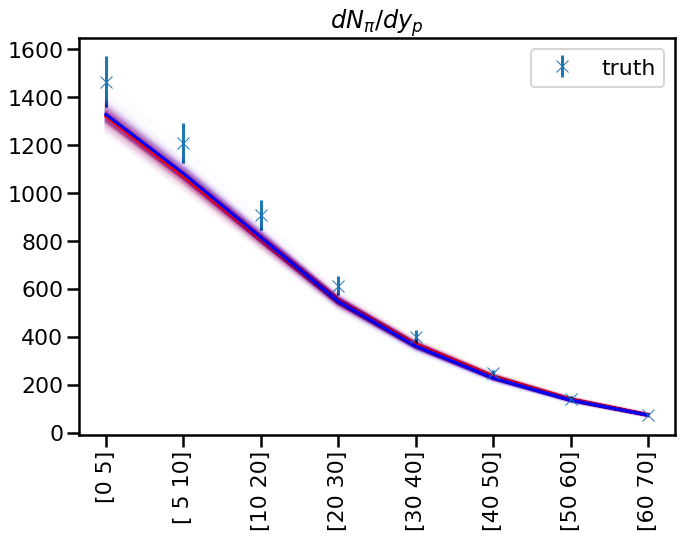

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
224.25178467217387
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
226.74595757499196
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.41

low
[19.98747832 -0.23375397  0.95486035  0.40395542  1.12189725  0.1358482
  0.25886602  0.17332472  0.91176106  0.88374622  0.04891204  0.18296731
  0.03243891 -0.4840954   0.51503972]
232.12981191639813
low
[19.84593903 -0.26109913  0.90911255  1.4997084   1.14198419  0.13632435
  0.28815407  0.18644855  0.98429795  1.01051238  0.03708337  0.1679578
  0.08550665 -0.79048945  0.99841866]
223.58394956538973
low
[ 2.02215492e+01 -1.95826114e-01  9.10901702e-01  2.81603277e-01
  1.04614101e+00  1.36263040e-01  2.67053446e-01  4.70197647e-02
 -7.01413324e-01  1.77144807e+00  1.64838151e-02  1.62930977e-01
  3.57073515e-02 -7.65730244e-01  5.16721427e-01]
234.1513437901218
low
[ 1.93534323e+01 -9.98585403e-02  8.73272324e-01  1.42723785e-01
  9.67848960e-01  1.39086962e-01  2.91705282e-01  1.52145798e-01
  3.92795729e-01  1.55981325e+00  1.82180026e-02  1.55568673e-01
  4.45448458e-02 -6.66033986e-01  5.65226198e-01]
230.27666201496862
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_

224.1496654362899
low
[ 1.91705280e+01 -9.76473103e-02  9.67957009e-01  1.68883483e+00
  1.09609211e+00  1.39508464e-01  2.77060884e-01  1.05485768e-01
  5.07891628e-01  1.65797448e+00  1.58830310e-02  2.77808923e-01
  2.89290016e-02 -6.81670109e-01  4.77567724e-01]
231.1630061790775
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.95882164e+01 -3.49817778e-01  1.06936213e+00  8.08131619e-01
  1.08170300e+00  1.43102909e-01  2.07469451e-01  4.76459439e-02
 -1.63833054e+00 -3.57158297e-02  1.49843843e-02  1.27689701e-01
  4.32206254e-02  2.71182095e-01  6.12861934e-01]
225.73527858180938
low
[20.24574191 -0.08998844  0.9

233.17707130216328
low
[21.8184639  -0.24230016  0.96804774  1.30648326  1.23827213  0.13888554
  0.19210731  0.12862267  0.98078715  1.19371967  0.05306324  0.1667456
  0.05379199 -0.72873594  0.83999194]
254.05414579913415
low
[18.46849803 -0.08257179  1.04652572  1.31777268  0.95565668  0.14551892
  0.1757967   0.1020644   0.63852352  0.57399781  0.05615332  0.29706662
  0.02538123 -0.70531263  0.37982717]
219.26503216326614
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.88110387e+01 -3.24557322e-01  1.16668709e+00  1.05479981e+00
  1.36869833e+00  1.40823781e-01  2.82718414e-01  1.35972834e-01
  7.40492748e-01 -5.

232.15849273112272
low
[20.2949789  -0.14631666  0.9552921   1.28309663  1.03425288  0.13999687
  0.24487977  0.1551763   0.77148828  0.63948855  0.0454407   0.12940917
  0.08979804 -0.77777427  0.5261261 ]
233.9242760314251
low
[18.43229605 -0.06186252  0.91119507  1.67688522  1.27796814  0.13663542
  0.28512336  0.15801638  0.27451945  1.97214249  0.0565227   0.16342197
  0.04253872 -0.34080346  0.86474562]
221.44201131719558
low
[ 2.06812778e+01 -3.01925305e-01  9.18183406e-01  1.24235895e+00
  9.10418135e-01  1.36789480e-01  2.55196893e-01  1.72230364e-01
  8.34753010e-01  1.68260502e+00  1.55995450e-02  1.38519532e-01
  5.33641384e-02 -6.25362250e-01  8.59818961e-01]
242.23161070834368
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\ze

227.34474625717866
low
[19.55102559 -0.16056548  0.95018292  0.72811219  1.15762631  0.13549141
  0.27391414  0.09454257  0.18545775  1.5539238   0.06507614  0.13977807
  0.02794711 -0.26729362  0.53199187]
229.76942475726753
low
[ 2.17517168e+01 -4.61616856e-02  9.59202574e-01  1.51964802e+00
  1.36296968e+00  1.35789472e-01  2.92797504e-01  1.23104086e-02
 -1.04478658e+00  1.43404447e+00  4.62138377e-02  1.33218826e-01
  5.22831388e-02 -6.44059704e-01  5.62972921e-01]
228.2860729422305
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.56822126 -0.27000663  1.05183731  0.54153933  1.33340143  0.14301161
  0.15377583  0.

231.3743952113445
low
[18.19586349 -0.11460152  0.87185004  1.56507898  1.15120669  0.13630651
  0.29746351  0.07824131 -0.27828677  1.9981663   0.08778454  0.17102502
  0.02595334 -0.17631425  0.3841289 ]
220.65081064300477
low
[20.43982893 -0.14803562  0.92019941  1.29642911  1.26975981  0.14157242
  0.24990478  0.14465265  0.56851113  0.99870893  0.04392747  0.23146386
  0.03970847 -0.50370808  0.89786043]
228.0085882690978
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.12470587 -0.23956621  1.19697152  1.16667729  1.35152589  0.13943592
  0.14261278  0.10981754  0.32379809 -0.15214201  0.09862979  0.23110061
  0.0

      dtype='object')
[ 2.95883732e+01 -1.24038403e-01  1.00469354e+00  1.56913249e+00
  1.57251737e+00  1.40627136e-01  2.54184535e-01  1.35093220e-01
  5.43648700e-01 -6.54305392e-01  7.64093436e-02  1.44770471e-01
  2.82726981e-02  5.07743822e-01  4.93247523e-01]
218.86069535786498
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.85033356 -0.25050054  1.10645665  0.91767417  1.20582734  0.1447048
  0.17855549  0.08044437 -0.96698556 -0.07664513  0.04010483  0.17733725
  0.0388338   0.06262229  0.77968265]
232.6047053675778
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$'

226.6823582393472
low
[ 2.09510643e+01 -8.03883842e-02  9.52158671e-01  1.43269024e+00
  1.36916809e+00  1.37649047e-01  2.85700881e-01  1.51659677e-01
  6.89135198e-01  1.08210993e+00  1.06483142e-02  1.47540245e-01
  5.47208022e-02 -4.79352704e-01  9.64300819e-01]
234.76069129035002
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.81490787e+01 -5.87625130e-02  1.11649590e+00  1.36239730e+00
  1.27968630e+00  1.44881416e-01  1.88887381e-01  9.49439899e-02
  5.80340893e-01 -7.01301206e-02  2.63050656e-02  2.18993889e-01
  8.41295201e-02 -7.21398571e-01  9.91604137e-01]
227.22954012435986
low
[ 1.91690882e+01 -1.43097340

low
[ 2.01381974e+01  5.99749420e-03  9.52682948e-01  1.92291037e-01
  8.38889916e-01  1.39363672e-01  2.68851143e-01  9.37447586e-02
  1.75695283e-01  1.66643453e+00  6.12318674e-02  1.83097632e-01
  6.05192779e-02 -6.77855901e-01  6.39501248e-01]
236.0330308803955
low
[20.34243411 -0.10478102  1.08941845  1.44115693  1.49096136  0.13595566
  0.13513322  0.06605244 -0.95697534  0.51054883  0.17106135  0.17461203
  0.0387166  -0.7904293   0.5043012 ]
230.67229779273214
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.04472381 -0.25840318  0.99232839  0.77382481  1.29139893  0.14053803
  0.27795289  0.0376863  -1.1760420

[18.46119827 -0.22089248  0.99187543  0.44354082  1.0689223   0.13527962
  0.14194192  0.06560847 -1.58560923  1.12820065  0.01879134  0.13524903
  0.02796525 -0.39442437  0.4143991 ]
236.25889976362456
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.98850645e+01 -1.88014190e-01  1.27603645e+00  4.78243542e-01
  1.28581547e+00  1.39950587e-01  1.56833838e-01  1.00783459e-01
  7.02376638e-01 -5.97442269e-02  2.36424085e-02  1.63558642e-01
  1.23988071e-01  7.57223631e-01  8.90521893e-01]
234.21031479086994
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$

241.7191325516963
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.86028055e+01 -3.41313418e-01  9.44144917e-01  1.02800380e+00
  1.10060728e+00  1.43339253e-01  2.70602055e-01  4.05186684e-02
 -9.97979824e-01  2.26949459e-01  1.99763629e-02  1.53669516e-01
  8.00576852e-02 -7.85436612e-01  8.00445569e-01]
232.58806432428457
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\ze

  0.04452602 -0.7732753   0.59758562]
224.8863606862176
low
[20.91584071 -0.2369724   0.93917375  0.42649748  0.80601979  0.14218085
  0.2785841   0.18178406  0.83938189  1.55746986  0.04874396  0.20913572
  0.04748406 -0.50104724  0.89947868]
240.10667214871654
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.86714033 -0.24670061  1.13539367  0.7197212   1.41293686  0.14329778
  0.16123417  0.12945118  0.8009169  -0.21606432  0.04614903  0.21292284
  0.03252014 -0.67745354  0.62216964]
233.09857402888045
low
[20.24168953 -0.09074349  0.99943093  0.91814343  1.36497974  0.13800309
  0.21021487  0.14390917  0.90502151  1

234.43390398907056
low
[21.74405546 -0.21843997  0.93574262  1.3054472   1.24111183  0.14149259
  0.25806987  0.04912556 -0.66206062  0.55847771  0.03039499  0.18051336
  0.02592882 -0.71160473  0.602189  ]
218.75889392736536
low
[20.18322278 -0.15606899  0.95128794  0.30837004  0.9159264   0.13992274
  0.16772599  0.09981641  0.18417571  0.94973162  0.0416175   0.15686147
  0.11180423 -0.75096758  0.78985455]
228.0602541514253
low
[18.62014052 -0.11362876  0.96962304  0.57722843  0.9805766   0.13601311
  0.26500542  0.05847823 -0.76256728  1.82884868  0.09664547  0.15767275
  0.07328139 -0.79393405  0.54393171]
222.10161922390586
low
[19.46546132 -0.19838216  1.07661555  1.01424824  1.2469582   0.13554952
  0.18771045  0.04682062 -1.44023382  1.22400213  0.03805028  0.15028314
  0.03201109 -0.30921177  0.51481549]
237.61241047569732
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}

      dtype='object')
[ 2.82495967e+01 -1.89502789e-01  1.02026278e+00  6.68360127e-01
  1.07919038e+00  1.43765758e-01  2.51046821e-01  1.53984824e-02
 -1.45544709e+00  2.14809176e-01  6.46986418e-02  2.12188046e-01
  4.02001905e-02 -4.24881779e-01  3.44870322e-01]
228.38387535289223
low
[21.1661276  -0.08763659  0.97183592  1.38456633  1.33074197  0.13509209
  0.29456262  0.05069384 -1.13236421  1.30325452  0.16790008  0.13435953
  0.06576742 -0.69782283  0.54758961]
234.97763943998234
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.80663621 -0.41654551  1.12879495  1.68013237  1.7078455   0.140821
  0.28560073  0.17

222.343727369246
low
[20.23624082 -0.18838454  0.89960195  0.54644311  1.05497188  0.14397849
  0.20136695  0.13205401  0.44607829  0.68043406  0.09654791  0.14191504
  0.03533778 -0.5648093   0.731186  ]
228.50134547556164
low
[ 1.86941711e+01 -1.16679664e-01  9.56547491e-01  1.07822474e+00
  1.22043369e+00  1.35299218e-01  2.14703649e-01  1.17247207e-01
 -4.19617032e-02  1.60473991e+00  1.03033774e-02  2.10995638e-01
  4.93374451e-02 -6.96556702e-01  4.23164103e-01]
229.6073153920993
low
[ 2.07561792e+01 -1.07335054e-01  8.99426042e-01  1.67813836e+00
  1.47002513e+00  1.37567651e-01  2.54506593e-01  1.79106851e-02
 -1.30920139e+00  1.24736578e+00  2.57871189e-02  1.25457015e-01
  4.35705529e-02 -4.24749860e-01  5.51255049e-01]
220.12705690603389
low
[20.15237101 -0.21395503  0.97118023  0.70421791  1.07107894  0.13930797
  0.29318461  0.18446085  0.63107616  1.45641684  0.05577986  0.1500883
  0.03964498 -0.2173124   0.70956038]
236.27029090947178
high
Index(['$N$[$2.76$TeV]', '$p$'

231.86588030219923
low
[ 1.97016456e+01 -1.97105453e-01  9.80696022e-01  1.34074389e+00
  1.31020654e+00  1.41032553e-01  2.30640157e-01  6.90196892e-02
 -8.08901059e-01  9.41613474e-01  1.33168330e-02  1.39676839e-01
  3.73371872e-02 -4.68979884e-01  5.58503527e-01]
225.4702685239152
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.81595693e+01 -1.24695695e-01  1.07978041e+00  5.30101529e-01
  1.28092821e+00  1.35681070e-01  2.82465086e-01  1.65283039e-02
 -1.20967753e+00  2.85072268e-01  1.79587323e-01  2.33340490e-01
  4.41073586e-02 -6.85451992e-01  5.86106599e-01]
224.35679997007966
low
[18.83646784 -0.23047025  0.

227.62025922021974
low
[21.36027801 -0.17616102  0.9416732   1.47902545  1.36692508  0.13990798
  0.19801363  0.11324888  0.94678397  0.87308057  0.03525774  0.13070066
  0.03888413 -0.78568664  0.98419373]
237.77236559319488
low
[20.80182282 -0.08956263  0.94170094  1.46244187  1.35347455  0.13830064
  0.26992471  0.05336432 -0.02850377  1.24994796  0.02481134  0.14764733
  0.02912068  0.29638023  0.96405866]
222.06147299537068
low
[19.57565003 -0.0707346   1.09099877  1.69057755  1.30099043  0.13760303
  0.15936789  0.08902776 -0.26955661  0.5320491   0.06734055  0.15865709
  0.03129568 -0.78368241  0.31902986]
232.0586397656687
low
[ 2.06090396e+01 -1.65892619e-01  9.96468562e-01  1.10373503e-01
  4.06930839e-01  1.42670834e-01  2.91569203e-01  1.72660438e-01
  8.77191428e-01  7.99599429e-01  1.10632175e-02  1.38137908e-01
  7.91763797e-02  6.48533096e-01  9.74275056e-01]
225.9028885811924
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$

225.81798026237854
low
[19.3024434  -0.17319067  1.05846148  0.8722833   1.17123145  0.13600895
  0.23934174  0.12020681  0.43347233  1.28401252  0.05981294  0.16663314
  0.03638462 -0.78470967  0.52323855]
241.13299824040058
low
[20.68813522 -0.22953112  1.07157523  1.02887091  1.26321942  0.13963218
  0.25765162  0.12936983  0.47191207  0.44934476  0.07684539  0.15648094
  0.02515469 -0.62448467  0.43130555]
236.35421074322124
low
[21.7687439  -0.18755963  0.97259392  1.52327641  1.16792844  0.13951524
  0.29655949  0.17533347  0.95712276  0.8274587   0.04827671  0.22655814
  0.06075555 -0.77738488  0.99986583]
240.34460849412594
low
[18.13104153  0.07342725  1.04699194  1.41677552  1.25011956  0.13591441
  0.16233561  0.04732819 -1.94817498  0.90827908  0.02981246  0.18437692
  0.04343383 -0.70298741  0.55191229]
223.1786789820772
low
[ 2.11101124e+01 -1.07285972e-01  9.97101995e-01  6.39915818e-01
  1.12141522e+00  1.38988049e-01  2.43736730e-01  8.40270785e-02
  1.80545168e-01  9.

low
[21.95230507 -0.1726334   1.03453465  0.21517441  1.34964685  0.13847603
  0.18110785  0.11772053  0.75501919  0.49629166  0.0531422   0.15052279
  0.03865807 -0.77788453  0.90819541]
234.50192848952378
low
[ 1.94320307e+01 -1.19270292e-01  9.40680881e-01  1.57248269e+00
  1.13313183e+00  1.37896704e-01  2.98441039e-01  1.37331437e-01
  4.66244358e-01  1.52257563e+00  1.10253692e-02  1.66871258e-01
  4.00730982e-02 -5.79435576e-01  4.90504320e-01]
236.08178497914753
low
[ 1.86979834e+01 -1.47939935e-01  9.88587493e-01  8.81004454e-02
  9.84067556e-01  1.38264267e-01  2.99616087e-01  1.61012095e-01
  5.03306855e-01  1.12863190e+00  1.60478016e-02  1.27802778e-01
  4.21634095e-02  3.62655251e-02  3.91586560e-01]
225.03568236931469
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\

228.57172934969506
low
[18.48799263 -0.05646052  0.91691774  0.99674547  0.95917775  0.13640241
  0.22789271  0.05652179 -1.36432611  1.6778539   0.03235813  0.19812279
  0.02637582 -0.75676739  0.55179166]
229.3414714857887
low
[ 1.98663682e+01 -1.26094510e-01  8.49307624e-01  1.18263242e+00
  1.04279591e+00  1.42934534e-01  2.92603349e-01  8.79351097e-02
  3.59607511e-02  1.62355787e+00  1.95487528e-02  1.39686650e-01
  4.15066853e-02  7.23303091e-01  6.39775291e-01]
217.12579368716587
low
[20.39766939 -0.3993648   0.92724532  0.92162716  1.32533443  0.13754715
  0.23682248  0.06555137 -0.66308267  1.09334747  0.02560315  0.14107712
  0.02969741 -0.71266288  0.48963227]
234.72530337597223
low
[18.74967734 -0.30463998  0.89822104  1.07753347  1.20535811  0.13906565
  0.24592214  0.14064834  0.0471166   1.94664513  0.02859516  0.12350833
  0.04426508 -0.64664853  0.59332454]
234.59709637514214
low
[19.72820619  0.03424355  1.05402306  1.21107819  1.20850074  0.13819377
  0.18268154  0.

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.56795893 -0.3300952   1.05747671  0.20723974  0.99253362  0.13806118
  0.22034974  0.0717808  -1.11383958 -0.07297979  0.15650983  0.12844016
  0.05704121 -0.40728707  0.54635693]
231.79454865062485
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\

215.27652820501663
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.84246033e+01 -1.91182707e-01  1.11713082e+00  1.53671787e+00
  1.15245788e+00  1.41933533e-01  2.77424026e-01  2.46210880e-02
 -7.84255368e-01  1.77500592e-01  1.47873750e-01  1.73589847e-01
  5.43077001e-02  3.49170021e-01  4.34676845e-01]
222.9745992022505
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\ze

233.5123978938603
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.71538822 -0.37416391  1.14925263  1.52358137  1.54388972  0.14079291
  0.15496593  0.14874333  0.98970619 -0.30965756  0.07200687  0.21380071
  0.102312   -0.60529418  0.57467692]
232.14187395704022
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.87939012 -0.30314387  1.24758663  0.92520197  1.54889779  0.1383036
  0.23793899  0.15798828  0.95663819 -0.42188904  0.03101515  0.13889846
  0.10259075  0.16416972  0.8480528 ]
230.46320453816026
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.79922703 -0.20236215  1.22537569  0.9566331   1.54216608  0.13608379
  0.1490517   0.15375322  0.39173301 -0.27692389  0.13045836  0.12780003
  0.0576306  -0.31033929  0.95543316]
233.9927586758593
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

227.15188194722157
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.32644825 -0.25025723  1.21050386  1.00773421  1.36644555  0.13520777
  0.15957381  0.10180821 -1.30728488 -0.18212008  0.08174677  0.1284174
  0.04032795 -0.20417062  0.40997164]
229.27299550981587
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


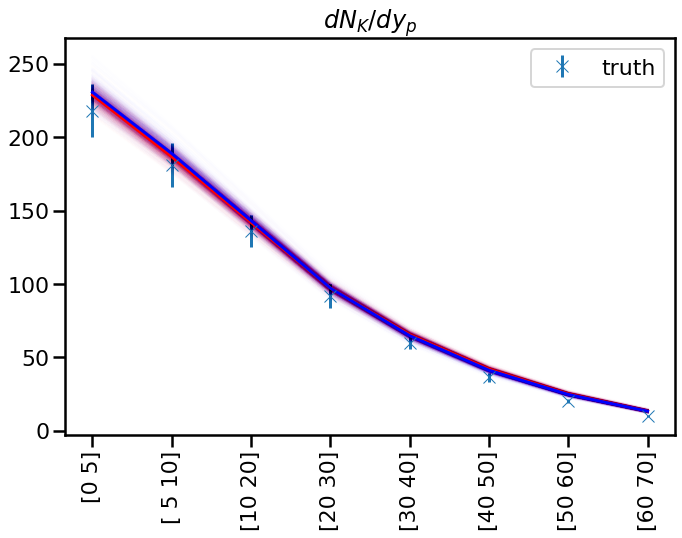

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
62.486155869628895
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
61.149530925734986
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.41

low
[ 1.85807444e+01 -9.58162549e-02  9.91995491e-01  2.92961301e-03
  1.01940188e+00  1.38568361e-01  1.99439369e-01  8.69859503e-02
 -1.07138185e+00  1.49438853e+00  4.52002187e-02  1.42555102e-01
  2.83251823e-02 -3.00249362e-01  4.13110884e-01]
66.49117673138481
low
[19.87400674 -0.19348164  1.04810177  1.46941251  1.28182422  0.13821056
  0.15284825  0.10373046 -0.88366835  0.30599202  0.11142278  0.13551894
  0.02744809 -0.7553183   0.34853628]
64.12426620304122
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.83788778e+01 -3.27222794e-01  1.10737478e+00  1.23907892e+00
  1.24667479e+00  1.39934581e-01  2.59062143

low
[ 2.11313313e+01 -3.09302914e-01  9.29121810e-01  1.47951400e+00
  1.40602407e+00  1.38736157e-01  2.50646226e-01  9.76327365e-02
  1.45540144e-01  1.17992198e+00  1.96101288e-02  1.54370201e-01
  5.65388431e-02 -6.46716720e-01  6.49639076e-01]
67.58926697428075
low
[19.43979765 -0.05007256  0.90255463  1.15000013  1.06537421  0.1379665
  0.24291536  0.1543016   0.75433767  0.9967463   0.04329311  0.22816706
  0.0319415  -0.76520901  0.81886423]
62.71469180550856
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.80436725e+01 -3.17614431e-01  1.16802952e+00  1.46914286e+00
  1.50242426e+00  1.41956034e-01  1.85898029e

67.49356836714547
low
[ 2.15325855e+01 -6.94877139e-02  9.86150891e-01  7.99442880e-01
  1.22312042e+00  1.35937603e-01  2.25509840e-01  1.09911154e-01
 -2.14221303e-02  1.07360731e+00  5.10147002e-02  1.74569887e-01
  4.73859964e-02 -6.45792185e-01  9.89847889e-01]
64.4989031700382
low
[19.77872523 -0.12914023  1.0334195   0.24057573  0.90667758  0.13533457
  0.23936884  0.02804464 -1.7159255   1.3182399   0.12691832  0.18557765
  0.03550461 -0.53648496  0.66984931]
62.28781209548851
low
[19.21377362 -0.28006977  0.94365758  0.84783172  0.92477599  0.13587119
  0.22995306  0.02042572 -1.30000999  1.93252611  0.15053658  0.2437111
  0.03141093 -0.70233281  0.48471623]
65.04696181113594
low
[18.85282538 -0.35147858  0.85622091  1.66202192  1.2245487   0.13676886
  0.23407565  0.06506331 -1.17402974  1.59643422  0.02857756  0.1287031
  0.03711229 -0.54847033  0.76989422]
61.55073835400265
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T

67.20646123824172
low
[21.38356435 -0.13653206  1.02318879  1.35407622  1.3170058   0.13816528
  0.23586274  0.12896858  0.17349003  0.44449571  0.03823545  0.1851726
  0.05622413 -0.76611818  0.92761612]
60.809990382949685
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.61048148 -0.28600114  1.07972231  1.59512411  1.35775577  0.13846372
  0.18841404  0.06565243 -1.6122018  -0.10592005  0.11329088  0.17355736
  0.03054038 -0.50725713  0.3430409 ]
62.927867640259315
low
[20.948522   -0.26080352  0.9348729   1.63768529  1.46063321  0.1354012
  0.21100619  0.10920002  0.19268318  1.20314269  0.04142129  0.16642805
  0.03

63.46175602278403
low
[19.05281367 -0.19950696  0.93973525  0.27304662  0.83967085  0.13706178
  0.26559962  0.17484367  0.82642092  1.59701675  0.02475124  0.19546712
  0.0630668  -0.73423862  0.44151197]
63.357159209664545
low
[20.43060044 -0.16916095  1.0387349   1.40159881  1.15020204  0.14069264
  0.19415327  0.09429404 -1.12575113  0.41391349  0.07384192  0.15136112
  0.03002967 -0.47606776  0.54817344]
64.82604787776323
low
[20.67975053 -0.02871913  1.00878906  0.23518577  1.02800906  0.13807756
  0.23967075  0.04659401 -0.73187954  0.87965209  0.0653038   0.16129052
  0.03291319 -0.78119769  0.4178963 ]
65.85233174485535
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV

65.98247270713529
low
[21.55867132 -0.06635154  1.00940133  1.22575702  1.30507993  0.13691996
  0.16281667  0.099115   -1.20250919  0.29795863  0.09152726  0.2235476
  0.07398773 -0.78373051  0.67690302]
60.43209086917527
low
[18.03458511  0.02948967  0.9931022   0.2711633   1.11105046  0.14011315
  0.13081657  0.04469895 -0.04175107  1.66537603  0.03533375  0.17305564
  0.03453565 -0.49149583  0.94948534]
60.92921736751576
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89967068e+01 -1.19252086e-01  1.16426405e+00  1.64534034e+00
  1.43950764e+00  1.40211873e-01  2.84379576e-01  1.28543857e-01
  4.64364987e-01 -4.300

63.39520433917825
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.92444484 -0.19319399  1.08964001  1.32950338  1.15685825  0.14579961
  0.23628757  0.11216314  0.11662179 -0.0768686   0.05699114  0.29977679
  0.06604559 -0.57931368  0.96305414]
66.8840097504131
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV

low
[21.41850898 -0.051461    1.04289695  1.52779767  1.31853531  0.13841211
  0.23334634  0.07545342 -0.76190198  0.3807695   0.1844021   0.15172509
  0.02524479 -0.69755493  0.43260176]
67.60671655259446
low
[21.90542659 -0.16224673  0.96139348  1.08490319  0.94068474  0.14092441
  0.23620345  0.03771382 -1.31798521  0.66635719  0.07008958  0.13964034
  0.02736171 -0.08987811  0.4738237 ]
63.51163489697959
low
[20.07906996  0.0462753   1.05880757  0.27336204  0.76593603  0.13671226
  0.29848898  0.13568741  0.40931369  1.9804483   0.03031267  0.12679735
  0.04159416  0.08727284  0.40195335]
65.72538072876698
low
[ 1.96968612e+01 -3.69960069e-01  8.17710177e-01  1.48928783e+00
  1.41463328e+00  1.37151128e-01  2.70719788e-01  6.87240519e-02
 -1.15424100e+00  1.24711350e+00  1.93321811e-02  1.63814783e-01
  4.02079922e-02 -7.07078903e-01  5.06202854e-01]
61.86677590956785
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$

  0.0376554  -0.4273832   0.79512681]
60.16391054333752
low
[21.37713839 -0.1600209   0.96886817  0.41613555  1.13561642  0.13609847
  0.23024397  0.10284057  0.08636341  0.90637702  0.02366243  0.17179102
  0.04049567 -0.79368256  0.86966979]
61.57629309987921
low
[18.35678362 -0.07072159  0.9103889   0.90884373  1.11209459  0.13624344
  0.22408688  0.04612399 -1.21935489  1.81219781  0.06161421  0.17364146
  0.02947292 -0.5947085   0.43072947]
64.18736857832783
low
[18.90392121 -0.06274767  1.05003913  1.02486504  1.20646818  0.13526873
  0.15990727  0.09072618 -1.2289216   0.7990255   0.08621005  0.18477423
  0.04601912 -0.79972645  0.50531645]
62.561354770385364
low
[20.40184187 -0.25186936  0.851249    0.72935221  1.05006515  0.14473913
  0.27410765  0.16441649  0.38131028  0.42670477  0.04342566  0.22457582
  0.05862702 -0.73801931  0.99021918]
64.71613804325816
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [Ge

  5.15894691e-02 -7.95717727e-01  8.73483614e-01]
65.18108749075631
low
[19.31883837 -0.10059805  0.9679871   1.07983705  0.91215367  0.14201822
  0.2534083   0.10510501  0.19286365  1.51912827  0.02306935  0.2130999
  0.06294514 -0.54689453  0.3863009 ]
66.69159545245125
low
[18.69734375 -0.11329933  0.92821041  0.04775668  0.86098722  0.14023054
  0.26638854  0.15995999  0.63899846  1.77888454  0.05033604  0.19877323
  0.02950883 -0.60550158  0.65115185]
66.75942167307034
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.85968929 -0.20815037  1.25784929  0.29077197  1.40535199  0.14092817
  0.19619836  0.13151957  0.85

low
[ 1.98410474e+01 -4.50226980e-02  1.02679509e+00  5.77357920e-01
  1.08284908e+00  1.40632024e-01  2.84614575e-01  1.22380028e-01
  7.02655984e-01  8.55793221e-01  1.75967855e-02  2.64655276e-01
  3.29536390e-02 -6.08760570e-01  5.36827968e-01]
62.198899033879
low
[18.54661008 -0.11288591  0.94121156  1.38821648  1.31634242  0.13944799
  0.2330575   0.082644    0.06515788  1.83073234  0.0529803   0.23939253
  0.03904772 -0.65388802  0.52811991]
64.26506172822162
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.96279497e+01 -4.13035304e-01  1.14248768e+00  1.31443356e+00
  1.41228986e+00  1.37854390e-01  2.96920345e-

61.94645373708378
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.82125548e+01 -3.13289202e-01  1.17502824e+00  2.62657893e-01
  1.27507602e+00  1.45697037e-01  1.33955610e-01  1.23147182e-01
  5.00461008e-01 -1.58977764e-01  1.30759453e-02  1.49189641e-01
  1.15028471e-01  5.51964341e-01  6.05683662e-01]
65.99841577115788
low
[21.12125064 -0.15956034  1.01885896  0.77428246  1.14516949  0.14064153
  0.28755668  0.12050065  0.24194904  0.8351817   0.03231476  0.21132877
  0.08227127 -0.62384393  0.46181938]
65.48729627467003
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$'

64.87839300540297
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.12830797 -0.21672     1.27106165  1.24766999  1.49260892  0.13748596
  0.24732257  0.12661311  0.30299986 -0.35500516  0.22994496  0.16837226
  0.03433154 -0.53485383  0.33171806]
65.64368716867347
low
[ 2.14636080e+01 -2.59153330e-01  9.49171245e-01  1.43758841e+00
  1.28702717e+00  1.37693282e-01  2.74354679e-01  4.62762908e-02
 -7.29556295e-01  7.48308344e-01  1.51099891e-02  1.49039952e-01
  4.36621991e-02 -6.23971399e-01  5.67274961e-01]
57.30118369129073
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$'

62.14999334410036
low
[20.48409905 -0.16565665  0.86583107  0.27201266  0.90172308  0.13980142
  0.26869385  0.13474543  0.80350291  1.18082419  0.02768972  0.17381629
  0.05887587 -0.42801475  0.912895  ]
62.98965694710962
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.64595029 -0.26896109  1.15725613  0.14265964  1.33808121  0.13827654
  0.16274569  0.14408645  0.96407614 -0.33303094  0.17760842  0.23353178
  0.05102352 -0.77206975  0.90353293]
61.475669349743306
low
[18.20378958 -0.0330424   0.9829844   0.22076513  1.0713895   0.13771895
  0.23773682  0.14292041  0.21088168  1.91875444  0.04183121  0.12379527
  0.0

63.203444655311024
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.7299339  -0.2048258   1.11303147  1.60576059  1.42766733  0.14159779
  0.13135993  0.11330395  0.29903506 -0.22061101  0.05405284  0.26028759
  0.09819671 -0.28989954  0.46405417]
60.69262614519612
low
[19.37096365 -0.07539545  0.95711451  0.67631707  1.09113552  0.13795557
  0.26027383  0.09471024 -0.21058705  1.73059502  0.02833402  0.12654213
  0.03975752 -0.02852728  0.40443193]
61.96982876472104
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}

      dtype='object')
[ 2.90954313e+01 -2.11167433e-01  1.03418493e+00  1.65877189e+00
  1.52103547e+00  1.44142700e-01  1.53901682e-01  1.13266214e-01
  2.82162709e-01 -8.98705367e-02  2.76732177e-02  2.69878197e-01
  7.98499207e-02 -5.58494250e-01  9.85132733e-01]
62.27669218946772
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.74292383 -0.19841954  1.03806365  1.4774789   1.38989275  0.13618746
  0.15138018  0.13671235  0.9097393  -0.30311015  0.18316773  0.15377475
  0.04029932 -0.38213892  0.93838512]
61.78376447596865
low
[ 2.04392428e+01 -1.34057246e-01  9.22582763e-01  1.47678972e+00
  1.10448388e+00  1.453549

65.1971016139997
low
[18.14756251  0.04326194  0.9920707   0.66325605  0.96689344  0.13960138
  0.21692884  0.03656311 -0.70771715  1.62333982  0.02836905  0.23396993
  0.03530021 -0.7371383   0.35016268]
63.21125053776587
low
[20.48629861 -0.30963815  0.92548895  1.69395965  1.22759477  0.13662316
  0.23093751  0.07720388 -0.66585074  1.84739244  0.04980633  0.17231399
  0.05834607 -0.79640672  0.58432613]
70.06174144260937
low
[ 1.91303189e+01 -1.27641457e-01  9.63448869e-01  1.06845959e+00
  1.21444339e+00  1.39098725e-01  2.28434400e-01  1.28335246e-01
  5.92449494e-01  1.19420819e+00  1.70798827e-02  1.25212311e-01
  6.11285133e-02 -4.63378449e-01  4.32855854e-01]
64.83965370456224
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s

63.599140178703095
low
[ 1.94320307e+01 -1.19270292e-01  9.40680881e-01  1.57248269e+00
  1.13313183e+00  1.37896704e-01  2.98441039e-01  1.37331437e-01
  4.66244358e-01  1.52257563e+00  1.10253692e-02  1.66871258e-01
  4.00730982e-02 -5.79435576e-01  4.90504320e-01]
65.7247458096894
low
[ 1.86979834e+01 -1.47939935e-01  9.88587493e-01  8.81004454e-02
  9.84067556e-01  1.38264267e-01  2.99616087e-01  1.61012095e-01
  5.03306855e-01  1.12863190e+00  1.60478016e-02  1.27802778e-01
  4.21634095e-02  3.62655251e-02  3.91586560e-01]
61.61518310094165
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.8990347  -0.0840116   1.16

63.42459355789024
low
[19.94885359 -0.34000859  0.9915111   0.79930539  0.74545658  0.14289861
  0.28129072  0.11616217  0.36932592  0.83655456  0.02617045  0.20993916
  0.06365604 -0.65944949  0.36635265]
66.98400048715018
low
[ 2.12568951e+01 -8.41634204e-02  9.12332366e-01  3.16881697e-01
  8.61721043e-01  1.35119843e-01  2.49615378e-01  4.65130144e-02
 -7.51995809e-01  1.97620299e+00  1.17368442e-02  1.22442844e-01
  1.44927423e-01 -7.23160648e-01  4.81931371e-01]
62.82512804460498
low
[ 1.90119773e+01 -1.94847329e-01  9.49559397e-01  1.02960765e+00
  1.18704415e+00  1.35792432e-01  2.60099336e-01  1.25430033e-01
  6.94788608e-01  1.38738368e+00  1.39018730e-02  1.41412748e-01
  3.28685042e-02 -5.31177744e-01  3.49664422e-01]
63.59028953954393
low
[18.68489346 -0.15632058  0.9199812   0.10890016  0.771731    0.14175091
  0.26715521  0.17010718  0.51922721  1.61968917  0.04411972  0.16527328
  0.04812808 -0.55492333  0.55280038]
68.21640180817631
low
[ 1.84777132e+01 -3.08106646e-02

  0.0405363  -0.47364344  0.4678097 ]
66.33911518076589
low
[18.68731381 -0.11938943  0.92721331  1.11950412  1.10408585  0.13542484
  0.2897072   0.13834778  0.54654937  1.28427564  0.02204504  0.16614712
  0.04588042 -0.72849633  0.38926845]
63.31221254658779
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89983340e+01 -3.62523762e-01  1.10020048e+00  9.55002643e-03
  1.25348177e+00  1.45162663e-01  1.62773271e-01  1.25979751e-01
  9.96609188e-01 -1.55621986e-01  3.48102752e-02  2.32851772e-01
  4.72374049e-02 -5.13277452e-01  9.90163100e-01]
61.97020126331241
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\ma

58.209435023277265
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.91995917 -0.27301568  1.26659296  0.75942082  1.48727025  0.13754333
  0.28910063  0.14826199  0.87375632 -0.58186672  0.10795801  0.266027
  0.03339892  0.42275698  0.97418758]
56.49217275037881
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.47641216 -0.23300072  1.03153481  1.56710655  1.49305166  0.13925518
  0.25823882  0.13597255  0.40891864 -0.27184888  0.13222798  0.22843361
  0.06831364 -0.68999542  0.97002961]
63.91670137289352
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

67.96507582717295
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.59397699 -0.30375901  1.14572052  1.5179625   1.41996153  0.14123897
  0.23496135  0.13178499  0.81310823 -0.22925293  0.04334388  0.20138005
  0.11693657 -0.63690474  0.96447366]
64.61606770725447
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [Ge

57.66036431233234
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.68235403 -0.29050934  1.15991528  1.52380751  1.45504419  0.14140555
  0.2548125   0.12929101  0.70862302 -0.33896173  0.08407389  0.19606684
  0.04805595 -0.04334687  0.80665084]
63.559948635779804
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

61.70911863848726
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.06782476 -0.31175331  1.04157019  1.60154848  1.37345534  0.14277557
  0.20654197  0.1327381   0.99404765 -0.27945522  0.04122684  0.18781665
  0.06502466 -0.66109827  0.95318873]
61.665705896436926
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

61.939108364264015
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.85371497e+01 -2.94220514e-01  1.01086738e+00  1.67411279e+00
  1.22324540e+00  1.39055285e-01  2.44639205e-01  2.14456623e-02
 -1.45363683e+00  1.71423277e-01  1.59590936e-01  1.87882097e-01
  3.10601759e-02 -4.85604741e-01  5.44307361e-01]
62.51566126069214
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\ze

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


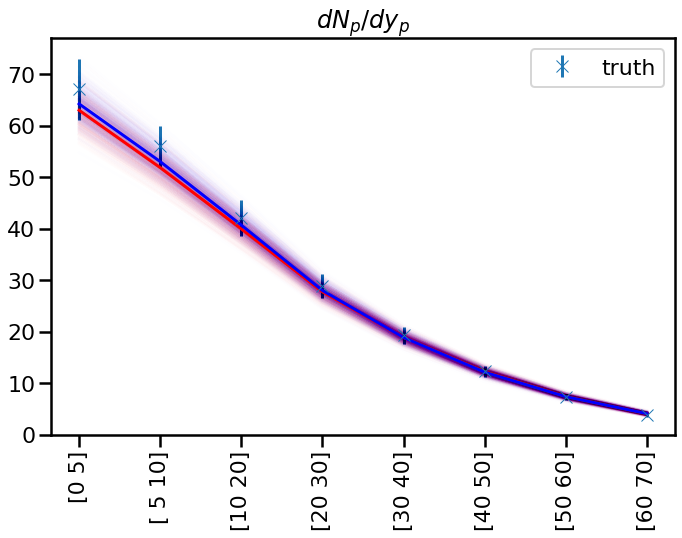

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
0.5371976316851973
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
0.5468400753158054
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.41

0.5299636208824328
low
[ 1.85807444e+01 -9.58162549e-02  9.91995491e-01  2.92961301e-03
  1.01940188e+00  1.38568361e-01  1.99439369e-01  8.69859503e-02
 -1.07138185e+00  1.49438853e+00  4.52002187e-02  1.42555102e-01
  2.83251823e-02 -3.00249362e-01  4.13110884e-01]
0.5450374691047045
low
[19.87400674 -0.19348164  1.04810177  1.46941251  1.28182422  0.13821056
  0.15284825  0.10373046 -0.88366835  0.30599202  0.11142278  0.13551894
  0.02744809 -0.7553183   0.34853628]
0.5343582973529133
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.83788778e+01 -3.27222794e-01  1.10737478e+00  1.23907892e+00
  1.24667479e+00  1.399

0.5425863771292104
low
[19.43979765 -0.05007256  0.90255463  1.15000013  1.06537421  0.1379665
  0.24291536  0.1543016   0.75433767  0.9967463   0.04329311  0.22816706
  0.0319415  -0.76520901  0.81886423]
0.5339490851250716
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.80436725e+01 -3.17614431e-01  1.16802952e+00  1.46914286e+00
  1.50242426e+00  1.41956034e-01  1.85898029e-01  1.33787918e-01
  9.17785170e-01 -2.47706722e-01  2.42450332e-02  1.51162710e-01
  1.45054640e-01  1.30904672e-01  7.87163251e-01]
0.5351369250499579
low
[18.98604981 -0.04268528  1.02855928  1.56254178  1.20368391  0.13664762
  0.27221217  0.

0.5236366802300293
low
[ 2.15325855e+01 -6.94877139e-02  9.86150891e-01  7.99442880e-01
  1.22312042e+00  1.35937603e-01  2.25509840e-01  1.09911154e-01
 -2.14221303e-02  1.07360731e+00  5.10147002e-02  1.74569887e-01
  4.73859964e-02 -6.45792185e-01  9.89847889e-01]
0.5482671324564969
low
[19.77872523 -0.12914023  1.0334195   0.24057573  0.90667758  0.13533457
  0.23936884  0.02804464 -1.7159255   1.3182399   0.12691832  0.18557765
  0.03550461 -0.53648496  0.66984931]
0.5324303603211933
low
[19.21377362 -0.28006977  0.94365758  0.84783172  0.92477599  0.13587119
  0.22995306  0.02042572 -1.30000999  1.93252611  0.15053658  0.2437111
  0.03141093 -0.70233281  0.48471623]
0.5499992387364903
low
[18.85282538 -0.35147858  0.85622091  1.66202192  1.2245487   0.13676886
  0.23407565  0.06506331 -1.17402974  1.59643422  0.02857756  0.1287031
  0.03711229 -0.54847033  0.76989422]
0.5265556308260525
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$

0.5322957156879073
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.41541408 -0.21110517  1.11487636  1.31906841  1.33686583  0.14104725
  0.19869328  0.09760454  0.36959359 -0.11088031  0.12941449  0.14646323
  0.0432809  -0.64766644  0.61725385]
0.5256446634936055
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.5362678480788221
low
[20.67975053 -0.02871913  1.00878906  0.23518577  1.02800906  0.13807756
  0.23967075  0.04659401 -0.73187954  0.87965209  0.0653038   0.16129052
  0.03291319 -0.78119769  0.4178963 ]
0.525896533851164
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.05267887 -0.27213097  1.15678938  1.52547227  1.34203517  0.14300974
  0.20405329  0.13499337  0.70358658 -0.31142795  0.15468982  0.26305784
  0.04322917 -0.79039742  0.54484646]
0.5269417327266568
low
[21.94962922 -0.13224038  0.96720052  0.44773137  1.12207022  0.13779446
  0.2498289   0.02934704 -1.36714751  0.96569591  0.05459188  0.18710476
  0.

  0.04026656 -0.66609067  0.35269946]
0.5332415214293249
low
[19.41303631 -0.17447604  0.95273871  1.66093777  1.53442623  0.1371657
  0.14751108  0.02552373 -1.64847777  1.25553643  0.03124723  0.20140805
  0.02668428 -0.71737695  0.62540549]
0.5455786065234972
low
[19.77608878 -0.13100439  0.9674389   1.25466472  0.79309949  0.14031898
  0.28885677  0.16260323  0.69740559  1.74694884  0.03275347  0.19055398
  0.04684521 -0.28077906  0.8342057 ]
0.5410942579089496
low
[21.71711214 -0.02829361  0.99074287  0.63125296  1.25278917  0.13540438
  0.29332011  0.07385645 -0.16966579  1.18890484  0.06861726  0.13837523
  0.06047849 -0.65070555  0.95608252]
0.525228162289477
low
[19.64506645 -0.02606584  1.05711214  1.30001412  1.28356707  0.1373889
  0.14532716  0.053695   -1.32476296  1.19485443  0.06036181  0.160395
  0.05391823 -0.58517822  0.96912293]
0.5397868911299124
low
[20.4166307  -0.09122039  0.95719411  1.28132088  1.00205713  0.13848132
  0.28657903  0.07032111 -0.29093858  1.557

0.5109436841263992
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.1108874  -0.25921294  1.0748275   1.23899365  1.77194743  0.13881993
  0.27771713  0.17393524  0.96494026 -0.81045428  0.10683232  0.25938344
  0.12948643  0.1936123   0.99834593]
0.5171702161509744
low
[19.65885356 -0.18078243  1.01761332  1.57323205  1.47920609  0.135085
  0.26723279  0.16649533  0.85119147  1.15222974  0.03558774  0.17390234
  0.03205492 -0.35206668  0.59106821]
0.5452410982385263
low
[19.30563162 -0.20692625  0.92325957  0.57689428  1.22473467  0.13558626
  0.2917767   0.13377794  0.38561121  0.78738314  0.03502065  0.14372003
  0.0

0.5462467283939624
low
[ 1.91698347e+01 -5.55519846e-02  9.93506585e-01  4.18324755e-01
  8.74558584e-01  1.42602522e-01  2.52540513e-01  8.55000028e-02
  1.63290098e-01  1.47611831e+00  1.26751769e-02  2.69832859e-01
  3.34807961e-02 -6.46756139e-01  3.66310612e-01]
0.5365641916073114
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.57675262 -0.29684391  1.00668488  1.52214438  1.34936896  0.14420977
  0.26246909  0.11727075  0.14948556 -0.22325784  0.03532032  0.20846503
  0.03351393 -0.48683185  0.92675938]
0.541074442032361
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

0.5483523646213951
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.81781706 -0.23515794  1.17002627  1.66823874  1.39217266  0.13784198
  0.18611846  0.09261282 -1.34066683 -0.14052104  0.21997877  0.27983071
  0.0376554  -0.4273832   0.79512681]
0.5405741254886501
low
[21.37713839 -0.1600209   0.96886817  0.41613555  1.13561642  0.13609847
  0.23024397  0.10284057  0.08636341  0.90637702  0.02366243  0.17179102
  0.04049567 -0.79368256  0.86966979]
0.5470222457996261
low
[18.35678362 -0.07072159  0.9103889   0.90884373  1.11209459  0.13624344
  0.22408688  0.04612399 -1.21935489  1.81219781  0.06161421  0.17364146
  0

0.5488713023029261
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.97453920e+01 -2.01482035e-01  1.25097845e+00  1.24702301e+00
  1.42058488e+00  1.43654709e-01  2.07922588e-01  1.19164860e-01
  9.75981959e-01 -2.46757909e-01  2.70019151e-02  2.22621135e-01
  3.59021109e-02 -1.14051460e-01  9.03530618e-01]
0.5385794628985309
low
[18.93561099 -0.12308049  0.97587623  0.80835124  1.24069365  0.13511749
  0.22269732  0.07212253 -0.83078003  1.19627571  0.06344534  0.12794529
  0.03086605 -0.32265406  0.50871298]
0.5448935374290749
low
[ 2.05988102e+01 -2.74214416e-01  9.65154334e-01  1.29689863e+00
  1.21209559e+00  1.384

low
[19.86399622 -0.03940656  1.10092397  1.40757607  1.33970098  0.13759343
  0.15515775  0.07812941 -0.40986388  0.65918562  0.10103423  0.13828832
  0.09199889 -0.77736796  0.5501594 ]
0.5384333973710357
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90607811e+01 -1.46337330e-01  1.21282350e+00  8.66470078e-01
  1.24795517e+00  1.43513553e-01  2.82757073e-01  1.01109914e-01
  2.37430763e-01 -1.59099235e-01  1.26065915e-02  2.64520487e-01
  1.17998299e-01  1.15579307e-01  8.43746148e-01]
0.5337668319901675
low
[ 1.98410474e+01 -4.50226980e-02  1.02679509e+00  5.77357920e-01
  1.08284908e+00  1.40632024e-01  2.846145

0.546814028283447
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.82125548e+01 -3.13289202e-01  1.17502824e+00  2.62657893e-01
  1.27507602e+00  1.45697037e-01  1.33955610e-01  1.23147182e-01
  5.00461008e-01 -1.58977764e-01  1.30759453e-02  1.49189641e-01
  1.15028471e-01  5.51964341e-01  6.05683662e-01]
0.5306291880549954
low
[21.12125064 -0.15956034  1.01885896  0.77428246  1.14516949  0.14064153
  0.28755668  0.12050065  0.24194904  0.8351817   0.03231476  0.21132877
  0.08227127 -0.62384393  0.46181938]
0.5521866805632791
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

0.5368473631172281
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.53407146 -0.1760977   1.09171581  0.80692     1.36352269  0.14147837
  0.16679765  0.11006654  0.7452269  -0.17682839  0.14038094  0.20476239
  0.03106356 -0.45023707  0.94066877]
0.5298089883476219
low
[ 2.00493305e+01 -1.60216341e-01  9.88091694e-01  3.58889222e-01
  1.00828664e+00  1.37924859e-01  2.77636615e-01  7.70075635e-02
  5.68022463e-02  1.39562983e+00  1.51938861e-02  1.43707436e-01
  5.93304444e-02 -4.25911933e-01  4.87778930e-01]
0.5418743314534067
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_

[29.74684647 -0.29283448  1.18925055  0.992214    1.34816862  0.13879348
  0.25239223  0.12684504  0.84393921 -0.33594768  0.19475408  0.27806301
  0.06811687 -0.76185269  0.90697125]
0.5194536515184969
low
[19.48306196 -0.04147982  1.02915387  0.2336521   1.16053522  0.13605267
  0.17870456  0.09106853 -0.67514713  0.55771398  0.13664689  0.13091625
  0.0348959  -0.65906668  0.33554522]
0.5419141981979593
low
[19.53303615 -0.17172016  0.94924659  1.16385146  1.30806362  0.13717132
  0.16911182  0.07616699 -0.67850729  1.52802665  0.03159217  0.19556878
  0.03793409 -0.78601638  0.90409362]
0.5426186434643986
low
[ 2.18295006e+01 -2.58651024e-01  1.00236224e+00  6.04256909e-01
  7.70042852e-01  1.39860224e-01  2.46900263e-01  6.39517188e-02
 -7.82045741e-01  7.86549760e-01  1.87995864e-02  1.52908354e-01
  4.04472864e-02 -5.51567721e-01  3.71327563e-01]
0.5454005938513897
low
[18.52082701 -0.14424663  0.97412956  1.10170223  1.30788768  0.13967288
  0.18944892  0.05852339  0.14431565  

0.5465874446915606
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.98459975 -0.21967367  1.11281484  0.74746217  1.1575385   0.13885992
  0.15187046  0.08026455 -1.58928557 -0.08375903  0.03019283  0.12116907
  0.14551869  0.70584795  0.70248786]
0.5415917076446412
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.5450918951786055
low
[19.53435105 -0.20636268  0.97293566  1.18011818  1.15994385  0.13537961
  0.27897687  0.09542446 -0.11892509  1.36120273  0.05251804  0.16077516
  0.03808468 -0.45535625  0.32932144]
0.5440152108626716
low
[18.36385225 -0.08598675  1.07853068  1.58010385  1.46215076  0.13731775
  0.20801612  0.10332583  0.76142693  1.41193715  0.0451827   0.24349665
  0.02999232 -0.47029617  0.46069792]
0.5613303933629779
low
[19.61091819 -0.02771605  0.96777784  0.96420035  1.14875109  0.13554092
  0.24101943  0.13583409  0.2790451   1.51638372  0.1074543   0.16509363
  0.03546059 -0.56607034  0.99754685]
0.5281741904029778
low
[19.43566975 -0.20919915  1.014705    0.44823381  1.22125063  0.13530975
  0.20628242  0.18908028  0.983887    0.5392924   0.06301643  0.14371652
  0.04808584 -0.57829056  0.39022021]
0.5571609923213394
low
[20.52137557 -0.08583344  0.95820826  1.06476657  1.16381429  0.13521092
  0.27981862  0.11555065  0.18563612  1.04720118  0.02523583  0.15708561
  0

0.5336008865742031
low
[18.17782385 -0.09197026  0.95685606  1.53007912  1.16039042  0.13881343
  0.25884031  0.08540294 -0.07692744  1.35006441  0.02694295  0.20786821
  0.03196874 -0.7529422   0.33618902]
0.5235975368093688
low
[18.5258407   0.05037878  0.98718931  0.0603478   1.08519671  0.13670267
  0.18945177  0.01977551 -1.70901364  1.70492984  0.0275619   0.17252138
  0.05312009 -0.63760285  0.55528781]
0.5417541592050706
low
[21.19799368 -0.10015337  1.06908048  1.64150747  1.34740171  0.14134437
  0.23862966  0.15791111  0.9407763   0.34082659  0.04801458  0.22770019
  0.03377174 -0.64219618  0.92001836]
0.5440207324032602
low
[ 1.96376182e+01 -2.85140813e-02  9.66384634e-01  1.24404483e+00
  1.25215652e+00  1.37712115e-01  2.87110291e-01  1.07307541e-01
 -3.69608355e-03  1.18124915e+00  7.25238958e-02  1.59936558e-01
  5.61843742e-02 -5.20388902e-01  4.49086150e-01]
0.5361149127949502
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_

0.5429357591279437
low
[20.54295755 -0.15454151  1.13401802  1.27661788  1.1994549   0.13528606
  0.21225951  0.06228452 -1.1903047   0.59135387  0.09831046  0.12486129
  0.03832278 -0.39968755  0.33043595]
0.545321186504595
low
[ 2.02199711e+01 -8.78328885e-03  9.19542067e-01  7.91293148e-01
  1.02680112e+00  1.41208320e-01  2.96583362e-01  1.74499556e-01
  4.67635579e-01  8.25833685e-01  2.11323789e-02  1.46271173e-01
  2.61291239e-02 -5.26130649e-03  9.51005504e-01]
0.5306160541112871
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.94586904e+01 -4.08452317e-01  1.00409032e+00  1.54866920e+00
  1.32989170e+00  1.4478

0.5398174107520494
low
[19.8576016  -0.0358433   0.90451703  1.20410661  1.21816743  0.13820937
  0.25601148  0.0257943  -0.96208028  1.25882356  0.07870474  0.14729333
  0.04412733 -0.71123612  0.35541739]
0.5228700136561486
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.85072925e+01 -2.80202339e-01  1.07080310e+00  3.30308620e-01
  1.13770780e+00  1.37223763e-01  2.62468536e-01  4.72304198e-02
 -1.10840364e+00  2.04195698e-02  2.23832353e-01  1.75544871e-01
  3.16717501e-02 -5.27653832e-01  3.94038739e-01]
0.5345584021303594
low
[18.57817962 -0.2360784   1.04725997  0.10839374  1.0846245   0.13869635
  0.23652071  0

0.5317635102536813
low
[20.71992388 -0.04917786  0.99118966  1.19549238  0.91782326  0.14369713
  0.14280474  0.07991428 -0.33030452  0.56576607  0.06685911  0.247465
  0.07278508 -0.68852413  0.82650364]
0.5430020684046499
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.99472966e+01 -2.49000280e-01  9.46735825e-01  3.57803497e-01
  1.18705453e+00  1.37476488e-01  2.84402309e-01  4.76640253e-02
 -8.94680586e-01 -3.38488623e-02  1.35041594e-01  1.73189101e-01
  2.78353535e-02 -6.63425472e-01  5.02777573e-01]
0.5369340138073815
low
[20.84064207 -0.22453044  1.04540605  1.10454363  1.22396867  0.13886371
  0.2672548   0.1

0.5321485984775939
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.90073445 -0.22752499  1.03030024  1.57930049  1.39987625  0.14092592
  0.28148045  0.04068058 -0.60649932  0.06356341  0.046208    0.14790433
  0.05254672  0.03251417  0.60104255]
0.5395692237976347
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.5293073504829208
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.86898565 -0.38317854  1.16576413  0.84562193  1.40685171  0.14062405
  0.24562959  0.15951517  0.88734313 -0.35166668  0.04122695  0.20690067
  0.07481835  0.26528665  0.9488053 ]
0.5444048888013768
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.5285072571117055
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.68864002 -0.25733697  1.12591553  0.80267779  1.29119905  0.14278893
  0.14192813  0.11450659  0.05491496 -0.18407321  0.05622216  0.14345076
  0.04609903  0.29764357  0.47673664]
0.5272580466882515
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.82992456 -0.38629622  1.11366783  1.49374333  1.60746142  0.13524727
  0.25777048  0.14008354  0.57402016 -0.32906314  0.09108694  0.14919745
  0.04433788 -0.18361485  0.97811778]
0.5405375828709598
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\

0.5317435537603833
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.06782476 -0.31175331  1.04157019  1.60154848  1.37345534  0.14277557
  0.20654197  0.1327381   0.99404765 -0.27945522  0.04122684  0.18781665
  0.06502466 -0.66109827  0.95318873]
0.5318822112888862
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.5338048560251223
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.18988903 -0.19727215  1.13529157  1.29668949  1.49258841  0.14145732
  0.17280567  0.12879312  0.90679147 -0.31551893  0.17635175  0.18767173
  0.04493772 -0.27839976  0.4135451 ]
0.5265484917697331
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


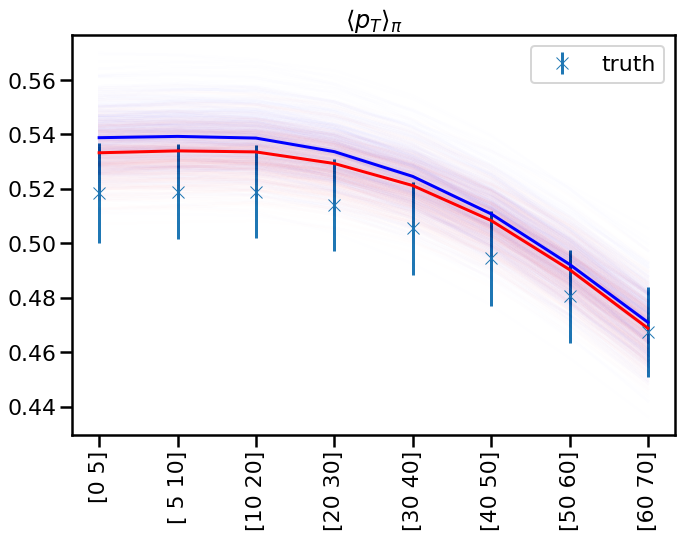

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
0.8506621727210925
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
0.866070476746441
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.410

0.8623006959998875
low
[18.90249633 -0.27387715  0.88687071  0.56222969  1.06142784  0.13664856
  0.26192536  0.19089311  0.69785458  1.6717955   0.09084923  0.13865917
  0.03331049 -0.49110208  0.78132775]
0.8396290852382138
low
[ 1.85807444e+01 -9.58162549e-02  9.91995491e-01  2.92961301e-03
  1.01940188e+00  1.38568361e-01  1.99439369e-01  8.69859503e-02
 -1.07138185e+00  1.49438853e+00  4.52002187e-02  1.42555102e-01
  2.83251823e-02 -3.00249362e-01  4.13110884e-01]
0.8656532271583087
low
[19.87400674 -0.19348164  1.04810177  1.46941251  1.28182422  0.13821056
  0.15284825  0.10373046 -0.88366835  0.30599202  0.11142278  0.13551894
  0.02744809 -0.7553183   0.34853628]
0.8464805569724269
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

0.847511699517255
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.5294463  -0.32672027  0.98050297  1.5737402   1.31381638  0.14093989
  0.17161084  0.11969377 -0.723188   -0.31801838  0.04244208  0.14032151
  0.03965587 -0.6485125   0.41448546]
0.8425129689739261
low
[ 1.92203813e+01 -9.08732982e-02  8.94372366e-01  1.68514162e+00
  1.16062303e+00  1.42433091e-01  2.61791081e-01  1.36646799e-01
  4.98980807e-01  1.46639753e+00  1.80385815e-02  1.52581503e-01
  5.00339441e-02 -3.03430839e-01  9.58748926e-01]
0.83060143445825
low
[18.45166738 -0.09882525  0.969269    1.23503305  1.13731173  0.13941518
  0.23562402  0.12

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.62742229 -0.26918258  1.0987463   0.81694658  1.44897571  0.13749214
  0.2198637   0.15625144  0.59160543 -0.51940044  0.11743861  0.19029208
  0.08521833 -0.74159182  0.43621615]
0.8290384766150979
low
[ 1.90932459e+01 -2.04266953e-01  9.88134866e-01  1.26563666e+00
  1.01433294e+00  1.40716747e-01  2.70860171e-01  1.40098687e-01
  7.09123602e-01  1.77899361e+00  1.53850753e-02  2.07269618e-01
  3.59855186e-02 -5.59539520e-01  4.78227498e-01]
0.8512090851916015
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{s

0.8531991954612492
low
[ 2.15369252e+01 -1.93489026e-01  8.97401001e-01  4.85135889e-01
  8.95767791e-01  1.38165524e-01  2.94109397e-01  1.39496543e-01
  4.25454648e-01  1.14343134e+00  1.95791381e-02  1.35801423e-01
  1.07819238e-01 -4.60408114e-01  9.99910512e-01]
0.8770619126549105
low
[20.99329808 -0.1025752   0.99637836  0.97248065  1.05040782  0.13950513
  0.26576516  0.09506125 -0.22840144  1.66698501  0.0315798   0.12917299
  0.06341041 -0.63685048  0.45108605]
0.8471434461139065
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.41541408 -0.21110517  1.11487636  1.31906841  1.33686583  0.14104725
  0.19869328  0

[19.05336505 -0.18255593  1.02736173  0.45011095  1.23737911  0.13961427
  0.14858164  0.10996852  0.96158476  0.73279793  0.04717539  0.16449521
  0.04104257 -0.75988933  0.38125861]
0.8671986983514293
low
[19.05281367 -0.19950696  0.93973525  0.27304662  0.83967085  0.13706178
  0.26559962  0.17484367  0.82642092  1.59701675  0.02475124  0.19546712
  0.0630668  -0.73423862  0.44151197]
0.8623874635469666
low
[20.43060044 -0.16916095  1.0387349   1.40159881  1.15020204  0.14069264
  0.19415327  0.09429404 -1.12575113  0.41391349  0.07384192  0.15136112
  0.03002967 -0.47606776  0.54817344]
0.8500487420803969
low
[20.67975053 -0.02871913  1.00878906  0.23518577  1.02800906  0.13807756
  0.23967075  0.04659401 -0.73187954  0.87965209  0.0653038   0.16129052
  0.03291319 -0.78119769  0.4178963 ]
0.83271749491197
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\

0.8569328085397345
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89967068e+01 -1.19252086e-01  1.16426405e+00  1.64534034e+00
  1.43950764e+00  1.40211873e-01  2.84379576e-01  1.28543857e-01
  4.64364987e-01 -4.30052305e-01  1.20320535e-02  1.49956645e-01
  4.95892229e-02  2.09083507e-01  9.67380548e-01]
0.8346101761763802
low
[18.30827383 -0.06425838  0.91726332  1.65478837  1.23118263  0.1360486
  0.28632738  0.09431676  0.08153907  1.89266695  0.07434869  0.16492645
  0.02988898 -0.21337292  0.54109357]
0.8639524950982187
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.60914001 -0.29945212  1.2422547   0.4745203   1.40079188  0.14773611
  0.19368432  0.10376367  0.93189513 -0.24619369  0.0440582   0.26280235
  0.03393857 -0.48853799  0.34791369]
0.8368002195865079
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\

0.8484927626063963
low
[19.65137969 -0.04800205  1.10224819  1.481869    1.28942946  0.13635793
  0.20599045  0.08431607 -1.08630547  0.67745033  0.20766203  0.16255181
  0.02993898 -0.73136257  0.42116721]
0.8248965592661167
low
[21.19237746 -0.17772744  1.01310954  1.15795394  1.21213134  0.13565563
  0.27527129  0.06259046 -0.78557154  0.72706293  0.12904168  0.13643557
  0.04617682 -0.79355395  0.38130746]
0.8332050012910817
low
[21.41850898 -0.051461    1.04289695  1.52779767  1.31853531  0.13841211
  0.23334634  0.07545342 -0.76190198  0.3807695   0.1844021   0.15172509
  0.02524479 -0.69755493  0.43260176]
0.8350121091205717
low
[21.90542659 -0.16224673  0.96139348  1.08490319  0.94068474  0.14092441
  0.23620345  0.03771382 -1.31798521  0.66635719  0.07008958  0.13964034
  0.02736171 -0.08987811  0.4738237 ]
0.8611589253759498
low
[20.07906996  0.0462753   1.05880757  0.27336204  0.76593603  0.13671226
  0.29848898  0.13568741  0.40931369  1.9804483   0.03031267  0.12679735
  0

  0.03473454 -0.73831021  0.88536398]
0.8496788817661676
low
[19.24619204 -0.0733851   0.90402445  0.4498764   1.20493323  0.13832045
  0.20192958  0.12465736  0.84931355  1.20125804  0.06630992  0.17051691
  0.02787939 -0.56648916  0.80749612]
0.8592079692922013
low
[ 2.07775823e+01 -1.89828611e-01  9.01826855e-01  1.16996888e+00
  1.16981811e+00  1.36677405e-01  2.89259565e-01  1.71833970e-01
  8.98716020e-01  5.83747895e-01  1.72654270e-02  1.24232731e-01
  5.20619357e-02 -5.29748153e-01  9.39345653e-01]
0.8506623986624727
low
[ 1.89892608e+01 -2.99099880e-02  8.82833620e-01  1.95364601e-01
  7.73256160e-01  1.39881874e-01  2.56825333e-01  1.07773349e-01
  1.12639508e-01  1.53718437e+00  1.89338222e-02  1.94542566e-01
  5.29803660e-02 -7.49891110e-01  5.64443773e-01]
0.8355250309435233
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
     

0.8627665439772969
low
[18.73935865 -0.12802026  1.03635607  0.63184986  1.2377656   0.13553784
  0.21010946  0.08953515 -0.54812319  1.3340382   0.02348014  0.17254192
  0.05241226 -0.57460988  0.50689479]
0.869789563846281
low
[ 1.87051131e+01 -1.73726649e-01  1.01211484e+00  1.53970357e+00
  1.04147979e+00  1.38539263e-01  2.87621005e-01  1.30528992e-01
  4.38597389e-01  1.33180952e+00  1.71125024e-02  1.29751019e-01
  5.47184753e-02 -2.90722189e-01  3.48155128e-01]
0.8467636005309993
low
[19.88139087 -0.04178658  0.93102111  1.69624181  1.25197488  0.1376994
  0.29353948  0.14662759  0.29715634  1.8718316   0.06292735  0.17630301
  0.0465024  -0.36833831  0.91563163]
0.8650923351352157
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zet

      dtype='object')
[28.75060877 -0.28972084  1.12766618  0.92853993  1.29999871  0.1444914
  0.20881907  0.12008475  0.6358228  -0.26588256  0.09908634  0.26918243
  0.05718285 -0.41514402  0.3549018 ]
0.8498795859741202
low
[19.05174176 -0.12656757  0.96566183  1.07896695  1.23869657  0.13628457
  0.27821967  0.15213273  0.58713904  1.05924767  0.03139773  0.15694762
  0.06461951 -0.61649997  0.3131695 ]
0.8587561124347762
low
[20.27705245 -0.20833912  0.97121765  1.40203794  1.21205403  0.13893252
  0.25254435  0.1736373   0.97023408  0.48483167  0.04849933  0.21885796
  0.03784599 -0.73285622  0.66940158]
0.8608608125685288
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [Ge

low
[ 1.94846312e+01  2.07728106e-02  9.43625992e-01  1.37897811e+00
  1.21150704e+00  1.39537281e-01  2.19501454e-01  1.86132669e-02
 -1.28506626e+00  1.35148752e+00  4.78498841e-02  2.08471978e-01
  3.01298487e-02 -7.65377013e-01  4.06150075e-01]
0.832616479959748
low
[ 1.83472994e+01 -1.61513259e-02  9.46604234e-01  1.46195577e+00
  1.14371778e+00  1.43114393e-01  2.25370772e-01  1.04316352e-01
  4.14350469e-01  1.44295511e+00  1.74736755e-02  2.40715324e-01
  2.88202576e-02 -6.92354276e-01  7.21355210e-01]
0.8232186847331113
low
[ 1.91577856e+01  3.99339720e-03  1.06005722e+00  1.68313607e+00
  1.40092155e+00  1.36100798e-01  1.76264277e-01  3.31130600e-02
 -1.09433057e+00  1.52832763e+00  3.65951671e-02  1.73677262e-01
  4.65810708e-02 -5.57461552e-01  5.76011263e-01]
0.8662745345638053
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
  

0.8628178008371009
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.34121311 -0.4078501   1.35027492  0.18189143  1.16278783  0.13601703
  0.28932787  0.16130707  0.84532794 -0.56932872  0.21108123  0.16122334
  0.11783847  0.4893218   0.97122576]
0.8318792648508493
low
[18.62663677 -0.08270447  1.13238602  1.41597094  1.25822227  0.13589232
  0.19301352  0.06029579 -0.96988623  1.28082772  0.07212027  0.21115265
  0.03009057 -0.68918523  0.48583233]
0.8478877193013684
low
[20.72947203 -0.06300512  1.06271887  0.08139634  0.83780272  0.14370963
  0.21003728  0.11809232  0.42151401  0.45666308  0.02863563  0.18317144
  0

0.8490493967772678
low
[ 1.98500520e+01 -1.11914054e-01  1.00376980e+00  1.44757478e+00
  1.13284196e+00  1.46087420e-01  2.88600885e-01  9.88313711e-02
  6.66234565e-02  1.48249939e+00  1.43182912e-02  2.32914671e-01
  3.71277238e-02 -3.14672491e-01  5.55515469e-01]
0.8413496152905635
low
[ 1.89470720e+01 -8.75533363e-02  9.51585705e-01  1.53688153e+00
  1.03844785e+00  1.39053314e-01  2.90219811e-01  1.46701295e-01
  7.81883092e-01  1.49018203e+00  1.81553463e-02  1.60871204e-01
  5.41662790e-02 -4.98018603e-01  4.05888453e-01]
0.8411054990464684
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.90803946 -0.3509212   1

0.8234318849834144
low
[ 2.12952719e+01 -1.65108732e-01  9.43613756e-01  1.11404132e+00
  1.26440944e+00  1.39046185e-01  2.95025749e-01  9.27981401e-02
  1.91789907e-01  8.92291849e-01  1.92514651e-02  1.64702237e-01
  8.72986967e-02 -7.30784929e-01  6.29131322e-01]
0.8545894428468891
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.35018588 -0.07722001  1.2082742   1.64704118  1.78193773  0.13561533
  0.17232577  0.10117207  0.93290625 -0.11705503  0.19872632  0.13124169
  0.03218652 -0.14762298  0.9542287 ]
0.834635490765636
low
[18.99030067 -0.23024544  0.9870358   1.32306101  0.94430109  0.13774057
  0.24719792  0.

  0.03642906 -0.68677027  0.9599653 ]
0.8551448114341224
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.91197319e+01 -3.14045195e-01  1.09713956e+00  4.90432127e-01
  1.16951144e+00  1.52402214e-01  1.61243014e-01  1.26702664e-01
  4.06709693e-01 -2.65174375e-01  2.40243495e-02  2.09433308e-01
  2.53013832e-02  5.74367785e-01  8.39019176e-01]
0.8330978770969761
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,

0.8502389029779234
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.91773335e+01 -1.86300257e-01  1.08558240e+00  1.42949064e+00
  1.29767005e+00  1.48621189e-01  1.69760524e-01  8.12527280e-02
 -1.55955909e+00 -1.53487159e-01  1.24693397e-02  2.25389691e-01
  3.95878639e-02  5.01454938e-01  7.14250002e-01]
0.8405142519402763
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

0.8495518203632724
low
[20.09318716 -0.11532604  0.96677675  0.46394332  1.15417977  0.13735897
  0.23858033  0.13944085  0.44452718  0.74419601  0.0367551   0.13061733
  0.0261676  -0.2499464   0.78965921]
0.8672043123245935
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.78603316 -0.27787444  1.11908145  1.52170441  1.39537362  0.14091618
  0.19985955  0.08759531 -0.47088606 -0.04446755  0.04368629  0.18266004
  0.09246856  0.34154446  0.95792542]
0.8624185032068336
low
[20.70594192 -0.13995539  0.97441255  1.55481265  1.10669058  0.14213281
  0.28896015  0.07952116  0.18893095  0.96581174  0.02132337  0.18636474
  0

0.8459167521108816
low
[18.57817962 -0.2360784   1.04725997  0.10839374  1.0846245   0.13869635
  0.23652071  0.14426492  0.16360745  0.85432044  0.02797867  0.13434239
  0.03622582 -0.56472493  0.3296415 ]
0.8454302333651547
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.27444555 -0.20284397  1.0298948   1.54277762  1.51090763  0.13925325
  0.23762086  0.16470573  0.29140687 -0.47405002  0.07569909  0.1536473
  0.09713382  0.44583566  0.99880449]
0.8421128393352159
low
[18.9633583  -0.05307016  1.0785849   1.334099    1.22013474  0.13528943
  0.17166156  0.02931608 -1.88455729  1.34660037  0.08020545  0.14054263
  0.

0.8598823175986811
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.74900114 -0.26997537  1.17602208  0.41127595  1.21397369  0.14544377
  0.16337527  0.12416662  0.08799054 -0.16487775  0.14065241  0.28058722
  0.03987222 -0.47863463  0.9794374 ]
0.8436408584648456
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.855717004341422
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.30750126 -0.15380185  1.10708593  0.56226892  0.97038671  0.14471961
  0.20048347  0.09167833 -0.0944058  -0.10955355  0.05725114  0.29723672
  0.03498144 -0.74416561  0.98419709]
0.8383573551927928
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

0.8317441572980767
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.41475705 -0.31711377  1.20835645  1.69719042  1.441186    0.14212698
  0.20673311  0.1357523   0.57629897 -0.25315358  0.07266412  0.17045521
  0.10539796 -0.24804099  0.97607112]
0.8320152661698658
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

0.8478405043307707
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.94444537e+01 -2.50276154e-01  1.11685104e+00  4.47588081e-01
  9.34492060e-01  1.39923149e-01  2.21313186e-01  1.10228951e-01
 -2.84585105e-02 -3.79154819e-01  2.13759715e-01  2.98363379e-01
  3.12512935e-02 -6.18610826e-01  5.00664943e-01]
0.8343561561262824
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\z

      dtype='object')
[28.48281437 -0.38117646  1.0822019   1.03307283  1.44148992  0.1352811
  0.18413686  0.11320307 -1.46300595 -0.22755373  0.06224381  0.15180887
  0.08907525 -0.27799364  0.58197571]
0.8527157739412886
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.27663012 -0.46840273  1.19573487  0.16938586  1.39859625  0.13798439
  0.22648514  0.16835059  0.9430532  -0.49287072  0.12147852  0.14026383
  0.04953219 -0.27439043  0.56853218]
0.8350830176048758
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}

  0.06525075 -0.78517136  0.96571751]
0.8309765275732024
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.51533876 -0.24855512  1.1057638   0.43069041  1.23816866  0.14014836
  0.14718107  0.11046373 -1.8303     -0.11693203  0.0546865   0.12960973
  0.05544366 -0.36059542  0.89816913]
0.8507683583565058
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
      

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


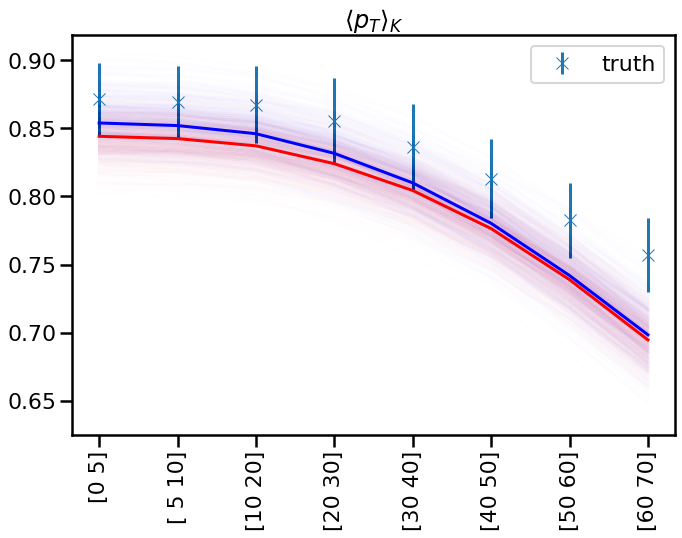

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
1.338116952543973
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
1.3609351885675496
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5.410

1.334187468912282
low
[ 1.93534323e+01 -9.98585403e-02  8.73272324e-01  1.42723785e-01
  9.67848960e-01  1.39086962e-01  2.91705282e-01  1.52145798e-01
  3.92795729e-01  1.55981325e+00  1.82180026e-02  1.55568673e-01
  4.45448458e-02 -6.66033986e-01  5.65226198e-01]
1.3108643944184688
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.87945334e+01 -1.96507825e-01  1.01208529e+00  3.68723885e-01
  1.20334414e+00  1.51563386e-01  1.49534862e-01  9.94588030e-02
  8.79378336e-01 -9.91159351e-03  4.46270104e-02  2.10144634e-01
  4.10338523e-02  6.91601216e-01  9.74425185e-01]
1.3589339566619236
low
[18.90249633 -0.27387715  0.

  0.05747196 -0.73346669  0.57852247]
1.3369438952686028
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.5294463  -0.32672027  0.98050297  1.5737402   1.31381638  0.14093989
  0.17161084  0.11969377 -0.723188   -0.31801838  0.04244208  0.14032151
  0.03965587 -0.6485125   0.41448546]
1.325075583359784
low
[ 1.92203813e+01 -9.08732982e-02  8.94372366e-01  1.68514162e+00
  1.16062303e+00  1.42433091e-01  2.61791081e-01  1.36646799e-01
  4.98980807e-01  1.46639753e+00  1.80385815e-02  1.52581503e-01
  5.00339441e-02 -3.03430839e-01  9.58748926e-01]
1.3079993211206495
low
[18.45166738 -0.09882525  0.969269    1.23503305  1

1.3312326509449408
low
[18.52229104 -0.05471058  0.95381372  1.51263973  1.12697678  0.13652183
  0.24735342  0.12171628  0.44451092  1.78760303  0.0213086   0.14996241
  0.04191695 -0.49857801  0.74283325]
1.327073405070764
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.48963869 -0.26633559  1.13224139  0.81628692  1.31821224  0.14077057
  0.17330726  0.12224159 -0.17650456 -0.1091438   0.03065338  0.23532212
  0.13423623 -0.10299432  0.96614356]
1.3834578420012325
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}

      dtype='object')
[ 2.95664038e+01 -1.48199674e-01  1.11238810e+00  1.25867503e+00
  1.42451660e+00  1.46046260e-01  2.13007502e-01  1.23283372e-01
  7.45393332e-01 -2.31355799e-01  2.90807334e-02  1.63381605e-01
  1.14111444e-01  6.13168607e-01  9.65641085e-01]
1.3246315895517875
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.34561426 -0.23426272  1.20366216  0.20564557  1.04666458  0.14034961
  0.25465375  0.12463615  0.48697141 -0.2314221   0.15726647  0.26450029
  0.09233618 -0.4036367   0.89898184]
1.330140868193019
low
[ 1.90999203e+01 -2.30625400e-01  9.23784814e-01  1.42886674e+00
  1.04275134e+00  1.40491

1.3170700709385605
low
[21.98704266 -0.22849789  1.07630924  0.44904839  1.31452958  0.13553193
  0.24264075  0.16566767  0.99817922  0.20541627  0.11092708  0.12024005
  0.02598034 -0.55432067  0.96762711]
1.369269041946859
low
[19.76139546 -0.09705711  0.9596007   1.31709995  1.24357393  0.14131035
  0.22331277  0.12930397  0.85233828  0.47711026  0.04505506  0.15618125
  0.02783465 -0.41031489  0.63072905]
1.3475918840827976
low
[21.19624419 -0.29394063  0.89948525  1.53913889  1.2156664   0.1372821
  0.2540472   0.04877038 -1.21415273  1.01493688  0.02280568  0.14844641
  0.04678595 -0.67752996  0.55263303]
1.3449966008271146
low
[19.90667427 -0.09829621  0.99260749  1.65772095  1.48183761  0.1363019
  0.19199424  0.0811758  -0.81712357  0.6121619   0.1054678   0.18901234
  0.02560737 -0.78817549  0.59782645]
1.3455601251648746
low
[18.2602156  -0.05507166  1.02932122  0.99331439  1.17095919  0.138798
  0.17192852  0.08377932 -0.85587771  0.98067354  0.03073431  0.21836746
  0.0562

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.12470587 -0.23956621  1.19697152  1.16667729  1.35152589  0.13943592
  0.14261278  0.10981754  0.32379809 -0.15214201  0.09862979  0.23110061
  0.08770012  0.19649711  0.65331794]
1.342850251174485
low
[19.33517548 -0.12273083  0.99902927  1.24456683  1.22564281  0.13740637
  0.28881678  0.10996885 -0.19185557  1.62960737  0.09913166  0.13120868
  0.04845223 -0.54138505  0.45518248]
1.316162605594415
low
[ 2.02193045e+01 -1.78690144e-01  9.31062311e-01  1.25243927e-01
  7.26705498e-01  1.41586760e-01  2.16957388e-01  2.50011419e-02
 -1.91615200e+00  1.45759583e+00  1.3851

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.85033356 -0.25050054  1.10645665  0.91767417  1.20582734  0.1447048
  0.17855549  0.08044437 -0.96698556 -0.07664513  0.04010483  0.17733725
  0.0388338   0.06262229  0.77968265]
1.3266337653909301
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

1.3368081808379546
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.81490787e+01 -5.87625130e-02  1.11649590e+00  1.36239730e+00
  1.27968630e+00  1.44881416e-01  1.88887381e-01  9.49439899e-02
  5.80340893e-01 -7.01301206e-02  2.63050656e-02  2.18993889e-01
  8.41295201e-02 -7.21398571e-01  9.91604137e-01]
1.3109339150732713
low
[ 1.91690882e+01 -1.43097340e-01  9.54900868e-01  4.47092190e-01
  1.07943118e+00  1.35359215e-01  2.63293849e-01  1.05481980e-01
  1.08537742e-02  1.77329661e+00  9.65753564e-02  1.51371834e-01
  3.55201153e-02 -7.36520993e-01  5.08583193e-01]
1.3070328312244468
high
Index(['$N$[$2.76$TeV]', '

1.3243023985839104
low
[ 1.88684398e+01 -2.85163498e-01  8.69654412e-01  1.60962939e+00
  1.13023942e+00  1.48171693e-01  1.79660537e-01  8.40147429e-02
  3.59544352e-02  1.95004455e+00  1.64958860e-02  1.96553361e-01
  2.67390710e-02  4.95601138e-01  7.81642002e-01]
1.3884736124588994
low
[ 2.01381974e+01  5.99749420e-03  9.52682948e-01  1.92291037e-01
  8.38889916e-01  1.39363672e-01  2.68851143e-01  9.37447586e-02
  1.75695283e-01  1.66643453e+00  6.12318674e-02  1.83097632e-01
  6.05192779e-02 -6.77855901e-01  6.39501248e-01]
1.3261130108053552
low
[20.34243411 -0.10478102  1.08941845  1.44115693  1.49096136  0.13595566
  0.13513322  0.06605244 -0.95697534  0.51054883  0.17106135  0.17461203
  0.0387166  -0.7904293   0.5043012 ]
1.3439537940730006
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1

  0.03483149 -0.5873248   0.42017318]
1.2884692408983691
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.09645318 -0.17353057  1.02541929  1.62841878  1.563015    0.14214222
  0.15540137  0.11620032  0.38477092 -0.19048564  0.031685    0.16463842
  0.05174911 -0.76611308  0.56647443]
1.3465093400757016
low
[18.46119827 -0.22089248  0.99187543  0.44354082  1.0689223   0.13527962
  0.14194192  0.06560847 -1.58560923  1.12820065  0.01879134  0.13524903
  0.02796525 -0.39442437  0.4143991 ]
1.3878007292234644
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$

1.3443623443637125
low
[18.56451872 -0.15422045  0.93662624  1.46085213  1.25504192  0.13672652
  0.23007238  0.03153536 -1.36848426  1.96804495  0.05305471  0.1287048
  0.03289413 -0.51615918  0.35276047]
1.3495077759302887
low
[20.88074942 -0.23745414  0.93071685  1.43443251  1.29876904  0.13610305
  0.24269425  0.12037627  0.29116582  1.04052471  0.03587535  0.13966959
  0.0271307  -0.56936176  0.99353932]
1.3381252211080985
low
[19.0527219  -0.1205352   1.03297628  0.23157332  1.17466468  0.13677106
  0.27915804  0.17373601  0.57410004  1.76078575  0.03278861  0.13700813
  0.0281883  -0.41772376  0.36960147]
1.34424020864778
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV

1.3333114862857405
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.78335097 -0.35660143  1.15805874  1.36786036  1.74651218  0.13674624
  0.25533075  0.19379203  0.89377452 -0.84964476  0.06108164  0.22801506
  0.10179257 -0.28982532  0.9198777 ]
1.3115740646073322
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

1.3213011961305423
low
[ 2.19401875e+01 -1.41095638e-01  9.58289633e-01  1.10109807e+00
  1.09827105e+00  1.39977748e-01  2.15896698e-01  3.73556905e-02
 -1.95835778e+00  8.15965976e-01  1.11338416e-02  1.41472614e-01
  5.01052771e-02 -4.71071044e-01  4.62431697e-01]
1.3832619807616293
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.32571661 -0.25151153  0.95525768  1.65489344  1.5301331   0.14303045
  0.14109107  0.15597775  0.0539219  -0.30240096  0.18302741  0.16097725
  0.11205327  0.32130034  0.91796146]
1.3136362066697564
low
[21.27196298 -0.1957169   1.02214195  0.33521516  1.15050001  0.13786106
  0.24304735  0

1.323782733680785
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.82495967e+01 -1.89502789e-01  1.02026278e+00  6.68360127e-01
  1.07919038e+00  1.43765758e-01  2.51046821e-01  1.53984824e-02
 -1.45544709e+00  2.14809176e-01  6.46986418e-02  2.12188046e-01
  4.02001905e-02 -4.24881779e-01  3.44870322e-01]
1.3559990012363796
low
[21.1661276  -0.08763659  0.97183592  1.38456633  1.33074197  0.13509209
  0.29456262  0.05069384 -1.13236421  1.30325452  0.16790008  0.13435953
  0.06576742 -0.69782283  0.54758961]
1.3198612926232471
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k

1.37158788523293
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.70888888 -0.34561474  1.08436644  0.11795675  1.30272821  0.13651405
  0.29595131  0.17129521  0.67060152 -0.52660894  0.23951303  0.2157557
  0.03985433 -0.74354362  0.97966563]
1.338930434317699
low
[20.58326448 -0.13325893  1.05487198  0.51687956  0.9123483   0.13628997
  0.28832432  0.17087978  0.66262665  1.99646321  0.06394986  0.21075688
  0.02649627 -0.5001755   0.78038025]
1.3785918327395816
low
[19.3201585  -0.05724791  1.06867442  0.209062    1.18691102  0.13675604
  0.19325017  0.1010687   0.1065904   0.58104799  0.18545368  0.19511162
  0.038

low
[21.64487798 -0.02951756  0.93865115  1.23356046  1.29289704  0.135521
  0.27740332  0.06776778 -0.46632697  1.13598855  0.05327699  0.21467829
  0.0557258  -0.78097747  0.97717559]
1.3456615940148997
low
[ 1.99133534e+01  8.52075058e-03  9.08327814e-01  9.56264425e-01
  1.19495474e+00  1.39416226e-01  2.51925431e-01  1.62582455e-01
  8.50555261e-01  1.45814906e+00  1.40373247e-02  2.20787352e-01
  3.18057951e-02 -4.59547090e-01  8.81862372e-01]
1.3594004270684596
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.51817036 -0.35276346  1.11162641  1.48368569  1.47271728  0.1441307
  0.23657566  0.13600188  0.76423953 

1.3436057572421665
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.97402924e+01 -2.13703630e-01  1.10230804e+00  1.56408170e+00
  1.55060660e+00  1.40942768e-01  2.43704639e-01  1.02962872e-01
  3.59951340e-02 -2.35810563e-01  1.76334559e-02  2.23802752e-01
  7.71558031e-02 -7.54874612e-01  8.75075424e-01]
1.3366564369686884
low
[ 1.89128913e+01 -4.31361458e-01  8.96648278e-01  6.93661538e-02
  1.24869260e+00  1.35396134e-01  2.15512967e-01  1.04766779e-01
 -9.33136471e-01  1.68023722e+00  1.41945646e-02  1.34611106e-01
  4.07437924e-02 -6.92073063e-01  4.59457882e-01]
1.3630344911850991
low
[21.36027801 -0.17616102  0

1.3554898664963657
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.81136148 -0.37752528  1.11869935  0.54091154  1.16875755  0.14519507
  0.1963427   0.10973452  0.25237917 -0.1810892   0.16167694  0.22092641
  0.04350291  0.77777938  0.99270198]
1.356969528227201
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

1.3416614048717415
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.35592775 -0.50780742  1.04298255  0.79768193  1.40734049  0.14726338
  0.26898465  0.16056179  0.91819548 -0.61270798  0.02969023  0.23845804
  0.08798791 -0.14192802  0.9203271 ]
1.291896038704334
low
[19.12561744  0.02078928  0.93899622  0.35434806  0.8204363   0.13627307
  0.25173122  0.09877856  0.41570722  1.84997197  0.0216733   0.17560762
  0.02914951 -0.67248948  0.85416603]
1.3100135234149812
low
[20.70499273 -0.12643768  0.95414045  1.3149979   1.23589164  0.14193645
  0.21410964  0.10370838  0.54182714  0.77612822  0.03246847  0.18317601
  0.

1.372493689577228
low
[20.62447875 -0.05261377  0.99125995  1.53195537  1.19540735  0.13906987
  0.25144356  0.10986417  0.12463785  0.83998663  0.07187101  0.18167594
  0.06621661 -0.68519975  0.77053814]
1.3341614230266847
low
[20.080146   -0.10000868  0.99813395  0.99160787  1.03561741  0.13779496
  0.27406386  0.11528461  0.2443033   0.80031573  0.07389243  0.2014392
  0.03608493 -0.67317964  0.56500639]
1.3246826438941233
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.95111088 -0.21175924  1.19427602  0.75019412  1.23140686  0.14299141
  0.2155326   0.08921246 -0.07913936 -0.11592237  0.24474731  0.28538082
  0.0

1.3299496240769548
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.3048787  -0.23812598  1.09633349  0.76551007  1.21420794  0.14413787
  0.22242938  0.10542598  0.37645461 -0.11449128  0.05047155  0.28056057
  0.06079797 -0.72804358  0.92533554]
1.3373712573312628
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.95141604e+01 -2.15690557e-01  1.16610724e+00  1.49470085e+00
  1.60211254e+00  1.41808851e-01  2.52427174e-01  1.28859674e-01
  5.46067484e-01 -2.74182199e-01  1.79495922e-02  1.34561832e-01
  1.04770143e-01  3.09069220e-01  9.72656126e-01]
1.3315950662336864
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
  

1.3161069013953974
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.6103129  -0.16884792  1.11206063  1.37945142  1.39077004  0.1371809
  0.14729321  0.10443798  0.27114539 -0.09147856  0.09061903  0.17015664
  0.06896091  0.08397624  0.94322349]
1.3439245440002823
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [G

      dtype='object')
[28.17816686 -0.15818778  1.08495072  1.44133749  1.61052354  0.14362396
  0.15205309  0.12821496  0.6249584  -0.13186585  0.04283243  0.15792588
  0.03940567  0.09823189  0.88106587]
1.3521827098849508
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.17651703 -0.20868714  1.13874307  1.07187674  1.2237211   0.14354259
  0.15933616  0.08919774  0.73793064 -0.08775796  0.03315862  0.21506555
  0.10170906 -0.63637923  0.30344829]
1.3395741009016682
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.25308295 -0.40679663  1.20601767  0.93298401  1.38902878  0.14477831
  0.19945594  0.1484714   0.69893263 -0.29259356  0.10343508  0.28427636
  0.04575769 -0.49921998  0.82834003]
1.326177023778339
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\z

  0.03698659 -0.45249421  0.84866161]
1.3476602705844882
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.21652929 -0.199722    1.23002571  0.70759914  0.99938516  0.1408263
  0.18722568  0.09527378  0.229802   -0.10977176  0.09540499  0.26664576
  0.12860417  0.07619589  0.93144172]
1.3277384400719165
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


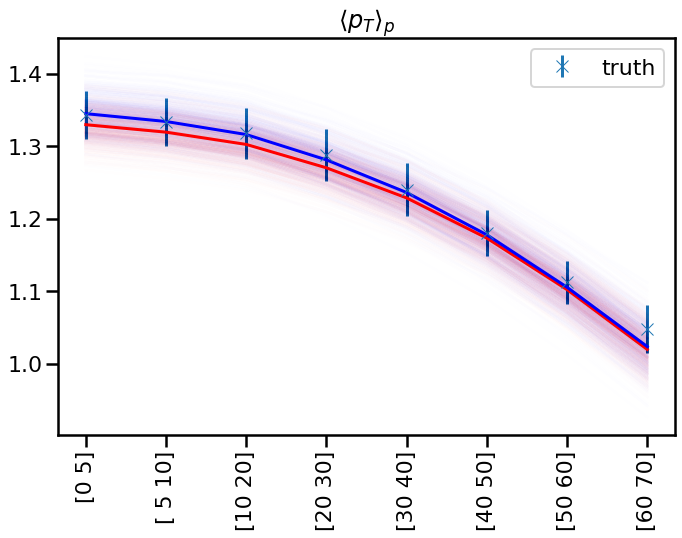

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
0.029246818922651668
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
0.02804115839705323
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  5

0.03152710668615505
low
[18.90249633 -0.27387715  0.88687071  0.56222969  1.06142784  0.13664856
  0.26192536  0.19089311  0.69785458  1.6717955   0.09084923  0.13865917
  0.03331049 -0.49110208  0.78132775]
0.030359899845141227
low
[ 1.85807444e+01 -9.58162549e-02  9.91995491e-01  2.92961301e-03
  1.01940188e+00  1.38568361e-01  1.99439369e-01  8.69859503e-02
 -1.07138185e+00  1.49438853e+00  4.52002187e-02  1.42555102e-01
  2.83251823e-02 -3.00249362e-01  4.13110884e-01]
0.029294581578437395
low
[19.87400674 -0.19348164  1.04810177  1.46941251  1.28182422  0.13821056
  0.15284825  0.10373046 -0.88366835  0.30599202  0.11142278  0.13551894
  0.02744809 -0.7553183   0.34853628]
0.029672035726610084
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]'

0.029582020716872246
low
[ 2.11313313e+01 -3.09302914e-01  9.29121810e-01  1.47951400e+00
  1.40602407e+00  1.38736157e-01  2.50646226e-01  9.76327365e-02
  1.45540144e-01  1.17992198e+00  1.96101288e-02  1.54370201e-01
  5.65388431e-02 -6.46716720e-01  6.49639076e-01]
0.0334073890555217
low
[19.43979765 -0.05007256  0.90255463  1.15000013  1.06537421  0.1379665
  0.24291536  0.1543016   0.75433767  0.9967463   0.04329311  0.22816706
  0.0319415  -0.76520901  0.81886423]
0.026267322629835624
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.80436725e+01 -3.17614431e-01  1.16802952e+00  1.46914286e+00
  1.50242426e+00  1.

0.027728550521904125
low
[ 2.15325855e+01 -6.94877139e-02  9.86150891e-01  7.99442880e-01
  1.22312042e+00  1.35937603e-01  2.25509840e-01  1.09911154e-01
 -2.14221303e-02  1.07360731e+00  5.10147002e-02  1.74569887e-01
  4.73859964e-02 -6.45792185e-01  9.89847889e-01]
0.0291731220254759
low
[19.77872523 -0.12914023  1.0334195   0.24057573  0.90667758  0.13533457
  0.23936884  0.02804464 -1.7159255   1.3182399   0.12691832  0.18557765
  0.03550461 -0.53648496  0.66984931]
0.0279527673958416
low
[19.21377362 -0.28006977  0.94365758  0.84783172  0.92477599  0.13587119
  0.22995306  0.02042572 -1.30000999  1.93252611  0.15053658  0.2437111
  0.03141093 -0.70233281  0.48471623]
0.031732334841169184
low
[18.85282538 -0.35147858  0.85622091  1.66202192  1.2245487   0.13676886
  0.23407565  0.06506331 -1.17402974  1.59643422  0.02857756  0.1287031
  0.03711229 -0.54847033  0.76989422]
0.030456055063046005
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\si

0.028736547973944464
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.61048148 -0.28600114  1.07972231  1.59512411  1.35775577  0.13846372
  0.18841404  0.06565243 -1.6122018  -0.10592005  0.11329088  0.17355736
  0.03054038 -0.50725713  0.3430409 ]
0.03191948998420846
low
[20.948522   -0.26080352  0.9348729   1.63768529  1.46063321  0.1354012
  0.21100619  0.10920002  0.19268318  1.20314269  0.04142129  0.16642805
  0.03566617 -0.63421416  0.94841671]
0.03143065576942968
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{k

0.029509820792435776
low
[18.93258178 -0.06287356  0.98581068  1.46612808  1.17342525  0.137729
  0.26260619  0.10178384  0.03758903  1.46646025  0.04979489  0.15145447
  0.04353333 -0.48049386  0.33605177]
0.02839616005645992
low
[19.65510204 -0.19011809  0.90907607  1.21113792  1.05568109  0.1381884
  0.28508979  0.17722434  0.7078359   1.60259176  0.03784631  0.20184734
  0.08833947 -0.77763574  0.79117391]
0.030477616906102328
low
[19.10908594 -0.17905359  1.0051333   1.6583113   1.04039854  0.14232287
  0.21200653  0.02089839 -1.3579226   1.47415585  0.02276137  0.1464861
  0.03471885  0.03337878  0.62841832]
0.029481378311307028
low
[18.26711221 -0.06644795  0.9697969   0.88797933  1.03403659  0.13751022
  0.23662954  0.05585885 -1.14767579  1.95505618  0.0432778   0.23932048
  0.0284962  -0.6150547   0.67866397]
0.028285458347426067
low
[20.02617394 -0.0947278   0.95711256  0.94187491  1.28563909  0.13540217
  0.24137205  0.1468505   0.84612739  1.31069434  0.16196118  0.2456688

0.027981416254290545
low
[21.71711214 -0.02829361  0.99074287  0.63125296  1.25278917  0.13540438
  0.29332011  0.07385645 -0.16966579  1.18890484  0.06861726  0.13837523
  0.06047849 -0.65070555  0.95608252]
0.030563327328084096
low
[19.64506645 -0.02606584  1.05711214  1.30001412  1.28356707  0.1373889
  0.14532716  0.053695   -1.32476296  1.19485443  0.06036181  0.160395
  0.05391823 -0.58517822  0.96912293]
0.029795781247801915
low
[20.4166307  -0.09122039  0.95719411  1.28132088  1.00205713  0.13848132
  0.28657903  0.07032111 -0.29093858  1.55768955  0.05097819  0.20479369
  0.06368872 -0.75917119  0.54133637]
0.028224509644491313
low
[19.34029244 -0.09562372  0.92285371  0.41667773  0.95492771  0.13748988
  0.27719114  0.12609091  0.08634644  1.93101906  0.06324568  0.17949334
  0.03413369 -0.32888079  0.34471946]
0.03011289195067096
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathr

0.0310358650714447
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.1108874  -0.25921294  1.0748275   1.23899365  1.77194743  0.13881993
  0.27771713  0.17393524  0.96494026 -0.81045428  0.10683232  0.25938344
  0.12948643  0.1936123   0.99834593]
0.032452870363618345
low
[19.65885356 -0.18078243  1.01761332  1.57323205  1.47920609  0.135085
  0.26723279  0.16649533  0.85119147  1.15222974  0.03558774  0.17390234
  0.03205492 -0.35206668  0.59106821]
0.03096212347926588
low
[19.30563162 -0.20692625  0.92325957  0.57689428  1.22473467  0.13558626
  0.2917767   0.13377794  0.38561121  0.78738314  0.03502065  0.14372003
  

0.027360121479322857
low
[ 1.96968612e+01 -3.69960069e-01  8.17710177e-01  1.48928783e+00
  1.41463328e+00  1.37151128e-01  2.70719788e-01  6.87240519e-02
 -1.15424100e+00  1.24711350e+00  1.93321811e-02  1.63814783e-01
  4.02079922e-02 -7.07078903e-01  5.06202854e-01]
0.030055720135665192
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.16723368 -0.23923661  1.10236401  1.69086017  1.46135609  0.13673949
  0.13808384  0.12540782  0.83704046 -0.13074738  0.14281229  0.15570323
  0.04928554 -0.06902971  0.88864301]
0.02952023804988002
low
[ 2.05771069e+01 -2.63715166e-01  1.04761187e+00  1.63630512e+00
  1.23330080e+00  

0.028957572425527826
low
[21.02310832  0.03182144  1.03923449  0.07127698  1.15427448  0.13885982
  0.27566396  0.05353255 -0.20510519  1.75334313  0.03456593  0.25192631
  0.02579092 -0.5635475   0.97426552]
0.03188414886782828
low
[19.33066772 -0.09603957  0.94354075  0.23300844  0.98895189  0.13884143
  0.26279145  0.17410152  0.92711565  1.27827634  0.05139565  0.17068505
  0.05166361 -0.5425601   0.72178518]
0.029692632104610508
low
[ 1.92988332e+01 -4.01560717e-02  9.79170696e-01  1.05697757e+00
  1.24419059e+00  1.35599551e-01  2.82135198e-01  1.84412768e-01
  7.94419147e-01  1.27186605e+00  1.47199486e-02  1.54011612e-01
  3.78209488e-02  1.49714985e-01  7.92686880e-01]
0.028994238157238235
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]'

0.030192473020081836
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.97453920e+01 -2.01482035e-01  1.25097845e+00  1.24702301e+00
  1.42058488e+00  1.43654709e-01  2.07922588e-01  1.19164860e-01
  9.75981959e-01 -2.46757909e-01  2.70019151e-02  2.22621135e-01
  3.59021109e-02 -1.14051460e-01  9.03530618e-01]
0.028949709132399044
low
[18.93561099 -0.12308049  0.97587623  0.80835124  1.24069365  0.13511749
  0.22269732  0.07212253 -0.83078003  1.19627571  0.06344534  0.12794529
  0.03086605 -0.32265406  0.50871298]
0.029518716626062782
low
[ 2.05988102e+01 -2.74214416e-01  9.65154334e-01  1.29689863e+00
  1.21209559e+00 

0.029569655329107866
low
[ 1.98410474e+01 -4.50226980e-02  1.02679509e+00  5.77357920e-01
  1.08284908e+00  1.40632024e-01  2.84614575e-01  1.22380028e-01
  7.02655984e-01  8.55793221e-01  1.75967855e-02  2.64655276e-01
  3.29536390e-02 -6.08760570e-01  5.36827968e-01]
0.029971900416781445
low
[18.54661008 -0.11288591  0.94121156  1.38821648  1.31634242  0.13944799
  0.2330575   0.082644    0.06515788  1.83073234  0.0529803   0.23939253
  0.03904772 -0.65388802  0.52811991]
0.03346213324312674
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.96279497e+01 -4.13035304e-01  1.14248768e+00  1.31443356e+00
  1.41228986e+00  

low
[21.12125064 -0.15956034  1.01885896  0.77428246  1.14516949  0.14064153
  0.28755668  0.12050065  0.24194904  0.8351817   0.03231476  0.21132877
  0.08227127 -0.62384393  0.46181938]
0.03081941827300166
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.96080007e+01 -1.87571551e-01  1.17524646e+00  1.61618728e+00
  1.35390993e+00  1.45137654e-01  2.03788830e-01  9.95472258e-02
 -1.03682375e-01 -1.51455116e-01  2.69519809e-02  1.69733423e-01
  1.37832981e-01  7.90757830e-01  7.56835917e-01]
0.030467095068048483
low
[19.7125357  -0.44704909  0.82909241  1.39635682  1.17627253  0.13501556
  0.2735079   0.17168471  0.434

0.030085145758476983
low
[ 2.00493305e+01 -1.60216341e-01  9.88091694e-01  3.58889222e-01
  1.00828664e+00  1.37924859e-01  2.77636615e-01  7.70075635e-02
  5.68022463e-02  1.39562983e+00  1.51938861e-02  1.43707436e-01
  5.93304444e-02 -4.25911933e-01  4.87778930e-01]
0.031022155533136805
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.62387628 -0.28828431  1.04718726  1.67519021  1.45944222  0.13651825
  0.29121198  0.08684901 -0.23573106 -0.10793542  0.13198336  0.14721836
  0.03533774 -0.57854759  0.49453941]
0.03132031936436113
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\s

0.02954378836715144
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.38440695 -0.34847991  1.25013802  0.61453756  1.5603531   0.13779761
  0.26326757  0.1771937   0.72520569 -0.54248522  0.06981448  0.13486918
  0.0809585  -0.27404731  0.93480296]
0.03097154943819571
low
[18.43868844 -0.11372439  0.885765    0.93794304  0.95995773  0.13775531
  0.28578444  0.14346184  0.54529355  1.96265429  0.0324684   0.12561403
  0.04017254 -0.38451151  0.38660536]
0.029739500801333647
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{

0.0304015522927751
low
[20.92296162 -0.13824937  0.96747785  1.28092017  1.24277153  0.13763804
  0.28999263  0.04383099 -0.25682791  1.49836641  0.02854258  0.14912671
  0.03991559 -0.47385048  0.40995591]
0.030917530018781673
low
[19.30093174 -0.14059079  0.94074695  0.28688898  0.9989859   0.13642348
  0.29456031  0.18602976  0.56992592  1.76050325  0.04941631  0.16867609
  0.03225118 -0.72117867  0.79016123]
0.029273116645456745
low
[ 1.86098781e+01 -2.84967978e-01  9.05426107e-01  1.46807333e+00
  1.21762473e+00  1.38399946e-01  1.81369129e-01  7.77521750e-02
 -1.29071473e+00  1.24326566e+00  1.32215749e-02  1.26594807e-01
  6.06286402e-02 -4.02959793e-01  4.80362396e-01]
0.030649311212059646
low
[21.64487798 -0.02951756  0.93865115  1.23356046  1.29289704  0.135521
  0.27740332  0.06776778 -0.46632697  1.13598855  0.05327699  0.21467829
  0.0557258  -0.78097747  0.97717559]
0.029242285219487858
low
[ 1.99133534e+01  8.52075058e-03  9.08327814e-01  9.56264425e-01
  1.19495474e+00 

low
[19.35299307 -0.21550302  1.03037842  1.61949498  1.3254366   0.13573299
  0.18081107  0.07782213 -1.07255169  0.69317211  0.03940917  0.14903362
  0.02956523 -0.7911729   0.41276441]
0.029519588879536332
low
[21.45937404 -0.10135634  1.04345799  0.27817066  1.1281206   0.13774154
  0.23786903  0.03113746 -1.34663862  0.92942729  0.06209719  0.14620879
  0.04062918 -0.63655325  0.50577414]
0.02968183658830292
low
[21.0143327  -0.18623845  1.12557785  1.58318344  1.2363015   0.14196493
  0.19619176  0.12287021  0.24036895  0.19307018  0.07462614  0.15985036
  0.03353367 -0.36094736  0.41958372]
0.028732235572158815
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lamb

0.02866167728612892
low
[ 1.96399963e+01 -1.76494912e-01  9.82912599e-01  1.31211218e+00
  1.07460008e+00  1.41280641e-01  1.76778783e-01  7.67867695e-02
 -1.29350007e+00  5.40651079e-01  1.56824453e-02  1.45371531e-01
  2.52923748e-02 -7.88998662e-01  5.55993089e-01]
0.028012931734988734
low
[18.01087959 -0.13514726  0.99013371  0.20368324  1.22184916  0.13542945
  0.14284442  0.07334409 -0.6988289   1.04670233  0.14348052  0.13420156
  0.02572174 -0.76459824  0.34832288]
0.02924046550283226
low
[18.62220913 -0.1378201   0.92524179  0.23398275  0.96552954  0.1367879
  0.28256014  0.15041523  0.14282819  1.59996745  0.02420691  0.1422601
  0.0425843  -0.36919405  0.3819548 ]
0.02896173405801765
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$

0.025204462480729654
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.83484264 -0.24398608  1.0757171   0.03021861  1.21209973  0.13576119
  0.29622356  0.05995444 -0.73101719 -0.04968635  0.24075951  0.1819123
  0.05225137 -0.72054815  0.51917599]
0.030462752911979373
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}

0.02639289174606066
low
[ 1.92491903e+01 -4.84370268e-03  8.89013348e-01  9.05480672e-01
  1.22856803e+00  1.37488639e-01  2.42243296e-01  1.08451859e-01
  2.91568612e-02  1.99417740e+00  4.62605606e-02  1.47575788e-01
  4.06464430e-02 -3.20496787e-01  8.68276376e-01]
0.03161237978650166
low
[20.62447875 -0.05261377  0.99125995  1.53195537  1.19540735  0.13906987
  0.25144356  0.10986417  0.12463785  0.83998663  0.07187101  0.18167594
  0.06621661 -0.68519975  0.77053814]
0.02862629592667045
low
[20.080146   -0.10000868  0.99813395  0.99160787  1.03561741  0.13779496
  0.27406386  0.11528461  0.2443033   0.80031573  0.07389243  0.2014392
  0.03608493 -0.67317964  0.56500639]
0.027477996841859347
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '

0.030143093767135188
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.46567025 -0.33051877  1.13532139  1.20970082  1.20282428  0.14279976
  0.13466151  0.13467627  0.95596728 -0.10873133  0.03284822  0.19689288
  0.12813759 -0.08294538  0.89434009]
0.027142999229383114
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta

0.029795573633656945
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.53144762 -0.28494501  1.02844866  1.67116093  1.23289746  0.13939165
  0.23157313  0.05870644 -1.43350188  0.08936613  0.18615238  0.24535751
  0.05313434 -0.78519036  0.69522923]
0.031177536747736104
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta

0.030081538434155355
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.41475705 -0.31711377  1.20835645  1.69719042  1.441186    0.14212698
  0.20673311  0.1357523   0.57629897 -0.25315358  0.07266412  0.17045521
  0.10539796 -0.24804099  0.97607112]
0.028526532760270538
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta

0.02783389929040913
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90848012e+01 -2.21959982e-01  1.07300154e+00  1.37402054e+00
  1.42044136e+00  1.42307735e-01  2.93787475e-01  8.57702328e-02
  4.72116974e-01 -6.97871709e-02  7.59598623e-02  2.75467971e-01
  2.63254472e-02 -6.09988478e-01  4.70317210e-01]
0.03422322224816865
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(

0.029672240183413717
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.48281437 -0.38117646  1.0822019   1.03307283  1.44148992  0.1352811
  0.18413686  0.11320307 -1.46300595 -0.22755373  0.06224381  0.15180887
  0.08907525 -0.27799364  0.58197571]
0.031449991130037415
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}

0.02743860759956806
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.51533876 -0.24855512  1.1057638   0.43069041  1.23816866  0.14014836
  0.14718107  0.11046373 -1.8303     -0.11693203  0.0546865   0.12960973
  0.05544366 -0.36059542  0.89816913]
0.032933099214652393
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


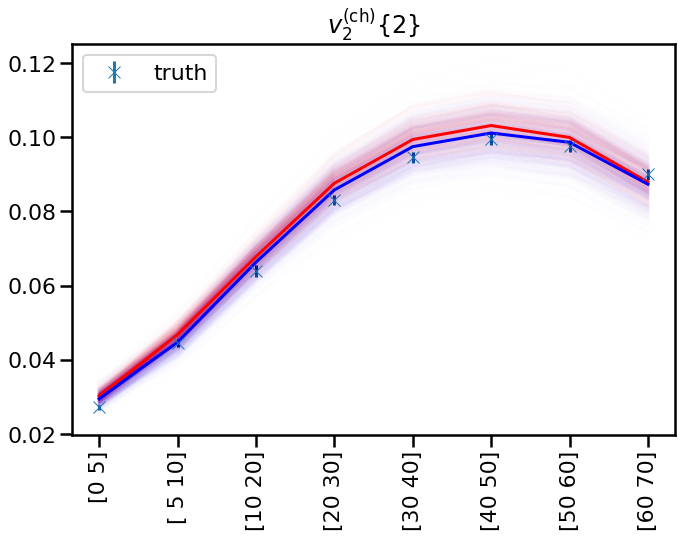

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
0.019191733116059886
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
0.018476940585291923
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  

0.019159000198988016
low
[ 1.85807444e+01 -9.58162549e-02  9.91995491e-01  2.92961301e-03
  1.01940188e+00  1.38568361e-01  1.99439369e-01  8.69859503e-02
 -1.07138185e+00  1.49438853e+00  4.52002187e-02  1.42555102e-01
  2.83251823e-02 -3.00249362e-01  4.13110884e-01]
0.019202635466857257
low
[19.87400674 -0.19348164  1.04810177  1.46941251  1.28182422  0.13821056
  0.15284825  0.10373046 -0.88366835  0.30599202  0.11142278  0.13551894
  0.02744809 -0.7553183   0.34853628]
0.01935409509266187
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.83788778e+01 -3.27222794e-01  1.10737478e+00  1.23907892e+00
  1.24667479e+00  

0.02243527289231654
low
[19.43979765 -0.05007256  0.90255463  1.15000013  1.06537421  0.1379665
  0.24291536  0.1543016   0.75433767  0.9967463   0.04329311  0.22816706
  0.0319415  -0.76520901  0.81886423]
0.01754314244530836
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.80436725e+01 -3.17614431e-01  1.16802952e+00  1.46914286e+00
  1.50242426e+00  1.41956034e-01  1.85898029e-01  1.33787918e-01
  9.17785170e-01 -2.47706722e-01  2.42450332e-02  1.51162710e-01
  1.45054640e-01  1.30904672e-01  7.87163251e-01]
0.020159122541189303
low
[18.98604981 -0.04268528  1.02855928  1.56254178  1.20368391  0.13664762
  0.27221217

0.019218158362290794
low
[19.77872523 -0.12914023  1.0334195   0.24057573  0.90667758  0.13533457
  0.23936884  0.02804464 -1.7159255   1.3182399   0.12691832  0.18557765
  0.03550461 -0.53648496  0.66984931]
0.0178479461343097
low
[19.21377362 -0.28006977  0.94365758  0.84783172  0.92477599  0.13587119
  0.22995306  0.02042572 -1.30000999  1.93252611  0.15053658  0.2437111
  0.03141093 -0.70233281  0.48471623]
0.021096536416587534
low
[18.85282538 -0.35147858  0.85622091  1.66202192  1.2245487   0.13676886
  0.23407565  0.06506331 -1.17402974  1.59643422  0.02857756  0.1287031
  0.03711229 -0.54847033  0.76989422]
0.01853034858550863
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.61048148 -0.28600114  1.07972231  1.59512411  1.35775577  0.13846372
  0.18841404  0.06565243 -1.6122018  -0.10592005  0.11329088  0.17355736
  0.03054038 -0.50725713  0.3430409 ]
0.021900978262642427
low
[20.948522   -0.26080352  0.9348729   1.63768529  1.46063321  0.1354012
  0.21100619  0.10920002  0.19268318  1.20314269  0.04142129  0.16642805
  0.03566617 -0.63421416  0.94841671]
0.02077014453659406
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\e

0.019569293913488696
low
[18.93258178 -0.06287356  0.98581068  1.46612808  1.17342525  0.137729
  0.26260619  0.10178384  0.03758903  1.46646025  0.04979489  0.15145447
  0.04353333 -0.48049386  0.33605177]
0.019525176478410348
low
[19.65510204 -0.19011809  0.90907607  1.21113792  1.05568109  0.1381884
  0.28508979  0.17722434  0.7078359   1.60259176  0.03784631  0.20184734
  0.08833947 -0.77763574  0.79117391]
0.01973491629849513
low
[19.10908594 -0.17905359  1.0051333   1.6583113   1.04039854  0.14232287
  0.21200653  0.02089839 -1.3579226   1.47415585  0.02276137  0.1464861
  0.03471885  0.03337878  0.62841832]
0.019349194623674355
low
[18.26711221 -0.06644795  0.9697969   0.88797933  1.03403659  0.13751022
  0.23662954  0.05585885 -1.14767579  1.95505618  0.0432778   0.23932048
  0.0284962  -0.6150547   0.67866397]
0.017990795268699098
low
[20.02617394 -0.0947278   0.95711256  0.94187491  1.28563909  0.13540217
  0.24137205  0.1468505   0.84612739  1.31069434  0.16196118  0.2456688

0.020112068128710067
low
[ 2.03494352e+01 -2.50627402e-01  9.40818919e-01  1.28564833e+00
  1.43000411e+00  1.35184591e-01  2.59968274e-01  1.39988692e-01
  1.54915149e-01  8.14286749e-01  1.15362756e-02  1.20037465e-01
  3.84379845e-02 -4.92340882e-01  5.01794021e-01]
0.02014648687728154
low
[21.30745655 -0.17355857  1.00567875  0.75192257  0.96054815  0.13774111
  0.1997653   0.10449837 -0.09761704  0.39875592  0.05047206  0.13934308
  0.03307118 -0.74975663  0.89589636]
0.018021253056087243
low
[ 1.87409248e+01 -1.99168615e-01  8.97999275e-01  1.29232095e+00
  9.46171195e-01  1.44457164e-01  1.75302269e-01  8.46485444e-02
 -1.67730581e+00  1.55497150e+00  1.31042235e-02  1.21745048e-01
  5.98520590e-02 -2.23172230e-01  7.77342934e-01]
0.017262547924263502
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV

0.018160318125829456
low
[20.2551407  -0.06543799  1.03583534  1.54684828  1.20123184  0.13865225
  0.23453899  0.05323304 -0.60780807  1.13311338  0.02107861  0.17205354
  0.06024207 -0.5992686   0.4918682 ]
0.018569323326874512
low
[20.82657908 -0.3366874   0.97115022  0.45805481  1.10364599  0.13729208
  0.19501287  0.1514901   0.73532803  0.61830198  0.10548695  0.14194206
  0.02706329 -0.64262417  0.95584115]
0.018074083463358863
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90522680e+01 -3.88945604e-01  9.11219916e-01  7.73947520e-01
  1.21005180e+00  1.39053407e-01  2.73756575e-01  1.51030365e-02
 -1.33804499e

0.019909134528807607
low
[20.29498576 -0.08319241  0.9680916   0.63850948  1.24202083  0.13765461
  0.27124387  0.08605821 -0.10420299  0.80080056  0.03926462  0.16186979
  0.02707413 -0.65430211  0.63468295]
0.02016963277901848
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.97753975 -0.20145276  1.10907223  0.4238299   1.2623471   0.13829885
  0.19534336  0.12732841  0.68696258 -0.24983548  0.2340697   0.24470726
  0.05458895 -0.78277863  0.99543018]
0.020887160891431136
low
[ 1.84770243e+01  4.09934643e-03  9.56193256e-01  1.08095176e+00
  1.11716835e+00  1.35232170e-01  2.89912570e-01  9.08691166e-02
 -2.89979221e-

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.05460111 -0.08303335  1.19982345  1.24527844  1.39784528  0.14599867
  0.15482114  0.08735867  0.9644579  -0.03063564  0.04959633  0.29867314
  0.06673182  0.4783947   0.87364033]
0.020711904798713716
low
[18.39952657 -0.07910628  0.99698545  0.72951369  0.95395477  0.14167515
  0.29719651  0.07463034  0.05201552  1.93768133  0.04041741  0.20118934
  0.07172925 -0.62511997  0.3413922 ]
0.02120583096120974
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\

low
[21.35352609 -0.17402915  0.96441303  1.6311389   1.28307733  0.13713264
  0.28764617  0.03824815 -0.78140881  1.21930194  0.07497991  0.14854281
  0.05693345 -0.60302637  0.58050661]
0.018724985290469273
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.92855236e+01 -2.53178554e-01  1.23266404e+00  8.44377602e-01
  1.42528925e+00  1.39016168e-01  2.81345383e-01  1.40611616e-01
  6.06342914e-01 -3.22692210e-01  1.22066822e-01  2.58008481e-01
  4.91352215e-02  1.36187737e-02  9.97319366e-01]
0.021347357998010283
low
[19.61370895 -0.17411266  1.0088941   1.01693081  1.0739533   0.14164614
  0.15951782  0.09779216 -1.46

0.01832861993423399
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.35130632 -0.42042494  1.09667469  0.93824487  1.31628713  0.14267691
  0.27424055  0.16166429  0.60208802 -0.7630776   0.09965184  0.23360233
  0.04555162  0.77143732  0.43542684]
0.02030630685259835
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$

0.0186535377467981
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.70626351 -0.31079059  1.20387609  1.49544134  1.49041867  0.13966373
  0.17976989  0.11453532  0.80135462 -0.14307531  0.09370131  0.24015232
  0.10790981 -0.75977559  0.95726181]
0.020530100351532517
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$

0.02025398686825793
low
[18.47302993 -0.05922434  0.97566611  1.2926432   1.1867924   0.13736056
  0.29426847  0.11605463  0.03027346  1.43648609  0.05445007  0.22335929
  0.04627095 -0.71512771  0.38434154]
0.018834200374930336
low
[18.16908549 -0.0819677   0.97259228  0.51645334  0.57878515  0.14149872
  0.22560287  0.14339558  0.80693057  1.95623007  0.02639516  0.23950699
  0.0401041  -0.5795148   0.7880606 ]
0.01732536745272878
low
[18.80709497 -0.15596075  0.96981884  1.47331869  1.21304476  0.14015933
  0.25747859  0.11609603  0.44096788  1.31283804  0.03006582  0.16068806
  0.04385233 -0.32265232  0.35986491]
0.02101190494224266
low
[20.64247915 -0.24689063  1.02101695  0.86302099  1.23384377  0.13805151
  0.22994974  0.10858057  0.24107129  0.56279693  0.0213351   0.14772058
  0.03315984 -0.7946572   0.45918885]
0.02031294967540781
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathr

0.019403958087442847
low
[ 1.91765563e+01 -5.30812771e-03  8.46058420e-01  1.20792308e+00
  1.01350652e+00  1.40356604e-01  2.81276553e-01  1.51604047e-01
  4.06649420e-01  1.87098321e+00  1.60815677e-02  1.85555747e-01
  4.64525399e-02 -7.58209836e-01  6.96487269e-01]
0.018706590422435058
low
[19.19131658 -0.15608295  0.88718921  0.18912188  0.91991761  0.13594617
  0.2356074   0.11830221  0.03868461  1.51676297  0.02947005  0.19044076
  0.02932548 -0.62078911  0.45314688]
0.019152430607291913
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.70888888 -0.34561474  1.08436644  0.11795675  1.30272821  0.13651405
  0.29595

low
[21.64487798 -0.02951756  0.93865115  1.23356046  1.29289704  0.135521
  0.27740332  0.06776778 -0.46632697  1.13598855  0.05327699  0.21467829
  0.0557258  -0.78097747  0.97717559]
0.018949015113953697
low
[ 1.99133534e+01  8.52075058e-03  9.08327814e-01  9.56264425e-01
  1.19495474e+00  1.39416226e-01  2.51925431e-01  1.62582455e-01
  8.50555261e-01  1.45814906e+00  1.40373247e-02  2.20787352e-01
  3.18057951e-02 -4.59547090e-01  8.81862372e-01]
0.019582442895290753
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.51817036 -0.35276346  1.11162641  1.48368569  1.47271728  0.1441307
  0.23657566  0.13600188  0.76423

[ 1.89128913e+01 -4.31361458e-01  8.96648278e-01  6.93661538e-02
  1.24869260e+00  1.35396134e-01  2.15512967e-01  1.04766779e-01
 -9.33136471e-01  1.68023722e+00  1.41945646e-02  1.34611106e-01
  4.07437924e-02 -6.92073063e-01  4.59457882e-01]
0.020372962618216136
low
[21.36027801 -0.17616102  0.9416732   1.47902545  1.36692508  0.13990798
  0.19801363  0.11324888  0.94678397  0.87308057  0.03525774  0.13070066
  0.03888413 -0.78568664  0.98419373]
0.02085896073566562
low
[20.80182282 -0.08956263  0.94170094  1.46244187  1.35347455  0.13830064
  0.26992471  0.05336432 -0.02850377  1.24994796  0.02481134  0.14764733
  0.02912068  0.29638023  0.96405866]
0.0222632593164065
low
[19.57565003 -0.0707346   1.09099877  1.69057755  1.30099043  0.13760303
  0.15936789  0.08902776 -0.26955661  0.5320491   0.06734055  0.15865709
  0.03129568 -0.78368241  0.31902986]
0.017977052724023442
low
[ 2.06090396e+01 -1.65892619e-01  9.96468562e-01  1.10373503e-01
  4.06930839e-01  1.42670834e-01  2.91569

0.01881574031859569
low
[20.68813522 -0.22953112  1.07157523  1.02887091  1.26321942  0.13963218
  0.25765162  0.12936983  0.47191207  0.44934476  0.07684539  0.15648094
  0.02515469 -0.62448467  0.43130555]
0.020910089856442875
low
[21.7687439  -0.18755963  0.97259392  1.52327641  1.16792844  0.13951524
  0.29655949  0.17533347  0.95712276  0.8274587   0.04827671  0.22655814
  0.06075555 -0.77738488  0.99986583]
0.02002783266821545
low
[18.13104153  0.07342725  1.04699194  1.41677552  1.25011956  0.13591441
  0.16233561  0.04732819 -1.94817498  0.90827908  0.02981246  0.18437692
  0.04343383 -0.70298741  0.55191229]
0.01955469873771991
low
[ 2.11101124e+01 -1.07285972e-01  9.97101995e-01  6.39915818e-01
  1.12141522e+00  1.38988049e-01  2.43736730e-01  8.40270785e-02
  1.80545168e-01  9.89055151e-01  1.08934448e-02  1.34256532e-01
  4.39172489e-02 -4.73406849e-01  7.77726735e-01]
0.020739687467967616
low
[18.18442908 -0.15554331  1.06202058  1.55849985  1.19168106  0.13783574
  0.2009

0.020843876259604925
low
[19.16779127 -0.02418836  1.02349353  0.94908721  1.09852303  0.13590471
  0.24012038  0.03097259 -1.14711757  1.61343973  0.05536046  0.13857307
  0.02683146 -0.36934418  0.43329754]
0.018826328601837583
low
[21.02301361 -0.12390596  1.00790852  0.91568814  0.97893891  0.14157651
  0.25516445  0.08407732 -0.07800395  0.58175081  0.04122363  0.16174763
  0.04965576 -0.48320528  0.474501  ]
0.019277036249358358
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.94696585e+01 -2.10630685e-01  1.05783455e+00  1.63175541e+00
  1.32408373e+00  1.46252218e-01  2.55492417e-01  5.09637153e-02
 -9.79876481e

0.019240754702063434
low
[20.080146   -0.10000868  0.99813395  0.99160787  1.03561741  0.13779496
  0.27406386  0.11528461  0.2443033   0.80031573  0.07389243  0.2014392
  0.03608493 -0.67317964  0.56500639]
0.018919511509667825
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.95111088 -0.21175924  1.19427602  0.75019412  1.23140686  0.14299141
  0.2155326   0.08921246 -0.07913936 -0.11592237  0.24474731  0.28538082
  0.03790715 -0.64443452  0.44461215]
0.022178415024290694
low
[ 1.88700664e+01 -7.28933778e-02  9.67555791e-01  1.35506367e-02
  5.58682503e-01  1.36755293e-01  2.19145151e-01  8.00390201e-02
  2.22356258e-

  0.03987222 -0.47863463  0.9794374 ]
0.019483374715037666
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.3048787  -0.23812598  1.09633349  0.76551007  1.21420794  0.14413787
  0.22242938  0.10542598  0.37645461 -0.11449128  0.05047155  0.28056057
  0.06079797 -0.72804358  0.92533554]
0.02115940421449485
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
   

0.02008475586060045
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.30750126 -0.15380185  1.10708593  0.56226892  0.97038671  0.14471961
  0.20048347  0.09167833 -0.0944058  -0.10955355  0.05725114  0.29723672
  0.03498144 -0.74416561  0.98419709]
0.01876699712512818
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.41475705 -0.31711377  1.20835645  1.69719042  1.441186    0.14212698
  0.20673311  0.1357523   0.57629897 -0.25315358  0.07266412  0.17045521
  0.10539796 -0.24804099  0.97607112]
0.018979702147472473
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_

0.024665036687736043
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90896450e+01 -3.29370318e-01  1.16425876e+00  1.68893188e+00
  1.33310178e+00  1.41276190e-01  2.72999204e-01  1.30510307e-01
  3.16795811e-01 -3.65328201e-01  9.92495341e-02  2.36218857e-01
  3.07754834e-02 -4.71852473e-03  5.67511750e-01]
0.019007314189631863
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '

0.020123391732991307
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.42701177 -0.2204115   1.21229582  0.98734334  1.28179074  0.13676662
  0.22557756  0.09230736 -0.03675292 -0.08604236  0.07051905  0.12848887
  0.11926212  0.75050677  0.91951532]
0.021085507174824394
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta

0.018335458706287146
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.51533876 -0.24855512  1.1057638   0.43069041  1.23816866  0.14014836
  0.14718107  0.11046373 -1.8303     -0.11693203  0.0546865   0.12960973
  0.05544366 -0.36059542  0.89816913]
0.021109774908530114
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


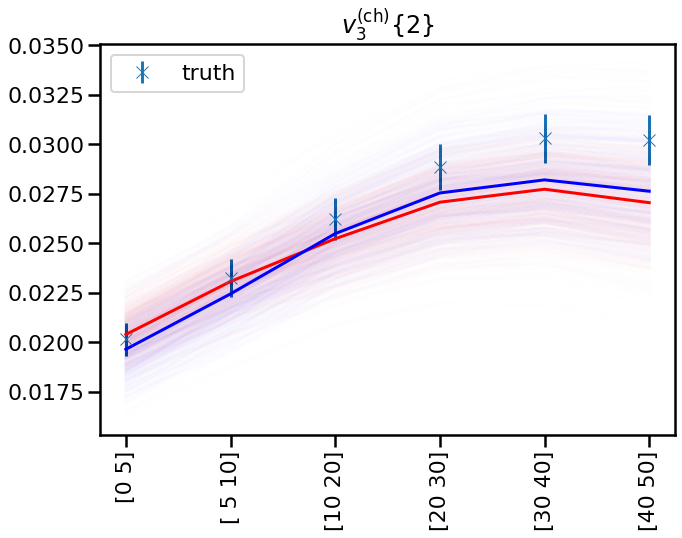

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.91879377 -0.32514016  1.04389251  0.07214598  1.06427942  0.14148233
  0.25214286  0.07314618 -1.01504777 -0.07680384  0.13047184  0.19686798
  0.03243429 -0.2037161   0.54050341]
0.009231501782581501
low
[18.1193513  -0.1027743   1.03740207  1.11365716  1.14232342  0.13667611
  0.2239047   0.07639868 -0.92439025  1.5182547   0.0497989   0.13013291
  0.03955712 -0.19628554  0.3820453 ]
0.009454576985110248
low
[ 2.11515361e+01 -7.27442236e-02  9.57843522e-01  3.31333853e-01
  8.71058471e-01  1.36889536e-01  2.39839389e-01  1.70058749e-02
 -1.40490195e+00  1.11879353e+00  

  4.10338523e-02  6.91601216e-01  9.74425185e-01]
0.011212027144004414
low
[18.90249633 -0.27387715  0.88687071  0.56222969  1.06142784  0.13664856
  0.26192536  0.19089311  0.69785458  1.6717955   0.09084923  0.13865917
  0.03331049 -0.49110208  0.78132775]
0.00933879118616324
low
[ 1.85807444e+01 -9.58162549e-02  9.91995491e-01  2.92961301e-03
  1.01940188e+00  1.38568361e-01  1.99439369e-01  8.69859503e-02
 -1.07138185e+00  1.49438853e+00  4.52002187e-02  1.42555102e-01
  2.83251823e-02 -3.00249362e-01  4.13110884e-01]
0.009741179235998734
low
[19.87400674 -0.19348164  1.04810177  1.46941251  1.28182422  0.13821056
  0.15284825  0.10373046 -0.88366835  0.30599202  0.11142278  0.13551894
  0.02744809 -0.7553183   0.34853628]
0.009921634523233516
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]'

[18.45166738 -0.09882525  0.969269    1.23503305  1.13731173  0.13941518
  0.23562402  0.12126848  0.34776864  1.59902601  0.0224319   0.18267942
  0.02621859 -0.51205086  0.3598075 ]
0.009986191791474681
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.93933557e+01 -1.71854439e-01  1.18410680e+00  1.09983593e+00
  1.23612529e+00  1.43653969e-01  1.79018851e-01  7.18955559e-02
  6.89877793e-01 -7.77114295e-02  2.68036181e-02  2.81779173e-01
  7.21444861e-02 -3.58003701e-01  6.58273967e-01]
0.010756098885716495
low
[ 2.11313313e+01 -3.09302914e-01  9.29121810e-01  1.47951400e+00
  1.40602407e+00  1.38736157e-01  2.506462

0.009761629532495543
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.82320805e+01 -2.22677856e-01  9.97006534e-01  1.31900525e+00
  1.14047538e+00  1.40325077e-01  2.26528046e-01  5.03565907e-02
 -1.06884841e+00  7.04520036e-03  2.30499824e-01  1.60991002e-01
  2.72886622e-02  6.58734651e-01  5.64427871e-01]
0.011087654272359825
low
[18.30207038  0.01838933  1.07353761  1.50519527  1.18223331  0.13780694
  0.25158271  0.09614559  0.20867561  1.55243835  0.09213678  0.19949736
  0.02688102 -0.63009633  0.34177105]
0.010593460936134967
low
[ 2.15325855e+01 -6.94877139e-02  9.86150891e-01  7.99442880e-01
  1.22312042e+00 

0.010037982322005343
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.41541408 -0.21110517  1.11487636  1.31906841  1.33686583  0.14104725
  0.19869328  0.09760454  0.36959359 -0.11088031  0.12941449  0.14646323
  0.0432809  -0.64766644  0.61725385]
0.011096473009564897
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta

0.009134303433421354
low
[19.05336505 -0.18255593  1.02736173  0.45011095  1.23737911  0.13961427
  0.14858164  0.10996852  0.96158476  0.73279793  0.04717539  0.16449521
  0.04104257 -0.75988933  0.38125861]
0.008800788885567824
low
[19.05281367 -0.19950696  0.93973525  0.27304662  0.83967085  0.13706178
  0.26559962  0.17484367  0.82642092  1.59701675  0.02475124  0.19546712
  0.0630668  -0.73423862  0.44151197]
0.0099837244163438
low
[20.43060044 -0.16916095  1.0387349   1.40159881  1.15020204  0.14069264
  0.19415327  0.09429404 -1.12575113  0.41391349  0.07384192  0.15136112
  0.03002967 -0.47606776  0.54817344]
0.009301987531347727
low
[20.67975053 -0.02871913  1.00878906  0.23518577  1.02800906  0.13807756
  0.23967075  0.04659401 -0.73187954  0.87965209  0.0653038   0.16129052
  0.03291319 -0.78119769  0.4178963 ]
0.010881507727677722
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mat

0.008840423758451196
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89967068e+01 -1.19252086e-01  1.16426405e+00  1.64534034e+00
  1.43950764e+00  1.40211873e-01  2.84379576e-01  1.28543857e-01
  4.64364987e-01 -4.30052305e-01  1.20320535e-02  1.49956645e-01
  4.95892229e-02  2.09083507e-01  9.67380548e-01]
0.010018773863393227
low
[18.30827383 -0.06425838  0.91726332  1.65478837  1.23118263  0.1360486
  0.28632738  0.09431676  0.08153907  1.89266695  0.07434869  0.16492645
  0.02988898 -0.21337292  0.54109357]
0.011671523253956581
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\s

0.010141026481692877
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.38604266 -0.26683202  1.12151178  1.11343997  1.49244078  0.14006158
  0.2061605   0.11974298  0.18990726 -0.20564548  0.1690594   0.17192738
  0.03561311 -0.69323607  0.95623028]
0.01035868991352375
low
[21.32713478 -0.04815766  0.98249161  1.29471389  0.92585706  0.14286029
  0.29289384  0.09443307  0.05834084  0.67555174  0.09198294  0.21754983
  0.03682451 -0.416328    0.49259237]
0.010575645746324835
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm

  0.04159416  0.08727284  0.40195335]
0.010357311514478927
low
[ 1.96968612e+01 -3.69960069e-01  8.17710177e-01  1.48928783e+00
  1.41463328e+00  1.37151128e-01  2.70719788e-01  6.87240519e-02
 -1.15424100e+00  1.24711350e+00  1.93321811e-02  1.63814783e-01
  4.02079922e-02 -7.07078903e-01  5.06202854e-01]
0.008688299397497457
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.16723368 -0.23923661  1.10236401  1.69086017  1.46135609  0.13673949
  0.13808384  0.12540782  0.83704046 -0.13074738  0.14281229  0.15570323
  0.04928554 -0.06902971  0.88864301]
0.010117171276811054
low
[ 2.05771069e+01 -2.63715166e-01  1.04761187

0.011625390943095618
low
[ 1.96220262e+01 -7.55986083e-02  9.27894907e-01  1.59645363e+00
  1.30911897e+00  1.36286303e-01  2.30946823e-01  4.46194564e-02
 -1.12171510e+00  1.35371240e+00  1.91139674e-02  1.60427659e-01
  5.97384014e-02 -7.40071730e-01  4.79801383e-01]
0.010394777729257766
low
[21.02310832  0.03182144  1.03923449  0.07127698  1.15427448  0.13885982
  0.27566396  0.05353255 -0.20510519  1.75334313  0.03456593  0.25192631
  0.02579092 -0.5635475   0.97426552]
0.011365826189169169
low
[19.33066772 -0.09603957  0.94354075  0.23300844  0.98895189  0.13884143
  0.26279145  0.17410152  0.92711565  1.27827634  0.05139565  0.17068505
  0.05166361 -0.5425601   0.72178518]
0.009995659937680448
low
[ 1.92988332e+01 -4.01560717e-02  9.79170696e-01  1.05697757e+00
  1.24419059e+00  1.35599551e-01  2.82135198e-01  1.84412768e-01
  7.94419147e-01  1.27186605e+00  1.47199486e-02  1.54011612e-01
  3.78209488e-02  1.49714985e-01  7.92686880e-01]
0.009388031795602861
high
Index(['$N$[$2.7

0.010193411671470823
low
[19.88139087 -0.04178658  0.93102111  1.69624181  1.25197488  0.1376994
  0.29353948  0.14662759  0.29715634  1.8718316   0.06292735  0.17630301
  0.0465024  -0.36833831  0.91563163]
0.010214953529376805
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.79658112 -0.12681761  1.07626088  1.58576138  1.20244206  0.14142778
  0.18737615  0.11276604  0.23466268 -0.27769618  0.23288785  0.26263534
  0.07643061 -0.30474356  0.36471064]
0.010181263669583234
low
[ 1.86547172e+01  6.06784838e-03  1.02380785e+00  1.44678359e+00
  1.18435167e+00  1.36833179e-01  1.88372567e-01  4.44480596e-02
 -1.78881386e+

[19.05174176 -0.12656757  0.96566183  1.07896695  1.23869657  0.13628457
  0.27821967  0.15213273  0.58713904  1.05924767  0.03139773  0.15694762
  0.06461951 -0.61649997  0.3131695 ]
0.010607218024958348
low
[20.27705245 -0.20833912  0.97121765  1.40203794  1.21205403  0.13893252
  0.25254435  0.1736373   0.97023408  0.48483167  0.04849933  0.21885796
  0.03784599 -0.73285622  0.66940158]
0.00946165080104957
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.3154637  -0.20143294  1.23075063  1.18973932  1.56360186  0.13937618
  0.16821477  0.1203633   0.60844771 -0.15071287  0.08470313  0.15188627
  0.074184   -0.1071212

low
[ 2.11348253e+01 -1.88587710e-02  8.41444891e-01  1.26040194e+00
  1.13690215e+00  1.36313463e-01  2.97535973e-01  5.77484144e-02
 -6.79092843e-01  1.94226581e+00  1.46690753e-02  1.20683525e-01
  7.40985450e-02 -4.02049913e-01  7.37737766e-01]
0.009630224784959078
low
[20.3102227  -0.19381999  1.01817549  1.54241391  1.41831076  0.13652379
  0.20894556  0.13563977  0.20474612  0.69003635  0.05411896  0.15747842
  0.02937769 -0.7919226   0.48050313]
0.008859067609696507
low
[20.95065099 -0.10091468  0.89950186  0.62233517  1.17241737  0.14184083
  0.26561186  0.15657902  0.46455134  0.91721402  0.07250678  0.12837684
  0.03323953 -0.28592407  0.93511331]
0.010408799999188145
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}

0.008376711685987429
low
[ 1.95410866e+01 -6.67588750e-02  1.01152635e+00  9.66585084e-01
  1.16271986e+00  1.42211478e-01  2.45006181e-01  5.24737477e-02
 -8.96743031e-01  1.38981108e+00  1.35954190e-02  1.77161957e-01
  3.66187578e-02  6.42638775e-02  3.67719136e-01]
0.009902478813945183
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.12830797 -0.21672     1.27106165  1.24766999  1.49260892  0.13748596
  0.24732257  0.12661311  0.30299986 -0.35500516  0.22994496  0.16837226
  0.03433154 -0.53485383  0.33171806]
0.009829925260624983
low
[ 2.14636080e+01 -2.59153330e-01  9.49171245e-01  1.43758841e+00
  1.28702717e+00 

0.010298448795629318
low
[20.02871577 -0.34511273  1.00763254  1.28124528  0.88953847  0.14127577
  0.24878457  0.06103385 -1.01238657  0.91504125  0.12153382  0.24888766
  0.0322285  -0.66077731  0.47853368]
0.009015705356210614
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.53282105 -0.24246178  1.16267531  0.72883615  1.4330277   0.13694147
  0.13451355  0.11167132  0.40126227 -0.15847665  0.19681116  0.19030876
  0.04400483 -0.37246316  0.95701329]
0.010519122424795281
low
[20.48409905 -0.16565665  0.86583107  0.27201266  0.90172308  0.13980142
  0.26869385  0.13474543  0.80350291  1.18082419  0.02768972  0.173816

0.009977235286933648
low
[19.23439639 -0.0872408   1.01729896  1.69144132  1.25535411  0.13717573
  0.22740804  0.06798885 -0.36088654  1.7605982   0.07193808  0.27367162
  0.02993528 -0.75701185  0.86322355]
0.010853091990284537
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.7299339  -0.2048258   1.11303147  1.60576059  1.42766733  0.14159779
  0.13135993  0.11330395  0.29903506 -0.22061101  0.05405284  0.26028759
  0.09819671 -0.28989954  0.46405417]
0.009381990306965566
low
[19.37096365 -0.07539545  0.95711451  0.67631707  1.09113552  0.13795557
  0.26027383  0.09471024 -0.21058705  1.73059502  0.02833402  0.126542

0.012029895531775896
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.90954313e+01 -2.11167433e-01  1.03418493e+00  1.65877189e+00
  1.52103547e+00  1.44142700e-01  1.53901682e-01  1.13266214e-01
  2.82162709e-01 -8.98705367e-02  2.76732177e-02  2.69878197e-01
  7.98499207e-02 -5.58494250e-01  9.85132733e-01]
0.010400656090970852
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '

0.011448630466618974
low
[20.48629861 -0.30963815  0.92548895  1.69395965  1.22759477  0.13662316
  0.23093751  0.07720388 -0.66585074  1.84739244  0.04980633  0.17231399
  0.05834607 -0.79640672  0.58432613]
0.010762277609496777
low
[ 1.91303189e+01 -1.27641457e-01  9.63448869e-01  1.06845959e+00
  1.21444339e+00  1.39098725e-01  2.28434400e-01  1.28335246e-01
  5.92449494e-01  1.19420819e+00  1.70798827e-02  1.25212311e-01
  6.11285133e-02 -4.63378449e-01  4.32855854e-01]
0.01057485234390753
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.19551955 -0.33130945  1.17407668  1.4051524   1.27775926  0.14524574
  0.236416

0.010288536911050855
low
[ 1.86979834e+01 -1.47939935e-01  9.88587493e-01  8.81004454e-02
  9.84067556e-01  1.38264267e-01  2.99616087e-01  1.61012095e-01
  5.03306855e-01  1.12863190e+00  1.60478016e-02  1.27802778e-01
  4.21634095e-02  3.62655251e-02  3.91586560e-01]
0.010131179832288905
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.8990347  -0.0840116   1.16945259  1.68455848  1.52161527  0.13610189
  0.25501179  0.09669188  0.07063437 -0.12652633  0.10272605  0.19876474
  0.13105475 -0.51988214  0.73539768]
0.010761992465786218
low
[ 2.13652066e+01  1.00540194e-02  9.51462417e-01  5.65148535e-01
  5.64868846e-01 

0.010802993075254227
low
[ 2.08192011e+01 -2.65435019e-01  8.67500476e-01  3.40250911e-01
  1.00256264e+00  1.37692545e-01  2.42532487e-01  1.42629124e-01
  5.98629677e-01  1.73242542e+00  1.54775025e-02  1.59777712e-01
  2.93364279e-02 -3.91910665e-01  9.03655061e-01]
0.010866931967309387
low
[19.94885359 -0.34000859  0.9915111   0.79930539  0.74545658  0.14289861
  0.28129072  0.11616217  0.36932592  0.83655456  0.02617045  0.20993916
  0.06365604 -0.65944949  0.36635265]
0.01046124786369207
low
[ 2.12568951e+01 -8.41634204e-02  9.12332366e-01  3.16881697e-01
  8.61721043e-01  1.35119843e-01  2.49615378e-01  4.65130144e-02
 -7.51995809e-01  1.97620299e+00  1.17368442e-02  1.22442844e-01
  1.44927423e-01 -7.23160648e-01  4.81931371e-01]
0.01181810866893997
low
[ 1.90119773e+01 -1.94847329e-01  9.49559397e-01  1.02960765e+00
  1.18704415e+00  1.35792432e-01  2.60099336e-01  1.25430033e-01
  6.94788608e-01  1.38738368e+00  1.39018730e-02  1.41412748e-01
  3.28685042e-02 -5.31177744e-01 

0.0105709534028664
low
[18.68731381 -0.11938943  0.92721331  1.11950412  1.10408585  0.13542484
  0.2897072   0.13834778  0.54654937  1.28427564  0.02204504  0.16614712
  0.04588042 -0.72849633  0.38926845]
0.01062051599139336
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.89983340e+01 -3.62523762e-01  1.10020048e+00  9.55002643e-03
  1.25348177e+00  1.45162663e-01  1.62773271e-01  1.25979751e-01
  9.96609188e-01 -1.55621986e-01  3.48102752e-02  2.32851772e-01
  4.72374049e-02 -5.13277452e-01  9.90163100e-01]
0.010158363981263185
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sig

0.010337363999181023
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[ 2.95155185e+01 -2.23857786e-01  1.00505691e+00  1.06712226e+00
  1.08345808e+00  1.43957692e-01  2.69696305e-01  6.24541942e-02
 -2.44007960e-01 -2.02162031e-02  2.06329763e-02  2.38787396e-01
  1.04314224e-01 -7.76096621e-01  9.56226612e-01]
0.011158045638783044
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '

0.009422946892580407
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.97234427 -0.31541878  1.04638861  1.40803671  1.40255785  0.14428541
  0.25794953  0.13400278  0.5346153  -0.31354444  0.03323409  0.18236943
  0.03389287 -0.23340896  0.94762125]
0.01069680466087598
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}

  0.0381935  -0.37937581  0.92446572]
0.008763452179925593
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.28183894 -0.31078955  1.21761341  0.86303201  1.5608539   0.1413568
  0.20736986  0.12059048  0.19559129 -0.21318899  0.08128216  0.15138466
  0.05983394 -0.11535919  0.94397977]
0.009962511242540021
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
   

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[28.50710536 -0.12892607  1.00638138  1.34623374  1.24711466  0.14396839
  0.21905326  0.03075711 -1.8842195   0.12509417  0.02894224  0.16609525
  0.05759432 -0.2640141   0.67611071]
0.010345178390484554
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_

high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{\zeta}$', '$R$'],
      dtype='object')
[29.93475557 -0.16727484  1.21218411  0.36663407  1.04821509  0.14695949
  0.19317886  0.117999    0.75508813 -0.15021446  0.20697051  0.27379395
  0.04906747 -0.3548485   0.83341373]
0.00954914334125289
high
Index(['$N$[$2.76$TeV]', '$p$', '$w$ [fm]', '$d_{\mathrm{min}}$ [fm]',
       '$\sigma_k$', '$T_{\mathrm{sw}}$ [GeV]',
       '$T_{\eta,\mathrm{kink}}$ [GeV]', '$(\eta/s)_{\mathrm{kink}}$',
       '$a_{\eta,\mathrm{low}}$ [GeV${}^{-1}$]',
       '$a_{\eta,\mathrm{high}}$ [GeV${}^{-1}$]', '$(\zeta/s)_{\max}$',
       '$T_{\zeta,c}$ [GeV]', '$w_{\zeta}$ [GeV]', '$\lambda_{

/users/PAS0254/dananjaya/.conda/envs/parton_loss_owens/lib/python3.8/site-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


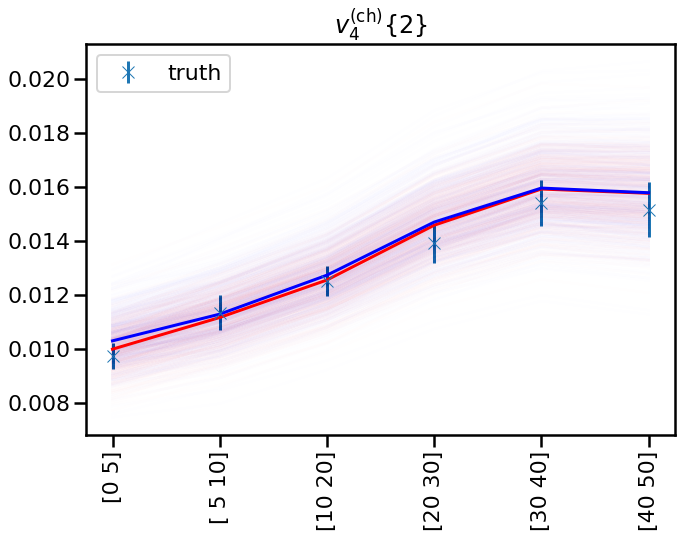

In [30]:
import seaborn as sns
sns.set_context('poster')
n_samples= 5000
samples = post_df.sample(n_samples,random_state=50).values

for obs_group in  obs_groups.keys():
    if obs_group=='fluct':
        continue;
    for obs in obs_groups[obs_group]:
        
        #print(obs)
        #print(index[obs])
        fig, ax = plt.subplots(figsize=(10,8))
        #tick_label = experiment.keys()[index[obs][0]: index[obs][1]]
        tick_label = obs_cent_list['Pb-Pb-2760'][obs]
        x = np.arange(0,len(tick_label))
        #print(x)
        #print(tick_label)
        x_np = np.arange(0, 98)[:, None]
        x_np = x_np.astype('object')
        y_low_avg = np.zeros(shape=x.shape)
        y_high_avg = np.zeros(shape=x.shape)
        n_low=0
        n_high=0
        for sample_i in range(0,len(samples)):
            sample = samples[sample_i ,:]
            #y_emu_er = np.sqrt(prediction.var()[index[obs][0]: index[obs][1],:].flatten())
            #ax.errorbar(x, y_emu,y_emu_er, label='emulation', fmt='.')
            
            if sample[0] >=28 and sample[0] <= 30 and n_high<500:
                print('high')
                print(prior_df.columns)
                print(sample)
                prediction = cal.emu.predict(x=x_np, theta=(np.array(sample).reshape(-1,15)).flatten())
                
                y_emu = prediction.mean()[index[obs][0]: index[obs][1],:].flatten()
                print(y_emu[0])
                ax.plot(x,y_emu,alpha=0.005, color='r')
                y_high_avg+=y_emu
                n_high+=1
            elif sample[0] <= 22 and sample[0] >= 18 and n_low<500:
                print('low')
                print(sample)
                prediction = cal.emu.predict(x=x_np, theta=(np.array(sample).reshape(-1,15)).flatten())
                y_emu = prediction.mean()[index[obs][0]: index[obs][1],:].flatten()
                print(y_emu[0])
                ax.plot(x,y_emu,alpha=0.005, color='blue')
                y_low_avg+=y_emu
                n_low+=1
            if n_low==500 and n_high==500:
                break;
                
        ax.plot(x,y_high_avg/n_high,color='r')
        ax.plot(x,y_low_avg/n_low,color='blue')
        print(f'Sample size low {n_low}, high {n_high}')
        y_sim = cal.y[index[obs][0]: index[obs][1]]
        y_sim_er = np.sqrt(cal.info['yvar'][index[obs][0]: index[obs][1]])
        ax.set_title(obs_tex_labels[obs])
        ax.errorbar(x, y_sim,y_sim_er, label='truth', fmt='x')
        ax.set_xticks(x)
        ax.set_xticklabels(tick_label, rotation=90)
        ax.legend()
        plt.tight_layout()
        plt.show()

In [ ]:
method_name = 'final_posterior'
#os.mkdir(method_name)
plot_corner_all(post_df,prior_df,method_name,nsamples,prune, MAP=MAP, closure=None)
#plot_corner_no_viscosity(post_df,prior_df,method_name,nsamples,prune, MAP=MAP, closure=None)
#plot_corner_viscosity(post_df,prior_df,method_name,nsamples,prune,MAP=MAP, closure=None)
#plot_shear(post_df,method_name,xlimits, nsamples,prune, MAP=None, closure=None)
#plot_bulk(post_df,method_name,xlimits, nsamples,prune,  MAP=None, closure=None)

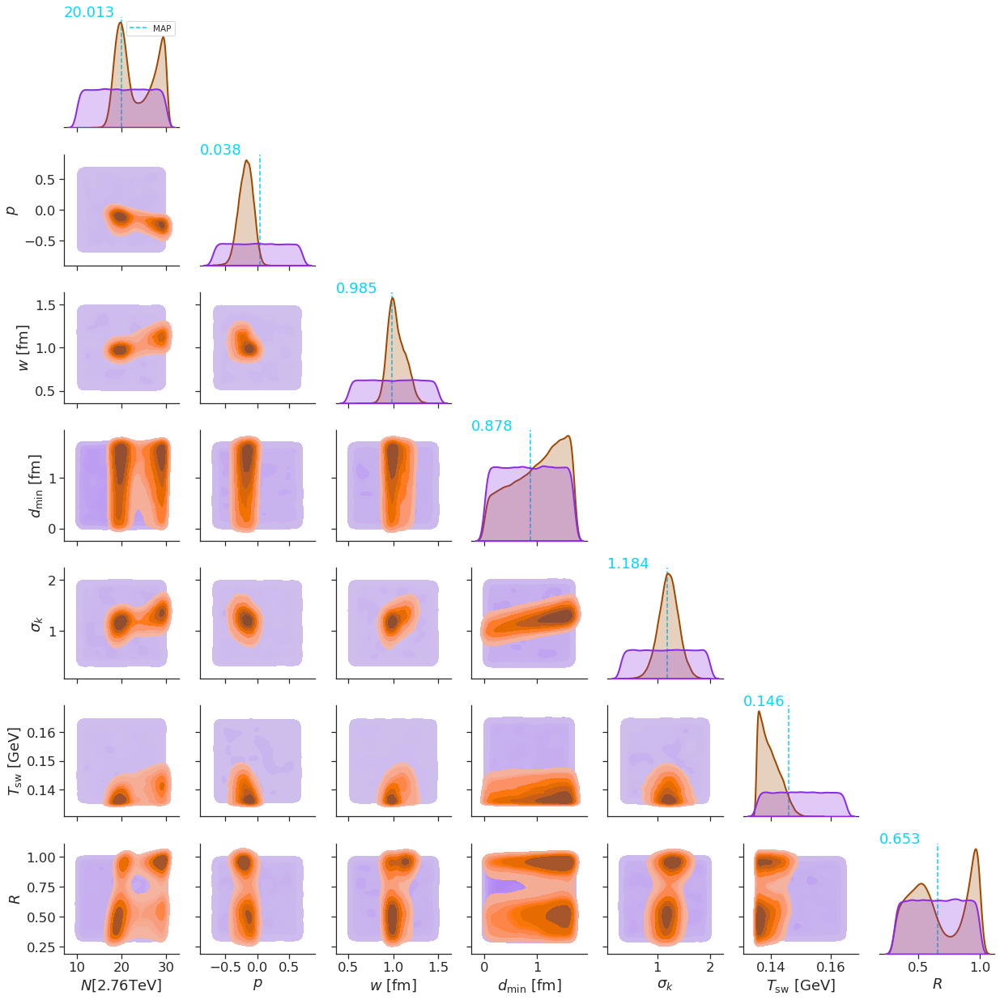

In [12]:
plot_corner_no_viscosity(post_df,prior_df,'PCSK',nsamples,prune, MAP)

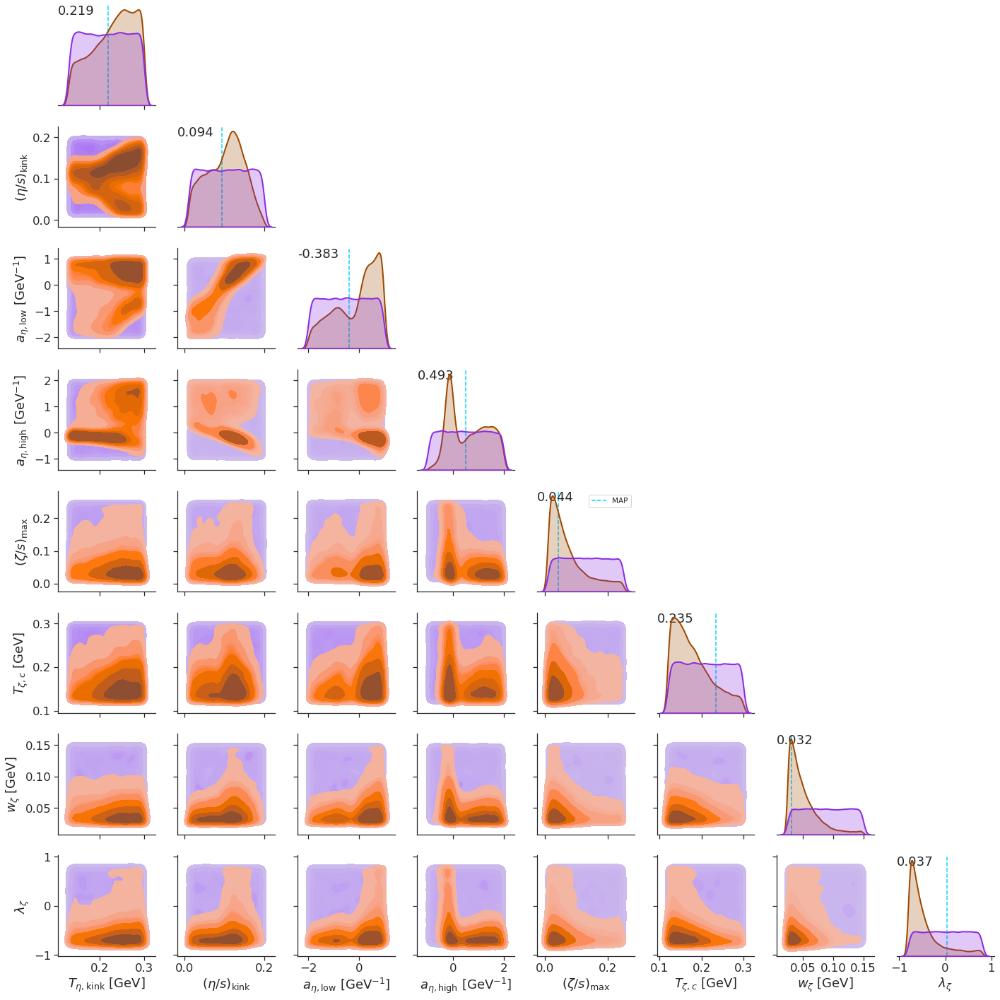

In [13]:
plot_corner_viscosity(post_df,prior_df,'PCSK',nsamples,prune, MAP)